In [4]:
%load_ext autoreload
%autoreload 2 
import sys
sys.path.insert(0, '../../')
sys.path.insert(0, '../preprocessing/')
sys.path.insert(0, '../')

import ESM_utils as esm
import os
import glob 
import shutil 
import re
#import plotly.graph_objects as go

import nibabel as nib

import create_pet_probability_matrix

import pandas as pd
import numpy as np
import nilearn.plotting as plotting
import itertools
import matplotlib.colors as colors
import seaborn as sns

import matplotlib.pyplot as plt
import math
from statannot import add_stat_annotation

from scipy import stats
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from nilearn import input_data, image

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [5]:
sns.set_style("whitegrid", {'axes.grid' : False})

In [6]:
def intersection(lst1, lst2): 
  
    # Use of hybrid method 
    temp = set(lst2) 
    lst3 = [value for value in lst1 if value in temp] 
    return lst3 

In [7]:
clinical_df = pd.read_csv("../../data/DIAN/participant_metadata/CLINICAL_D1801.csv")
genetic_df = pd.read_csv("../../data/DIAN/participant_metadata/GENETIC_D1801.csv")
pib_df = pd.read_csv("../../data/DIAN/participant_metadata/pib_D1801.csv")

/usr/local/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3063: DtypeWarning: Columns (139,152,512,991,997,999,1001,1003,1005,1013,1015,1019,1021,1039,1041,1043,1113,1117) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [8]:
dian_pup_voxelwise_ecdf_v00 = pd.read_csv("../../data/DIAN/pet_probability_matrices/DIAN_PUP_coregistered_voxelwise_ecdf_orig_method_ref-brainstem_75perc_v00.csv", index_col=0)
dian_pup_voxelwise_ecdf_v00.loc[:, 'visit'] = "v00"
dian_pup_voxelwise_ecdf_v01 = pd.read_csv("../../data/DIAN/pet_probability_matrices/DIAN_PUP_coregistered_voxelwise_ecdf_orig_method_ref-brainstem_75perc_v01.csv", index_col=0)
dian_pup_voxelwise_ecdf_v01.loc[:, 'visit'] = "v01"
dian_pup_voxelwise_ecdf_v02 = pd.read_csv("../../data/DIAN/pet_probability_matrices/DIAN_PUP_coregistered_voxelwise_ecdf_orig_method_ref-brainstem_75perc_v02.csv", index_col=0)
dian_pup_voxelwise_ecdf_v02.loc[:, 'visit'] = "v02"
dian_pup_voxelwise_ecdf_v03 = pd.read_csv("../../data/DIAN/pet_probability_matrices/DIAN_PUP_coregistered_voxelwise_ecdf_orig_method_ref-brainstem_75perc_v03.csv", index_col=0)
dian_pup_voxelwise_ecdf_v03.loc[:, 'visit'] = "v03"
dian_pup_voxelwise_ecdf_v04 = pd.read_csv("../../data/DIAN/pet_probability_matrices/DIAN_PUP_coregistered_voxelwise_ecdf_orig_method_ref-brainstem_75perc_v04.csv", index_col=0)
dian_pup_voxelwise_ecdf_v04.loc[:, 'visit'] = "v04"
dian_pup_voxelwise_ecdf_v05 = pd.read_csv("../../data/DIAN/pet_probability_matrices/DIAN_PUP_coregistered_voxelwise_ecdf_orig_method_ref-brainstem_75perc_v05.csv", index_col=0)
dian_pup_voxelwise_ecdf_v05.loc[:, 'visit'] = "v05"

In [9]:
wmh_df = pd.read_csv("../../data/DIAN/participant_metadata/wmh_df12.csv", index_col="Label")

In [10]:
for label in wmh_df.index: 
    sub = label.split("_")[0]
    visit = label.split("_")[1]
    wmh_df.loc[label, 'IMAGID'] = sub 
    wmh_df.loc[label, 'visit'] = visit
    wmh_df.loc[label, 'Label'] = label
wmh_df.index = wmh_df.IMAGID

In [11]:
### drop BS2VBS at v03 & "U482R7" at v00 as they were not fully processed with PUP
dian_pup_voxelwise_ecdf_v00 = dian_pup_voxelwise_ecdf_v00[dian_pup_voxelwise_ecdf_v00.index != "U482R7"]
dian_pup_voxelwise_ecdf_v03 = dian_pup_voxelwise_ecdf_v03[dian_pup_voxelwise_ecdf_v03.index != "BS2VBS"]

In [12]:
dian_pup_voxelwise_ecdf_all_visits = pd.concat([dian_pup_voxelwise_ecdf_v00,
                                                dian_pup_voxelwise_ecdf_v01, 
                                                dian_pup_voxelwise_ecdf_v02, 
                                                dian_pup_voxelwise_ecdf_v03,
                                                dian_pup_voxelwise_ecdf_v04,
                                                dian_pup_voxelwise_ecdf_v05])

In [13]:
roi_cols = dian_pup_voxelwise_ecdf_all_visits.columns[0:78]
subcortical_cols = ["globus pallidus", "thalamus", "hypothalamus", "putamen"]
roi_cols_to_exclude = [] 
for col in roi_cols: 
    for bad_col in subcortical_cols: 
        if bad_col in col.lower(): 
            roi_cols_to_exclude.append(col)
roi_cols_to_keep = [x for x in roi_cols if x not in roi_cols_to_exclude]
dian_pup_voxelwise_ecdf_all_visits[roi_cols_to_exclude] = 0

In [14]:
for sub in dian_pup_voxelwise_ecdf_all_visits.index: 
    sub_df = dian_pup_voxelwise_ecdf_all_visits[dian_pup_voxelwise_ecdf_all_visits.index == sub]
    visits = list(sub_df.visit)
    mutation = genetic_df[(genetic_df.IMAGID == sub)].Mutation.values[0]
    for i in range(0, len(visits)):
        visit = visits[i]
        dian_eyo = clinical_df[(clinical_df.IMAGID == sub) & (clinical_df.visit == visit)].DIAN_EYO.values
        age = clinical_df[(clinical_df.IMAGID == sub) & (clinical_df.visit == visit)].VISITAGEc.values
        if len(dian_eyo) == 0:
            print(sub + " " + visit)
        if len(dian_eyo) > 0:
            dian_pup_voxelwise_ecdf_all_visits.loc[(dian_pup_voxelwise_ecdf_all_visits.index == sub) & (dian_pup_voxelwise_ecdf_all_visits.visit == visit), "DIAN_EYO"] = dian_eyo[0]
            dian_pup_voxelwise_ecdf_all_visits.loc[(dian_pup_voxelwise_ecdf_all_visits.index == sub) & (dian_pup_voxelwise_ecdf_all_visits.visit == visit), "VISITAGEc"] = age[0]
            dian_pup_voxelwise_ecdf_all_visits.loc[(dian_pup_voxelwise_ecdf_all_visits.index == sub) & (dian_pup_voxelwise_ecdf_all_visits.visit == visit), "visitNumber"] = i + 1
            dian_pup_voxelwise_ecdf_all_visits.loc[(dian_pup_voxelwise_ecdf_all_visits.index == sub) & (dian_pup_voxelwise_ecdf_all_visits.visit == visit), "Mutation"] = mutation


In [15]:
dian_pup_voxelwise_ecdf_all_visits.head()

,Left Caudal anterior cingulate,Left Caudal middle frontal,Left Cuneus,Left entorinal,Left fusiform,Left Inferior parietal,Left Inferior temporal,Left Isthmus cingulate,Left Lateral Occipital,Left Lateral orbitofronal,...,Right Caudate,Right Hippocampus,Right Globus Pallidus,Right Putamen,Right Thalamus,visit,DIAN_EYO,VISITAGEc,visitNumber,Mutation
09NXRZ,0.000000,0.000000,0.000000e+00,0.000000,0.00000,0.000873,0.000000,0.000000,0.001178,0.001435,...,0.800702,2.282584e-04,0,0,0,v00,-11.544292,22.789041,1.0,1.0
0F9ACS,0.000000,0.000000,0.000000e+00,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000e+00,0,0,0,v00,-14.255284,33.536986,1.0,1.0
0LA7SQ,0.952713,0.400071,6.360225e-01,0.002138,0.24708,0.402461,0.322673,0.750151,0.355474,0.500048,...,0.634945,5.246594e-15,0,0,0,v00,-2.806088,46.638356,1.0,1.0
0O5OD0,0.000000,0.000000,0.000000e+00,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000285,0.000000e+00,0,0,0,v00,-15.786744,37.957781,1.0,0.0
0RN4X6,0.000000,0.000000,6.328179e-122,0.000000,0.00000,0.002050,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000e+00,0,0,0,v00,-19.342955,28.449315,1.0,1.0


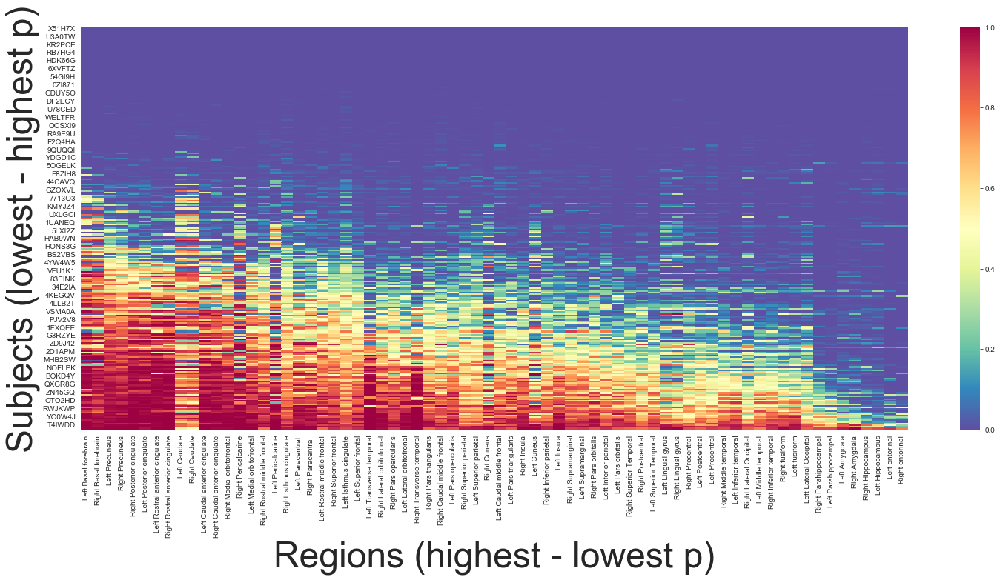

In [16]:
first_timepoint_heatmap = esm.Plot_Probabilites(dian_pup_voxelwise_ecdf_all_visits[(dian_pup_voxelwise_ecdf_all_visits.visitNumber == 1) & (dian_pup_voxelwise_ecdf_all_visits.Mutation == 1)][roi_cols], figsize=(25,10), cmap="Spectral_r")

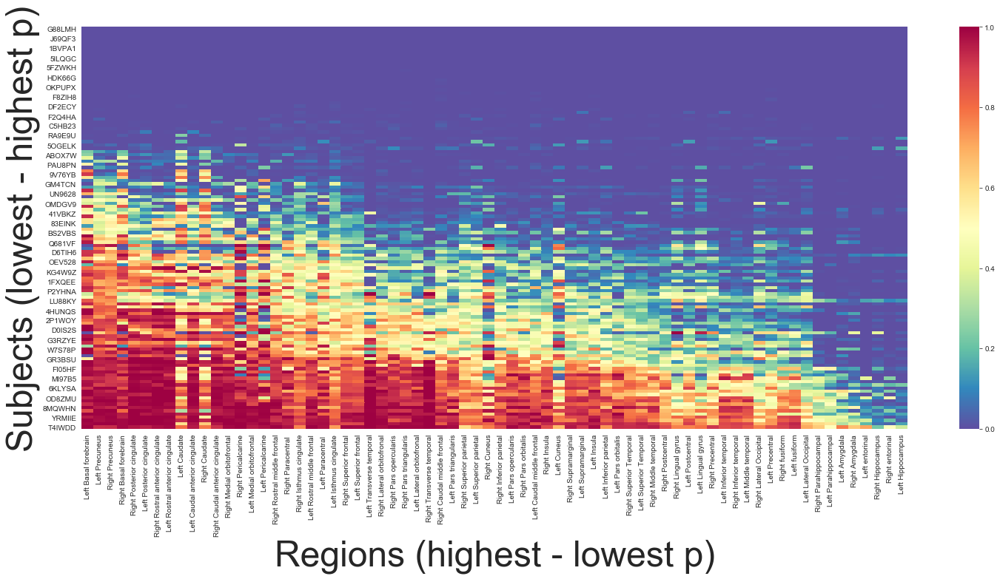

In [17]:
second_timepoint_heatmap = esm.Plot_Probabilites(dian_pup_voxelwise_ecdf_all_visits[(dian_pup_voxelwise_ecdf_all_visits.visitNumber == 2) & (dian_pup_voxelwise_ecdf_all_visits.Mutation == 1)][roi_cols], figsize=(25,10), cmap="Spectral_r")

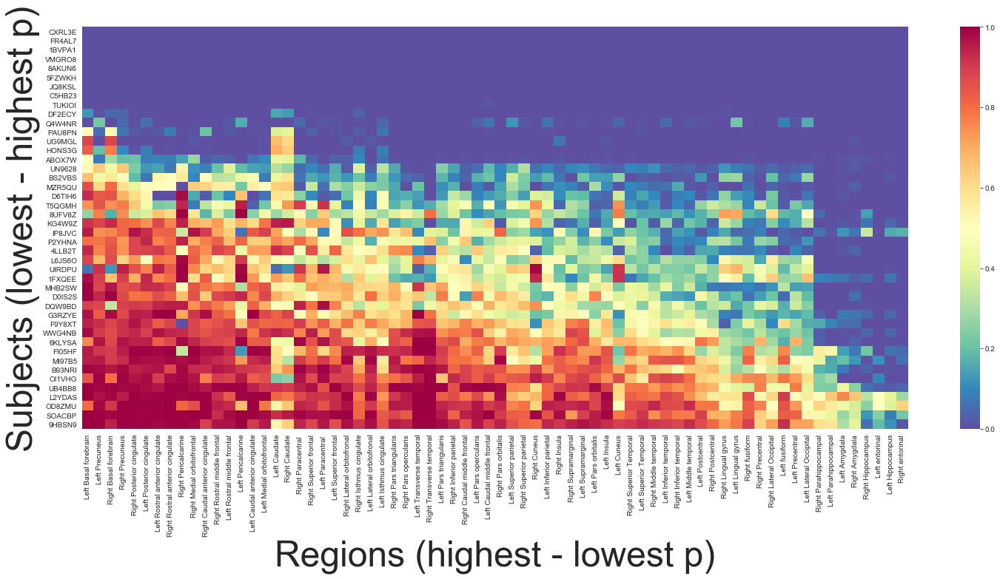

In [18]:
third_timepoint_heatmap = esm.Plot_Probabilites(dian_pup_voxelwise_ecdf_all_visits[(dian_pup_voxelwise_ecdf_all_visits.visitNumber == 3) & (dian_pup_voxelwise_ecdf_all_visits.Mutation == 1)][roi_cols], figsize=(25,10), cmap="Spectral_r")

In [19]:
# create separate dataframes for the different timepoints

dian_pup_voxelwise_ecdf_first_timepoint = dian_pup_voxelwise_ecdf_all_visits[dian_pup_voxelwise_ecdf_all_visits.visitNumber == 1]
dian_pup_voxelwise_ecdf_second_timepoint = dian_pup_voxelwise_ecdf_all_visits[dian_pup_voxelwise_ecdf_all_visits.visitNumber == 2]
dian_pup_voxelwise_ecdf_third_timepoint = dian_pup_voxelwise_ecdf_all_visits[dian_pup_voxelwise_ecdf_all_visits.visitNumber == 3]


In [20]:
dian_pup_voxelwise_ecdf_fourth_timepoint = dian_pup_voxelwise_ecdf_all_visits[dian_pup_voxelwise_ecdf_all_visits.visitNumber == 4]
dian_pup_voxelwise_ecdf_fifth_timepoint = dian_pup_voxelwise_ecdf_all_visits[dian_pup_voxelwise_ecdf_all_visits.visitNumber == 5]


In [21]:
dian_pup_voxelwise_ecdf_second_timepoint.shape

(199, 83)

In [22]:
all_subs_2nd_timepoint = intersection(list(dian_pup_voxelwise_ecdf_second_timepoint.index), list(dian_pup_voxelwise_ecdf_first_timepoint.index))

In [23]:
len(all_subs_2nd_timepoint)

199

In [24]:
dian_pup_voxelwise_ecdf_first_timepoint = dian_pup_voxelwise_ecdf_all_visits[(dian_pup_voxelwise_ecdf_all_visits.index.isin(all_subs_2nd_timepoint)) & (dian_pup_voxelwise_ecdf_all_visits.visitNumber == 1)]

In [25]:
dian_pup_voxelwise_ecdf_first_timepoint.shape

(199, 83)

### Cross-sectional ESM, first timepoint

In [26]:
dian_pup_voxelwise_ecdf_first_timepoint = dian_pup_voxelwise_ecdf_all_visits[dian_pup_voxelwise_ecdf_all_visits.visitNumber == 1]
dian_pup_voxelwise_ecdf_brainstem_t1_mutcarriers = dian_pup_voxelwise_ecdf_first_timepoint[dian_pup_voxelwise_ecdf_first_timepoint.Mutation == 1]
t1_mutcarriers = list(dian_pup_voxelwise_ecdf_brainstem_t1_mutcarriers.index)

In [27]:
len(t1_mutcarriers)

249

In [28]:
output_dir = '../../data/DIAN/esm_input_mat_files/'
conn_matrices = ['../../data/DIAN/connectivity_matrices/Matrix_ACP.mat', '../../data/DIAN/connectivity_matrices/Matrix_LONG.mat']
conn_mat_names = ['Map', 'Map']
conn_out_names = ['ACP', 'LONG']
file_names = '20190906_dian_pup_abeta_prob_om_75perc_brainstem_mutcar_v00.mat'
prob_matrices = {'test_data': dian_pup_voxelwise_ecdf_brainstem_t1_mutcarriers.loc[:, roi_cols]}
ages = list(dian_pup_voxelwise_ecdf_brainstem_t1_mutcarriers.loc[:, 'VISITAGEc'])

new connectivity matrix size: for ACP (70, 70)


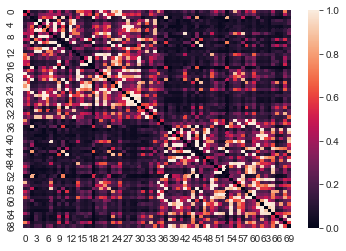

new connectivity matrix size: for LONG (70, 70)


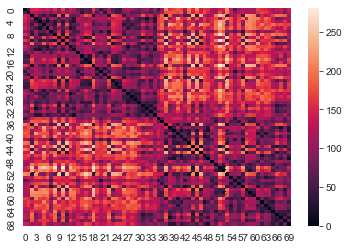

ESM input written to ../../data/DIAN/esm_input_mat_files/20190906_dian_pup_abeta_prob_om_75perc_brainstem_mutcar_v00.mat
===inputs:===
test_data
ACP
LONG
ages
===connectivity matrices===
../../data/DIAN/esm_input_mat_files/ACP.mat
../../data/DIAN/esm_input_mat_files/LONG.mat


In [29]:
esm.Prepare_Inputs_for_ESM(prob_matrices, 
                           ages, 
                           output_dir,
                           file_names, 
                           conn_matrices,
                           conn_mat_names,
                           conn_out_names)

In [30]:
dian_pup_voxelwise_ecdf_brainstem_v00_res_path = "../../data/DIAN/esm_output_mat_files/20190906_dian_pup_abeta_prob_om_75perc_brainstem_mutcar_v00_postcingmofprecuneus_ACP_25-Oct-2019.mat"
dian_pup_voxelwise_ecdf_brainstem_v00_mat = esm.loadmat(dian_pup_voxelwise_ecdf_brainstem_v00_res_path)  

In [31]:
dian_pup_voxelwise_ecdf_brainstem_v00_mat['ref_pattern'].shape

(70, 249)

In [32]:
dian_pup_voxelwise_ecdf_brainstem_t1_mutcarriers.shape

(249, 83)

In [33]:
dian_pup_voxelwise_ecdf_brainstem_v00_mat.keys()

dict_keys(['__header__', '__version__', '__globals__', 'AGEs', 'BETAS0', 'BETAS_est', 'Conn_Matrix', 'DELTAS0', 'DELTAS_est', 'Long_Matrix', 'MUS0', 'Nnodes', 'Nparameters', 'Nsubjects', 'ONSETS_est', 'SIGMAS0', 'h_integration', 'model_CORRs0', 'model_RMSEs0', 'model_parameters0', 'model_solutions0', 'model_times0', 'num_repetitions', 'param_corr_subs', 'ref_pattern', 'seed_regions_1', 'time_range'])

In [34]:
len(dian_pup_voxelwise_ecdf_brainstem_t1_mutcarriers.index)

249

### How did the ESM do with the epicenters set to DMN regions? 

/usr/local/lib/python3.7/site-packages/scipy/stats/stats.py:3508: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())


average r2 =  0.1436206767619028
average RMSE = 0.12782454683931285
average eval = 40649707.203612745


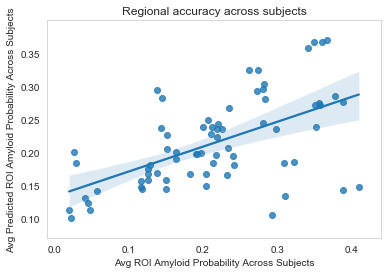

r2 =  0.32395956304216883 /n


/usr/local/lib/python3.7/site-packages/seaborn/categorical.py:3669: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


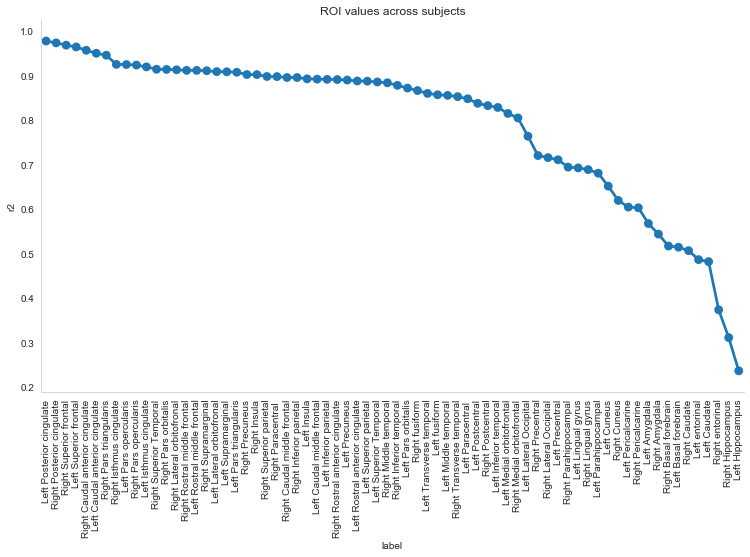

0.7952462278213109


/usr/local/lib/python3.7/site-packages/scipy/stats/stats.py:3508: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())


In [35]:
dian_pup_voxelwise_ecdf_brainstem_v00_dmn_res = esm.Evaluate_ESM_Results("../../data/DIAN/esm_output_mat_files/20190906_dian_pup_abeta_prob_om_75perc_brainstem_mutcar_v00_dmn_ACP_25-Oct-2019.mat",
                                                                     sids=dian_pup_voxelwise_ecdf_brainstem_t1_mutcarriers.index,
                                                                     labels=roi_cols_to_keep,
                                                                     lit=True)

## Evaluate result using the MOF, PC, and CAC as the epicenters

In [36]:
ref_pattern = dian_pup_voxelwise_ecdf_brainstem_v00_mat['ref_pattern'].transpose() 
ref_pattern_df = pd.DataFrame(index=dian_pup_voxelwise_ecdf_brainstem_t1_mutcarriers.index,columns=roi_cols)
ref_pattern_df[roi_cols_to_keep] = ref_pattern
ref_pattern_df[roi_cols_to_exclude] = 0
ref_pattern_df['DIAN_EYO'] = dian_pup_voxelwise_ecdf_first_timepoint['DIAN_EYO']
pred_pattern = dian_pup_voxelwise_ecdf_brainstem_v00_mat['model_solutions0'].transpose() 
pred_pattern_df = pd.DataFrame(index=ref_pattern_df.index,columns=roi_cols)
pred_pattern_df[roi_cols_to_keep] = pred_pattern
pred_pattern_df[roi_cols_to_exclude] = 0
pred_pattern_df['DIAN_EYO'] = ref_pattern_df['DIAN_EYO']

Text(0.5, 1.0, 'Average A$\\beta$ Pattern Across All MC')

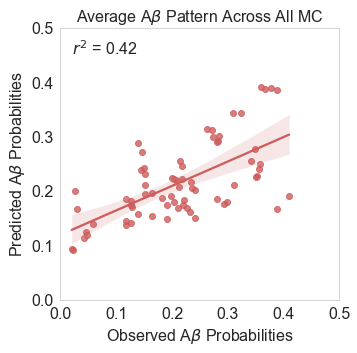

In [37]:
plt.figure(figsize=(5,5))
sns.regplot(ref_pattern.mean(0), pred_pattern.mean(0), color="indianred") 
r,p = stats.pearsonr(ref_pattern.mean(0), pred_pattern.mean(0))
r2 = r ** 2
plt.text(0.02, 0.45, "$r^2$ = {0}".format(np.round(r2, 2)), fontsize=16)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.xlim([0, 0.5])
plt.ylim([0, 0.5])
plt.xlabel(r"Observed A$\beta$ Probabilities", fontsize=16)
plt.ylabel(r"Predicted A$\beta$ Probabilities", fontsize=16)
plt.title(r"Average A$\beta$ Pattern Across All MC", fontsize=16)

In [38]:
rmse_range = []
for i in range(0, len(ref_pattern)):
    mse = mean_squared_error(ref_pattern[i,:], pred_pattern[i,:])
    rmse = np.sqrt(mse)
    rmse_range.append(rmse)

In [39]:
mae_range = []
for i in range(0, len(ref_pattern)):
    mae = mean_absolute_error(ref_pattern[i,:], pred_pattern[i,:])
    mae_range.append(mae)

(array([93.,  9.,  9., 11., 12., 14., 16., 43., 29., 13.]),
 array([3.31977969e-10, 3.03148218e-02, 6.06296433e-02, 9.09444647e-02,
        1.21259286e-01, 1.51574108e-01, 1.81888929e-01, 2.12203751e-01,
        2.42518572e-01, 2.72833394e-01, 3.03148215e-01]),
 <a list of 10 Patch objects>)

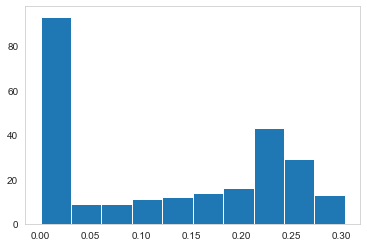

In [40]:
plt.hist(rmse_range)

(array([99., 11., 15., 12., 17.,  9., 23., 34., 18., 11.]),
 array([9.72102987e-11, 2.52639729e-02, 5.05279458e-02, 7.57919186e-02,
        1.01055891e-01, 1.26319864e-01, 1.51583837e-01, 1.76847810e-01,
        2.02111783e-01, 2.27375756e-01, 2.52639729e-01]),
 <a list of 10 Patch objects>)

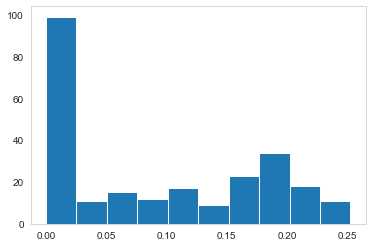

In [41]:
plt.hist(mae_range)

In [42]:
ref_pattern_df_transpose = ref_pattern_df.transpose()
pred_pattern_df_transpose = pred_pattern_df.transpose()

#### to-do: add mattsson early/middle/late accumulor status column

In [43]:
early_regions = ["precuneus", "posterior cingulate", "isthmus cingulate", "insula",
                 "medial orbitofrontal", "lateral orbitofrontal"]
late_regions = ["lingual", "pericalcarine", "paracentral", "precentral", "postcentral"]

In [44]:
for roi in roi_cols: 
    if "precuneus" in roi.lower() or "posterior cingulate" in roi.lower() or "isthmus cingulate" in roi.lower() \
        or "insula" in roi.lower() or "medial orbitofrontal" in roi.lower() or "lateral orbitofrontal" in roi.lower():
            ref_pattern_df_transpose.loc[roi, "ROI_Status"] = "Early"
            pred_pattern_df_transpose.loc[roi, "ROI_Status"] = "Early"
            ref_pattern_df_transpose.loc[roi, "ROI_Status_Color"] = "green"
            pred_pattern_df_transpose.loc[roi, "ROI_Status_Color"] = "green"
    elif "lingual" in roi.lower() or "pericalcarine" in roi.lower() or "paracentral" in roi.lower() \
        or "precentral" in roi.lower() or "postcentral" in roi.lower():
            ref_pattern_df_transpose.loc[roi, "ROI_Status"] = "Late"
            pred_pattern_df_transpose.loc[roi, "ROI_Status"] = "Late"
            ref_pattern_df_transpose.loc[roi, "ROI_Status_Color"] = "red"
            pred_pattern_df_transpose.loc[roi, "ROI_Status_Color"] = "red"
    else:
        ref_pattern_df_transpose.loc[roi, "ROI_Status"] = "Intermediate"
        pred_pattern_df_transpose.loc[roi, "ROI_Status"] = "Intermediate"
        ref_pattern_df_transpose.loc[roi, "ROI_Status_Color"] = "blue"
        pred_pattern_df_transpose.loc[roi, "ROI_Status_Color"] = "blue"


In [45]:
mattsson_early_acc_cols = []
for i, roi in enumerate(roi_cols_to_keep): 
    if "Medial orbitofrontal" in roi or "Posterior cingulate" in roi or "Precuneus" in roi: 
        print(i, roi)
        mattsson_early_acc_cols.append(i)

11 Left Medial orbitofrontal
20 Left Posterior cingulate
22 Left Precuneus
46 Right Medial orbitofrontal
55 Right Posterior cingulate
57 Right Precuneus


/usr/local/lib/python3.7/site-packages/scipy/stats/stats.py:3508: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())


average r2 =  0.17147081076942483
average RMSE = 0.12359311688086051
average eval = 18797061.822586145


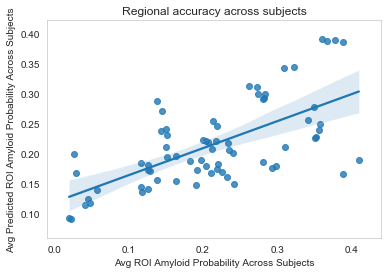

r2 =  0.4200751659330894 /n


/usr/local/lib/python3.7/site-packages/seaborn/categorical.py:3669: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


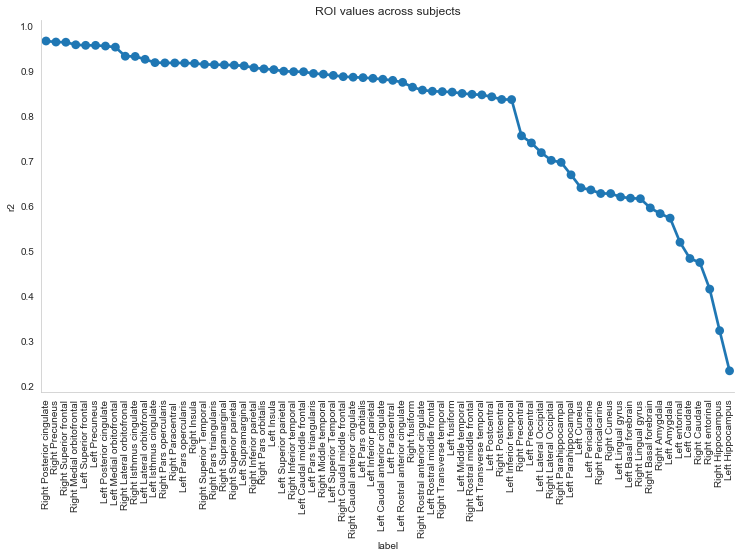

0.7996095387036555


/usr/local/lib/python3.7/site-packages/scipy/stats/stats.py:3508: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())


In [46]:
dian_pup_voxelwise_ecdf_brainstem_v00_mattsson_res = esm.Evaluate_ESM_Results(dian_pup_voxelwise_ecdf_brainstem_v00_res_path,
                                                                              sids=dian_pup_voxelwise_ecdf_brainstem_t1_mutcarriers.index,
                                                                              labels=roi_cols_to_keep,
                                                                              lit=True)

In [47]:
model_output_t1 = dian_pup_voxelwise_ecdf_brainstem_v00_mattsson_res['model_output']
for i, sub in enumerate(model_output_t1.index): 
    model_output_t1.loc[sub, 'esm_idx'] = i
    ref_pattern_df.loc[sub, 'esm_idx'] = i 
    pred_pattern_df.loc[sub, 'esm_idx'] = i
model_output_t1.loc[:, 'DIAN_EYO'] = dian_pup_voxelwise_ecdf_brainstem_t1_mutcarriers.loc[:, 'DIAN_EYO']
model_output_t1.loc[:, 'visit'] = dian_pup_voxelwise_ecdf_brainstem_t1_mutcarriers.loc[:, 'visit']
model_output_t1.loc[:, 'BETAS_est'] = dian_pup_voxelwise_ecdf_brainstem_v00_mat['BETAS_est']
model_output_t1.loc[:, 'DELTAS_est'] = dian_pup_voxelwise_ecdf_brainstem_v00_mat['DELTAS_est']
model_output_t1.loc[:, 'BDR'] = model_output_t1.loc[:, 'BETAS_est']/model_output_t1.loc[:, 'DELTAS_est']
model_output_t1.loc[:, 'BDR_Log'] = np.log(model_output_t1.loc[:, 'BETAS_est']/model_output_t1.loc[:, 'DELTAS_est'])
model_output_t1.fillna(0, inplace=True)

In [48]:
model_output_t1.head()

,model_r,model_r2,model_RMSE,model_eval,beta,delta,sigma,ref_age,times,Onset_age,esm_idx,DIAN_EYO,visit,BETAS_est,DELTAS_est,BDR,BDR_Log
09NXRZ,-0.017893,0.000320,1.461127e-01,8.180183e-01,2.3906,0.0001,0.0,22.789041,18.238356,4.550685,0.0,-11.544292,v00,0.620001,0.99995,0.620032,-0.477984
0F9ACS,0.000000,0.000000,3.319780e-10,3.600325e+08,0.0001,0.0001,0.0,33.536986,20.021918,13.515068,1.0,-14.255284,v00,0.000050,0.99995,0.000050,-9.903471
0LA7SQ,0.678346,0.460153,2.210475e-01,5.407112e-01,0.0405,100.0000,0.0,46.638356,15.495890,31.142466,2.0,-2.806088,v00,0.019979,0.01000,1.997937,0.692115
0RN4X6,0.402073,0.161663,4.524294e-03,2.641802e+01,0.3096,11.1109,0.0,28.449315,9.723288,18.726027,3.0,-19.342955,v00,0.139988,0.09000,1.555420,0.441745
0WWEAW,0.685967,0.470551,2.383298e-01,5.015019e-01,0.2378,14.2857,0.0,22.406325,12.676712,9.729613,4.0,-23.281175,v00,0.110010,0.07000,1.571569,0.452074


In [49]:
pup_cortical_analysis_col_idx = []
for i, roi in enumerate(roi_cols_to_keep): 
    if "precuneus" in roi.lower() or "superior frontal" in roi.lower() \
        or "rostral middle frontal" in roi.lower() or "lateral orbitofrontal" in roi.lower() \
        or "medial orbitofrontal" in roi.lower() or "superior temporal" in roi.lower() \
        or "middle temporal" in roi.lower() or "posterior cingulate" in roi.lower(): 
        print(i, roi)
        pup_cortical_analysis_col_idx.append(i)

11 Left Medial orbitofrontal
12 Left Middle temporal
20 Left Posterior cingulate
22 Left Precuneus
24 Left Rostral middle frontal
25 Left Superior frontal
27 Left Superior Temporal
46 Right Medial orbitofrontal
47 Right Middle temporal
55 Right Posterior cingulate
57 Right Precuneus
59 Right Rostral middle frontal
60 Right Superior frontal
62 Right Superior Temporal


In [50]:
cortical_analysis_col_idx = [0,1,5,6,7,9,11,12,15,16,17,20,22,24,25,26,27,29,
                             35,36,40,41,42,44,46,47,50,51,52,55,57,59,60,61,62,64]

In [51]:
for i, sub in enumerate(model_output_t1.index):
    avg_ref_cort_deposition = np.mean(ref_pattern[i, pup_cortical_analysis_col_idx])
    avg_pred_cort_deposition = np.mean(pred_pattern[i, pup_cortical_analysis_col_idx])
    model_output_t1.loc[sub, 'esm_idx'] = i
    model_output_t1.loc[sub, 'T1_Ref_CortROIMean'] = avg_ref_cort_deposition
    model_output_t1.loc[sub, 'Ref_MattssonEarlyAcc_Mean'] = np.mean(ref_pattern[i, mattsson_early_acc_cols])
    model_output_t1.loc[sub, 'T1_Pred_CortROIMean'] = avg_pred_cort_deposition
    model_output_t1.loc[sub, 'Pred_MattssoEarlyAcc_Mean'] = np.mean(pred_pattern[i, mattsson_early_acc_cols])

In [52]:
model_output_t1.columns

Index(['model_r', 'model_r2', 'model_RMSE', 'model_eval', 'beta', 'delta',
       'sigma', 'ref_age', 'times', 'Onset_age', 'esm_idx', 'DIAN_EYO',
       'visit', 'BETAS_est', 'DELTAS_est', 'BDR', 'BDR_Log',
       'T1_Ref_CortROIMean', 'Ref_MattssonEarlyAcc_Mean',
       'T1_Pred_CortROIMean', 'Pred_MattssoEarlyAcc_Mean'],
      dtype='object')

In [53]:
for sub in model_output_t1.index: 
    visit = model_output_t1.loc[sub, 'visit']
    if sub in wmh_df.index: 
        visits = list(wmh_df[wmh_df.IMAGID == sub].visit.values)
        if visit in visits: 
            model_output_t1.loc[sub, 'wmh_volume'] = wmh_df[(wmh_df.IMAGID == sub) & (wmh_df.visit == visit)].volume.values[0]
    #model_output.loc[sub, 'wmh_volume'] = wmh_df[(wmh_df.IMAGID == sub) & (wmh_df.visit == visit)].volume.values[0]

In [54]:
len(model_output_t1[model_output_t1.model_r2 > 0.15])

117

In [55]:
for sub in model_output_t1.index: 
    visit = dian_pup_voxelwise_ecdf_brainstem_t1_mutcarriers.loc[sub, 'visit']
    cdr = clinical_df[(clinical_df.IMAGID == sub) & (clinical_df.visit == visit)].cdrglob.values[0]
    mut_type = genetic_df[(genetic_df.IMAGID == sub) & (genetic_df.visit == visit)].fam_mutation.values[0]
    model_output_t1.loc[sub, 'CDR'] = cdr
    if model_output_t1.loc[sub, 'CDR'] == 0: 
        model_output_t1.loc[sub, 'Symptomatic'] = False 
    elif model_output_t1.loc[sub, 'CDR'] > 0:
        model_output_t1.loc[sub, 'Symptomatic'] = True
    model_output_t1.loc[sub, 'Fam_Mutation'] = mut_type
    model_output_t1.loc[sub, 'PIB_fSUVR_TOT_CORTMEAN'] = pib_df[(pib_df.IMAGID == sub) & (pib_df.visit == visit)].PIB_fSUVR_TOT_CORTMEAN.values[0]
    model_output_t1.loc[sub, 'PIB_fSUVR_rsf_TOT_CORTMEAN'] = pib_df[(pib_df.IMAGID == sub) & (pib_df.visit == visit)].PIB_fSUVR_rsf_TOT_CORTMEAN.values[0]

In [56]:
model_output_t1 = model_output_t1.dropna()

In [57]:
model_output_t1.shape

(243, 27)

In [58]:
model_output_t1.to_csv("../../data/DIAN/esm_output_mat_files/cross_sec_brainstem_results.csv")

0.8815821179938425


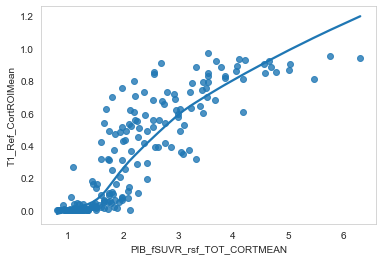

In [59]:
sns.regplot(model_output_t1.PIB_fSUVR_rsf_TOT_CORTMEAN,model_output_t1.T1_Ref_CortROIMean, lowess=True)
r,p = stats.pearsonr(model_output_t1.PIB_fSUVR_rsf_TOT_CORTMEAN,model_output_t1.T1_Ref_CortROIMean)
print(r)

In [60]:
slope, intercept, r_value, p_value, std_err = stats.linregress(model_output_t1.PIB_fSUVR_rsf_TOT_CORTMEAN, 
                                                               model_output_t1.T1_Ref_CortROIMean)

In [61]:
ab_neg_subs = list(pib_df[pib_df.PIB_fSUVR_rsf_TOT_CORTMEAN < 1.42].IMAGID.values)

In [62]:
len(pib_df[(genetic_df.IMAGID.isin(ab_neg_subs)) & (genetic_df.Mutation == 1) & (pib_df.visit == 'v00')])

104

In [63]:
ab_pos_prob_cutoff = slope*1.42 + intercept

In [64]:
ab_pos_sub_esm_idx = list(model_output_t1[model_output_t1.T1_Ref_CortROIMean >= ab_pos_prob_cutoff].esm_idx)
ab_pos_sub_esm_idx = [int(x) for x in ab_pos_sub_esm_idx]

ab_neg_sub_esm_idx = list(model_output_t1[model_output_t1.T1_Ref_CortROIMean < ab_pos_prob_cutoff].esm_idx)
ab_neg_sub_esm_idx = [int(x) for x in ab_neg_sub_esm_idx]

In [65]:
np.round(ab_pos_prob_cutoff,3)

0.122

In [66]:
for sub in model_output_t1.index: 
    if model_output_t1.loc[sub, 'T1_Ref_CortROIMean'] >= 0.122: 
        model_output_t1.loc[sub, 'T1_AB_Positive'] = True
    else: 
        model_output_t1.loc[sub, 'T1_AB_Positive'] = False

/usr/local/lib/python3.7/site-packages/pandas/core/indexing.py:844: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)
/usr/local/lib/python3.7/site-packages/pandas/core/indexing.py:965: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


In [66]:
len(model_output_t1[model_output_t1.T1_Ref_CortROIMean >= ab_pos_prob_cutoff])

107

In [67]:
len(model_output_t1[model_output_t1.T1_Ref_CortROIMean < ab_pos_prob_cutoff])

136

In [68]:
model_output_t1.shape

(243, 28)

Mean ESM r2 for AB positive subjects: 0.308
SD: 0.12
Mean ESM r2 for AB negative subjects: 0.049
SD: 0.096


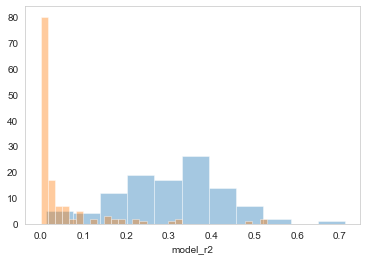

In [69]:
mean_abpos = np.mean(model_output_t1[model_output_t1.T1_Ref_CortROIMean >= ab_pos_prob_cutoff].model_r2)
std_abpos = np.std(model_output_t1[model_output_t1.T1_Ref_CortROIMean >= ab_pos_prob_cutoff].model_r2)

mean_abneg = np.mean(model_output_t1[model_output_t1.T1_Ref_CortROIMean < ab_pos_prob_cutoff].model_r2)
std_abneg = np.std(model_output_t1[model_output_t1.T1_Ref_CortROIMean < ab_pos_prob_cutoff].model_r2)

print("Mean ESM r2 for AB positive subjects: {0}\nSD: {1}".format(str(np.round(mean_abpos, 3)), 
                                                                  str(np.round(std_abpos,3))))

print("Mean ESM r2 for AB negative subjects: {0}\nSD: {1}".format(str(np.round(mean_abneg, 3)), 
                                                                  str(np.round(std_abneg,3))))

sns.distplot(model_output_t1[model_output_t1.T1_Ref_CortROIMean >= ab_pos_prob_cutoff].model_r2, kde=False)
sns.distplot(model_output_t1[model_output_t1.T1_Ref_CortROIMean < ab_pos_prob_cutoff].model_r2, kde=False)

In [70]:
model_output_t1.to_csv("../../data/DIAN/esm_output_mat_files/model_output_mattssonseed_brainstem_t1.csv")

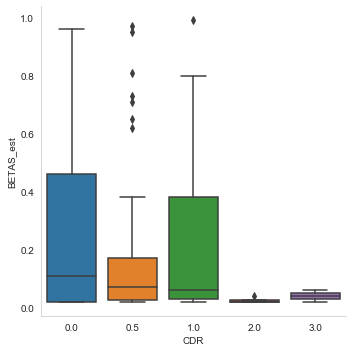

In [71]:
sns.catplot(x="CDR", y="BETAS_est", data=model_output_t1[model_output_t1.PIB_fSUVR_rsf_TOT_CORTMEAN > 1.42], kind="box")

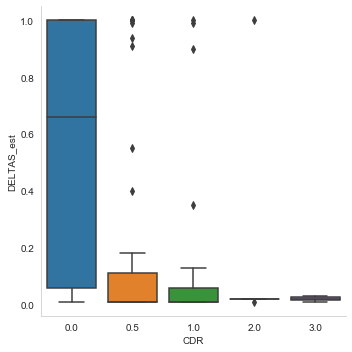

In [72]:
sns.catplot(x="CDR", y="DELTAS_est", data=model_output_t1[model_output_t1.PIB_fSUVR_rsf_TOT_CORTMEAN > ab_pos_prob_cutoff], kind="box")

Clinical Dementia Rating (Global Score) Conversion
- 0 = Normal
- 0.5 = Very Mild Dementia
- 1 = Mild Dementia
- 2 = Moderate Dementia
- 3 = Severe Dementia


In [73]:
for dx in list(set(model_output_t1.CDR)):
    n = len(model_output_t1[model_output_t1.CDR == dx])
    print("{0}: {1}".format(dx, n))

0.0: 168
0.5: 47
2.0: 5
3.0: 2
1.0: 21


In [74]:
for sub in model_output_t1.index: 
    visit == model_output_t1.loc[sub, 'visit']
    apoe = genetic_df[(genetic_df.IMAGID == sub)].apoe.values[0]
    num_apoe4_copies = 0
    if apoe == 24 or apoe == 34: 
        num_apoe4_copies = 1
    elif apoe == 44:
        num_apoe4_copies = 2 
    model_output_t1.loc[sub, 'apoe'] = apoe
    model_output_t1.loc[sub, 'apoe4_copies'] = num_apoe4_copies

/usr/local/lib/python3.7/site-packages/pandas/core/indexing.py:844: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)
/usr/local/lib/python3.7/site-packages/pandas/core/indexing.py:965: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


Text(0.15, 0.9, 'Within-subject A$\\beta$ patterns')

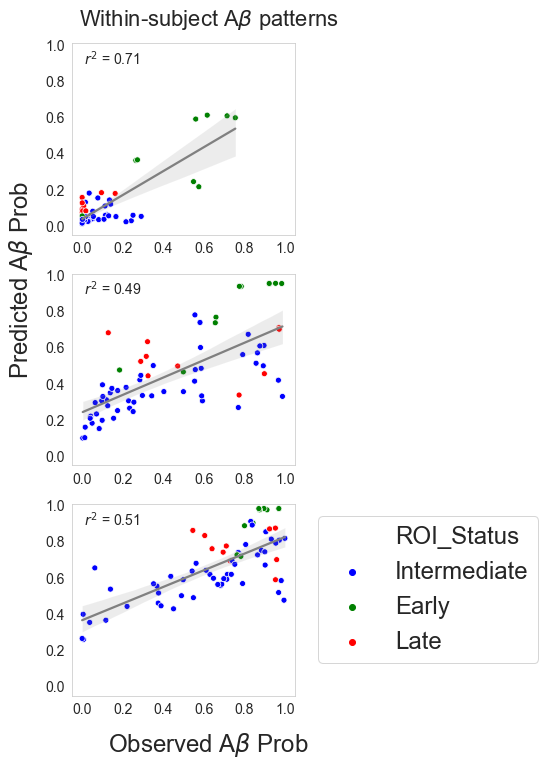

In [75]:
#fig,ax = plt.subplots(nrows=1, ncols=4, sharex=True,sharey=True)
fig = plt.figure(figsize=(4,12))
i = 1
for sub in ["2P1WOY", "ZD9J42", "ZN45GQ"]:
    plt.subplot(3,1,i)
    eyo = model_output_t1.loc[sub, 'DIAN_EYO']
    cdr = model_output_t1.loc[sub, 'CDR']
    g = sns.scatterplot(x=list(ref_pattern_df_transpose.loc[roi_cols_to_keep,sub]), y=list(pred_pattern_df_transpose.loc[roi_cols_to_keep,sub]),
            hue=ref_pattern_df_transpose.loc[roi_cols_to_keep,"ROI_Status"], palette=["blue", "green", "red"])
    r,p = stats.pearsonr(ref_pattern_df_transpose.loc[roi_cols_to_keep,sub], pred_pattern_df_transpose.loc[roi_cols_to_keep,sub])
    r2 = r**2
    plt.text(s=r"$r^2$ = {0}".format(np.round(r2,2)), x=0.01, y=0.89, fontsize=14)
    sns.regplot(x=list(ref_pattern_df_transpose.loc[roi_cols_to_keep,sub]), y=list(pred_pattern_df_transpose.loc[roi_cols_to_keep,sub]), scatter=False, ax=g.axes, color="grey")
    #plt.title("EYO: {0}".format(np.round(eyo,1)), fontsize=14)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.xlim(-0.05,1.05)
    plt.ylim(-0.05,1.01)
    i += 1
    plt.gca().legend_.remove()
plt.gca().legend().set_title('')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=24)
fig.text(x=0.25,y=0.06,s=r"Observed A$\beta$ Prob", fontsize=24)
fig.text(x=-0.1, y=0.5,s=r"Predicted A$\beta$ Prob", rotation=90, fontsize=24)
fig.text(x=0.15, y=.9,s=r"Within-subject A$\beta$ patterns",fontsize=22)

Text(0.06, 0.18, 'Predicted A$\\beta$ Prob')

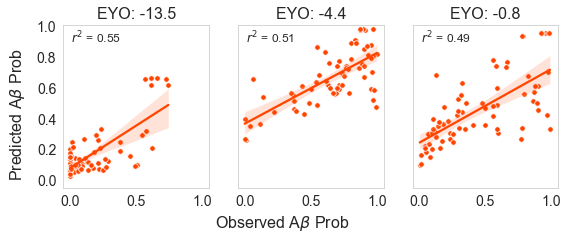

In [76]:
#fig,ax = plt.subplots(nrows=1, ncols=4, sharex=True,sharey=True)
fig = plt.figure(figsize=(12,3))
i = 1
for sub in ["A401RO","ZN45GQ", "ZD9J42"]:
    plt.subplot(1,4,i)
    eyo = model_output_t1.loc[sub, 'DIAN_EYO']
    cdr = model_output_t1.loc[sub, 'CDR']
    g = sns.scatterplot(x=list(ref_pattern_df_transpose.loc[roi_cols_to_keep,sub]), y=list(pred_pattern_df_transpose.loc[roi_cols_to_keep,sub]),
            color="orangered", s=30)
    r,p = stats.pearsonr(ref_pattern_df_transpose.loc[roi_cols_to_keep,sub], pred_pattern_df_transpose.loc[roi_cols_to_keep,sub])
    r2 = r**2
    sns.regplot(x=list(ref_pattern_df_transpose.loc[roi_cols_to_keep,sub]), y=list(pred_pattern_df_transpose.loc[roi_cols_to_keep,sub]), scatter=False, color="orangered")
    #plt.title("EYO: {0}".format(np.round(eyo,1)), fontsize=14)
    plt.text(s=r"$r^2$ = {0}".format(np.round(r2,2)), x=0.01, y=0.89, fontsize=12)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    if i > 1: 
        plt.yticks([])
    plt.xlim(-0.05,1.05)
    plt.ylim(-0.05,1.01)
    plt.title("EYO: {0}".format(np.round(eyo,1)), fontsize=16)
    i += 1
    #plt.gca().legend_.remove()
#plt.gca().legend().set_title('')
#plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
fig.text(x=0.3,y=-0.06,s=r"Observed A$\beta$ Prob", fontsize=16)
fig.text(x=0.06, y=0.18,s=r"Predicted A$\beta$ Prob", rotation=90, fontsize=16)

In [86]:
for sub in model_output_t1.index: 
    if model_output_t1.loc[sub, 'Symptomatic'] == True: 
        model_output_t1.loc[sub, 'Symptomatic'] = 'True'
    else:
        model_output_t1.loc[sub, 'Symptomatic'] = 'False'
    if model_output_t1.loc[sub, 'T1_AB_Positive'] == True: 
        model_output_t1.loc[sub, 'T1_AB_Positive'] = 'True'
    else:
        model_output_t1.loc[sub, 'T1_AB_Positive'] = 'False'

/usr/local/lib/python3.7/site-packages/pandas/core/indexing.py:965: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

False v.s. True: t-test independent samples, P_val=2.941e-01 stat=1.054e+00
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

False v.s. True: t-test independent samples, P_val=3.275e-01 stat=9.837e-01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

False v.s. True: t-test independent samples, P_val=1.666e-01 stat=-1.393e+00
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

False v.s. True: t-test independent samples, P_val=2.133e-02 stat=-2.337e+00


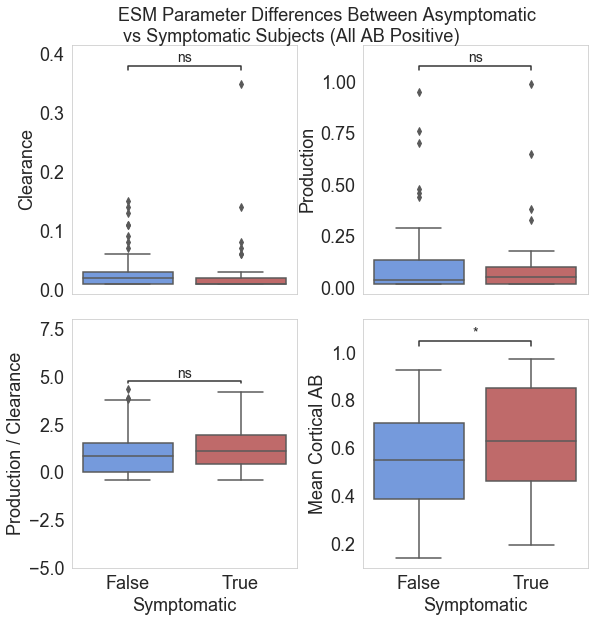

In [84]:
fig,ax = plt.subplots(nrows=2,ncols=2,figsize=(8,8), constrained_layout=True, sharey=False)
ylabels = ["Clearance", "Production", "Production / Clearance", "Mean Cortical AB"]
cols = ["DELTAS_est", "BETAS_est", "BDR_Log", "T1_Ref_CortROIMean"]
k = 0
j = 0
for i, col in enumerate(cols):
    if i == 1:  
        k = 0
        j = 1 
    elif i == 2: 
        k = 1 
        j = 0 
    elif i == 3: 
        k = 1
        j = 1
    g = sns.boxplot(x="Symptomatic", 
                    y=col, 
                    data=model_output_t1[model_output_t1.T1_Ref_CortROIMean > ab_pos_prob_cutoff], 
                    ax=ax[k][j], 
                    palette=["cornflowerblue", "indianred"])
    add_stat_annotation(g, data=model_output_t1[model_output_t1.T1_Ref_CortROIMean > ab_pos_prob_cutoff], 
                        x="Symptomatic", y=col,
                        box_pairs=[('False', 'True')],
                        test='t-test_ind', text_format='star', loc='inside', verbose=2, 
                        fontsize=14)
    g.set_xlabel("Symptomatic", fontsize=18)
    g.set_ylabel(ylabels[i],fontsize=18)
    ax[k][j].set_xticklabels(labels=["False", "True"],fontsize=18)
    ax[k][j].tick_params(axis = 'both', which = 'major', labelsize=18)
    if i == 0 or i == 1: 
        g.set_xlabel("")
        ax[k][j].set_xticklabels("",fontsize=18)
    if i == 2: 
        ax[k][j].set_ylim(-5,8)
fig.text(x=.18,y=1,s="ESM Parameter Differences Between Asymptomatic\n vs Symptomatic Subjects (All AB Positive)", fontsize=18)        
plt.show()

In [ ]:
model_output_t1.head()

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

True v.s. False: t-test independent samples, P_val=5.303e-16 stat=-9.763e+00
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

True v.s. False: t-test independent samples, P_val=1.160e-08 stat=-6.250e+00
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

True v.s. False: t-test independent samples, P_val=7.261e-01 stat=3.514e-01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

True v.s. False: t-test independent samples, P_val=7.595e-13 stat=8.283e+00


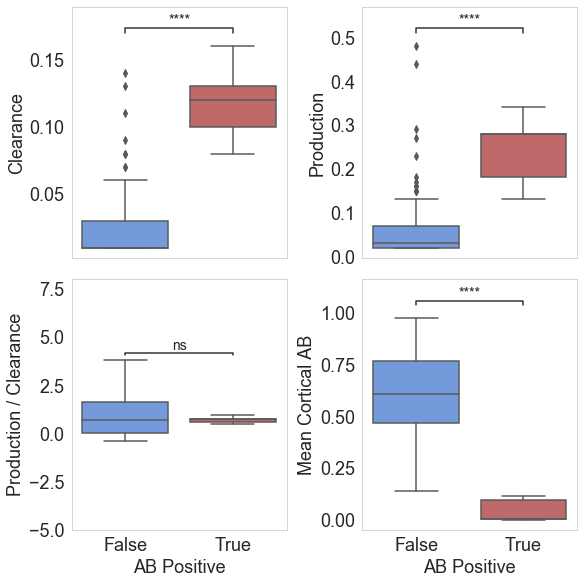

In [87]:
fig,ax = plt.subplots(nrows=2,ncols=2,figsize=(8,8), constrained_layout=True, sharey=False)
ylabels = ["Clearance", "Production", "Production / Clearance", "Mean Cortical AB"]
cols = ["DELTAS_est", "BETAS_est", "BDR_Log", "T1_Ref_CortROIMean"]
k = 0
j = 0
for i, col in enumerate(cols):
    if i == 1:  
        k = 0
        j = 1 
    elif i == 2: 
        k = 1 
        j = 0 
    elif i == 3: 
        k = 1
        j = 1
    g = sns.boxplot(x="T1_AB_Positive", 
                    y=col, 
                    data=model_output_t1[model_output_t1.model_r2 > 0.2], 
                    ax=ax[k][j], 
                    palette=["cornflowerblue", "indianred"])
    add_stat_annotation(g, data=model_output_t1[model_output_t1.model_r2 > 0.2], 
                        x="T1_AB_Positive", y=col,
                        box_pairs=[('False', 'True')],
                        test='t-test_ind', text_format='star', loc='inside', verbose=2, 
                        fontsize=14)
    g.set_xlabel("AB Positive", fontsize=18)
    g.set_ylabel(ylabels[i],fontsize=18)
    ax[k][j].set_xticklabels(labels=["False", "True"],fontsize=18)
    ax[k][j].tick_params(axis = 'both', which = 'major', labelsize=18)
    if i == 0 or i == 1: 
        g.set_xlabel("")
        ax[k][j].set_xticklabels("",fontsize=18)
    if i == 2: 
        ax[k][j].set_ylim(-5,8)
        
plt.show()

In [88]:
np.percentile(model_output_t1[model_output_t1.CDR==0].T1_Ref_CortROIMean,25)

0.00019322170673481218

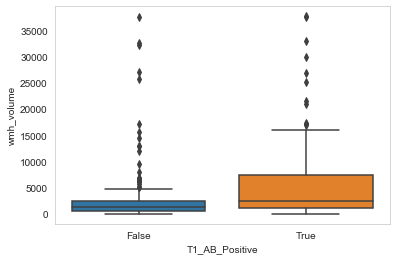

In [89]:
sns.boxplot(x="T1_AB_Positive", y="wmh_volume", data=model_output_t1)

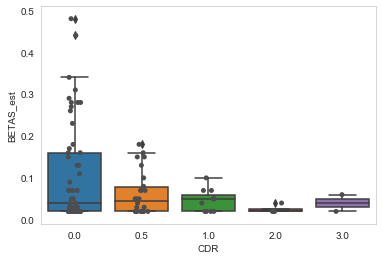

In [90]:
ax=sns.boxplot(x="CDR", y="BETAS_est", data=model_output_t1[model_output_t1.model_r2 > 0.2])
ax=sns.stripplot(x="CDR", y="BETAS_est", data=model_output_t1[model_output_t1.model_r2 > 0.2], color=".3")

(-0.02, 0.8)

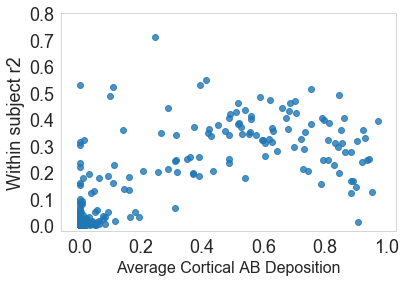

In [91]:
sns.regplot(model_output_t1.T1_Ref_CortROIMean, model_output_t1.model_r2, lowess=True, fit_reg=False)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.title("", fontsize=18)
plt.xlabel("Average Cortical AB Deposition", fontsize=16)
plt.ylabel("Within subject r2", fontsize=18)
plt.ylim([-0.02,.8])

Text(0, 0.5, 'Count')

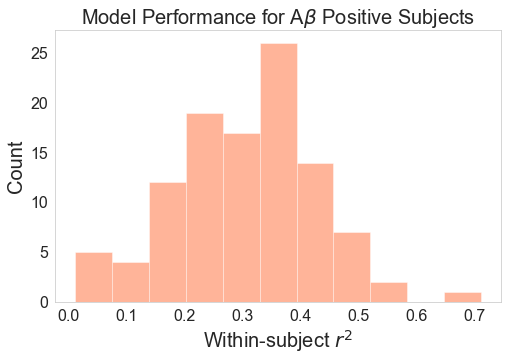

In [92]:
plt.figure(figsize=(8,5))
sns.distplot(model_output_t1[model_output_t1.esm_idx.isin(ab_pos_sub_esm_idx)].model_r2, color="orangered", kde=False)
plt.title(r"Model Performance for A$\beta$ Positive Subjects", fontsize=20)
plt.xticks(fontsize=16)
plt.xlabel("Within-subject $r^2$", fontsize=20)
plt.yticks(fontsize=16)
plt.ylabel("Count", fontsize=20)

r2: 0.5998664243053597


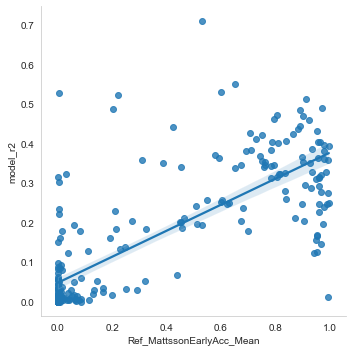

In [93]:
sns.lmplot(x="Ref_MattssonEarlyAcc_Mean", y="model_r2", data=model_output_t1)
r,p = stats.pearsonr(model_output_t1.Ref_MattssonEarlyAcc_Mean, model_output_t1.model_r2)
r2 = r ** 2
print("r2: {0}".format(str(r2)))

In [96]:
dkt_atlas = nib.load("../../data/atlases/dkt_atlas_1mm.nii.gz")
dkt_data = dkt_atlas.get_data()

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:2: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  


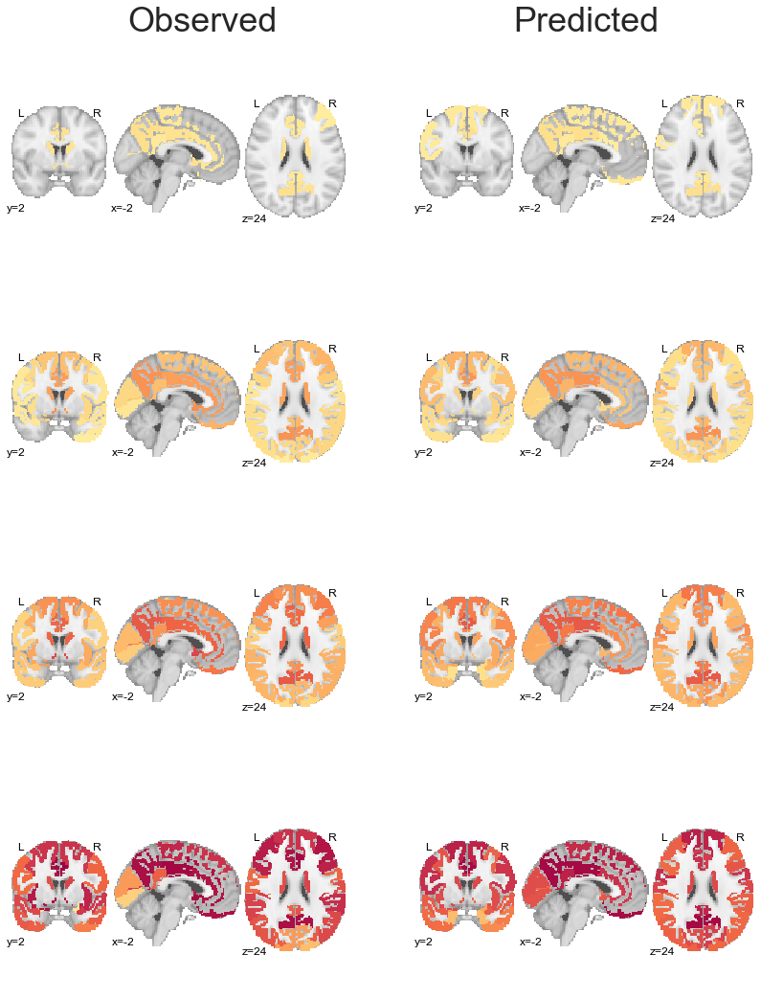

In [97]:
#threshold = 0.3
age_ranges = [[-20, -10], [-10,0], [0,10], [10,20]] 
threshold=ab_pos_prob_cutoff
img_slice = [-2, 2, 24]
n_rows = len(age_ranges)
fig = plt.figure(figsize=(14,18))

for idx, ar in enumerate(age_ranges):
    loc = 2*(idx+1)-1

    curr_ref_probs = np.zeros_like(dkt_data)
    curr_pred_probs = np.zeros_like(dkt_data)
    for i in range(0, len(roi_cols)): 
        n = len(ref_pattern_df[(ref_pattern_df.DIAN_EYO > ar[0]) & (ref_pattern_df.DIAN_EYO < ar[1])][roi_cols[i]])
        curr_ref_probs[dkt_data==(i+1)] = np.mean(ref_pattern_df[(ref_pattern_df.DIAN_EYO > ar[0]) & (ref_pattern_df.DIAN_EYO < ar[1])][roi_cols[i]])
        curr_pred_probs[dkt_data==(i+1)] = np.mean(pred_pattern_df[(pred_pattern_df.DIAN_EYO > ar[0]) & (pred_pattern_df.DIAN_EYO < ar[1])][roi_cols[i]])
    curr_ref_probs_img = nib.Nifti1Image(curr_ref_probs, affine=dkt_atlas.affine, header=dkt_atlas.header)
    curr_pred_probs_img = nib.Nifti1Image(curr_pred_probs, affine=dkt_atlas.affine, header=dkt_atlas.header)

    ax1 = plt.subplot(n_rows, 2, loc)
    plotting.plot_stat_map(curr_ref_probs_img, colorbar=False, draw_cross=False, vmax=1, cut_coords=img_slice, axes=ax1, threshold=threshold, cmap="Spectral_r")
    #plt.title("EYO: {0} to {1} (n = {2})".format(str(ar[0]), str(ar[1]), str(n)), fontsize=36)
    ax2 = plt.subplot(n_rows, 2, loc+1)
    plotting.plot_stat_map(curr_pred_probs_img, colorbar=False, draw_cross=False, vmax=1, cut_coords=img_slice, axes=ax2, threshold=threshold, cmap="Spectral_r")
    #threshold += 0.1
#fig.text(x=0.35, y = 0.95, s = "Ref Region: Brainstem", fontsize=36)
fig.text(x=0.25, y=0.9,s="Observed", fontsize=36)
fig.text(x=0.65, y=0.9,s="Predicted", fontsize=36)
plt.show()

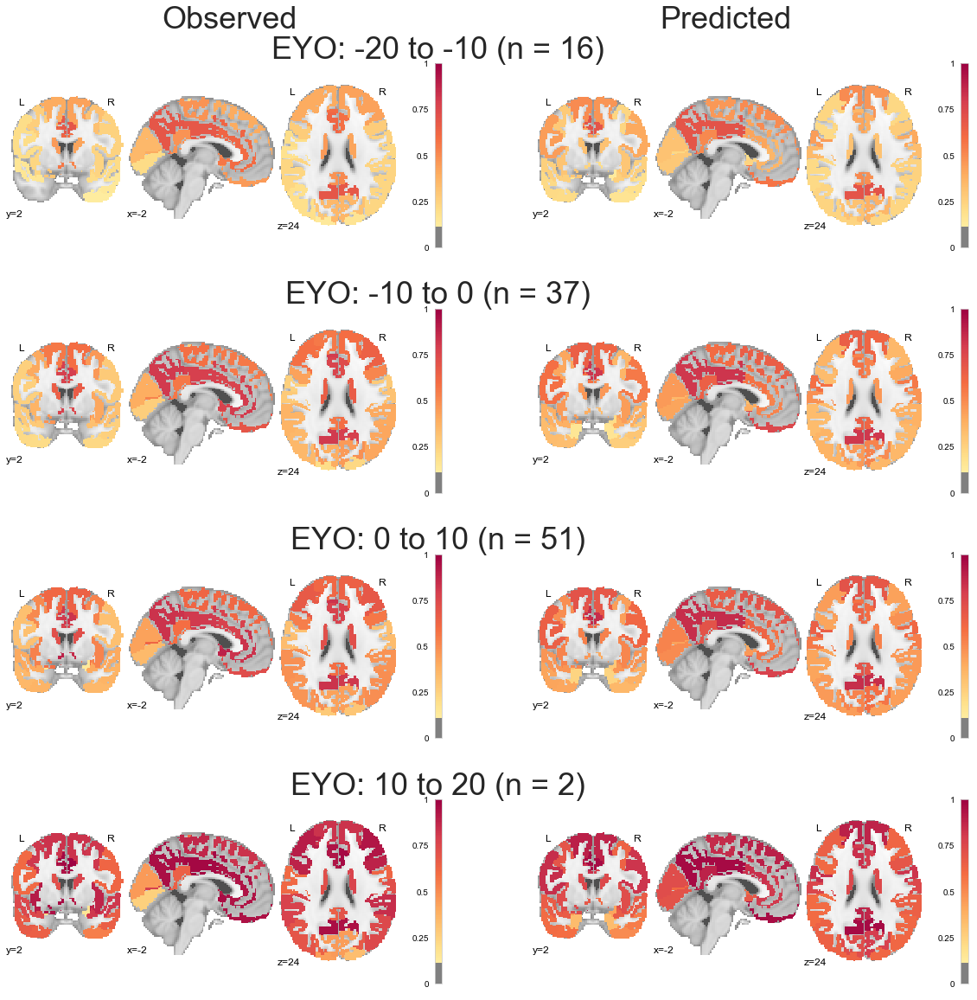

In [98]:
#threshold = 0.3
age_ranges = [[-20, -10], [-10,0], [0,10], [10,20]] 
threshold=ab_pos_prob_cutoff
img_slice = [-2, 2, 24]
n_rows = len(age_ranges)
fig = plt.figure(figsize=(20,20))

for idx, ar in enumerate(age_ranges):
    loc = 2*(idx+1)-1

    curr_ref_probs = np.zeros_like(dkt_data)
    curr_pred_probs = np.zeros_like(dkt_data)
    for i in range(0, len(roi_cols)): 
        n = len(ref_pattern_df[(ref_pattern_df.esm_idx.isin(ab_pos_sub_esm_idx)) & (ref_pattern_df.DIAN_EYO > ar[0]) & (ref_pattern_df.DIAN_EYO < ar[1])][roi_cols[i]])
        curr_ref_probs[dkt_data==(i+1)] = np.mean(ref_pattern_df[(ref_pattern_df.esm_idx.isin(ab_pos_sub_esm_idx)) & (ref_pattern_df.DIAN_EYO > ar[0]) & (ref_pattern_df.DIAN_EYO < ar[1])][roi_cols[i]])
        curr_pred_probs[dkt_data==(i+1)] = np.mean(pred_pattern_df[(ref_pattern_df.esm_idx.isin(ab_pos_sub_esm_idx)) & (pred_pattern_df.DIAN_EYO > ar[0]) & (pred_pattern_df.DIAN_EYO < ar[1])][roi_cols[i]])
    curr_ref_probs_img = nib.Nifti1Image(curr_ref_probs, affine=dkt_atlas.affine, header=dkt_atlas.header)
    curr_pred_probs_img = nib.Nifti1Image(curr_pred_probs, affine=dkt_atlas.affine, header=dkt_atlas.header)

    ax1 = plt.subplot(n_rows, 2, loc)
    plotting.plot_stat_map(curr_ref_probs_img, colorbar=True, draw_cross=False, vmax=1, cut_coords=img_slice, axes=ax1, threshold=threshold, cmap="Spectral_r")
    plt.title("EYO: {0} to {1} (n = {2})".format(str(ar[0]), str(ar[1]), str(n)), fontsize=36)
    ax2 = plt.subplot(n_rows, 2, loc+1)
    plotting.plot_stat_map(curr_pred_probs_img, colorbar=True, draw_cross=False, vmax=1, cut_coords=img_slice, axes=ax2, threshold=threshold, cmap="Spectral_r")
    #threshold += 0.1
#fig.text(x=0.35, y = 0.95, s = "Ref Region: Brainstem", fontsize=36)
fig.text(x=0.25, y=0.9,s="Observed", fontsize=36)
fig.text(x=0.65, y=0.9,s="Predicted", fontsize=36)
plt.show()

In [99]:
r,p = stats.pearsonr(np.mean(ref_pattern_df[roi_cols], axis=0), np.mean(pred_pattern_df[roi_cols], axis=0))
r2 = r**2 
print(r2)

0.6029619504445065


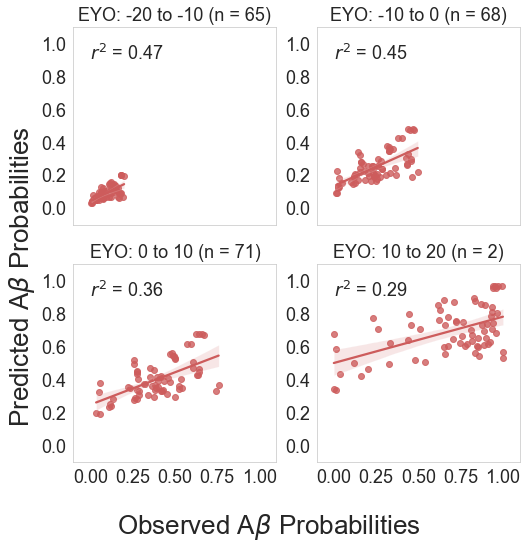

In [100]:
#threshold = 0.3
age_ranges = [[-20, -10], [-10,0], [0,10], [10,20]] 
n_cols = len(age_ranges)
fig = plt.figure(figsize=(8,8))

for idx, ar in enumerate(age_ranges):
    #loc = 2*(idx+1)-1
    ref = np.mean(ref_pattern_df[(ref_pattern_df.DIAN_EYO > ar[0]) & (ref_pattern_df.DIAN_EYO < ar[1])][roi_cols_to_keep], axis=0)
    pred = np.mean(pred_pattern_df[(pred_pattern_df.DIAN_EYO > ar[0]) & (pred_pattern_df.DIAN_EYO < ar[1])][roi_cols_to_keep], axis=0)
    n = ref_pattern_df[(ref_pattern_df.DIAN_EYO > ar[0]) & (ref_pattern_df.DIAN_EYO < ar[1])].shape[0]
    r,p = stats.pearsonr(ref, pred)
    r2 = r**2
    ax1 = plt.subplot(2, 2, idx+1)
    sns.regplot(ref, pred, color="indianred")
    plt.xlim([-0.1, 1.1])
    plt.ylim([-0.1, 1.1])
    plt.text(s=r"$r^2$ = {0}".format(np.round(r2, 2)), x=0, y=.9, fontsize=18)
    if idx < 2: 
        plt.xticks([])
    else:
        plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)
    plt.title("EYO: {0} to {1} (n = {2})".format(str(ar[0]), str(ar[1]), str(n)), fontsize=18)
fig.text(0.2, 0, r"Observed A$\beta$ Probabilities", fontsize=26)
fig.text(0.01, 0.2, r"Predicted A$\beta$ Probabilities", fontsize=26, rotation=90)
#fig.text(0.2, .95, "Group-level ESM Performance", fontsize=26)
    

    

plt.show()

### Longitudinal ESM, t1 to t2

In [101]:
subs_mean_rate_change_t1_t2 = {}
for sub in all_subs_2nd_timepoint:
    visit_t1 = dian_pup_voxelwise_ecdf_first_timepoint.loc[sub, 'visit']
    visit_t2 = dian_pup_voxelwise_ecdf_second_timepoint.loc[sub, 'visit']
    if clinical_df[(clinical_df.IMAGID == sub) & (clinical_df.visit == visit_t1)].shape[0] > 0:
        age_t1 = dian_pup_voxelwise_ecdf_first_timepoint.loc[sub, 'VISITAGEc']
        age_t2 = dian_pup_voxelwise_ecdf_second_timepoint.loc[sub, 'VISITAGEc']
        #age_t2 = clinical_df[(clinical_df.IMAGID == sub) & (clinical_df.visit == visit_t2)].VISITAGEc.values[0]
        #dian_pup_voxelwise_ecdf_second_timepoint.loc[sub, 'VISITAGEc'] = age_t2
        #dian_pup_voxelwise_ecdf_first_timepoint.loc[sub, 'VISITAGEc'] = age_t1
        avg_prob_t1 = np.mean(dian_pup_voxelwise_ecdf_first_timepoint.loc[sub, roi_cols_to_keep])
        avg_prob_t2 = np.mean(dian_pup_voxelwise_ecdf_second_timepoint.loc[sub, roi_cols_to_keep])
        #print(dian_pup_voxelwise_ecdf_second_timepoint.loc[sub, roi_cols_to_keep]-dian_pup_voxelwise_ecdf_first_timepoint.loc[sub, roi_cols_to_keep])
        mcr = round((avg_prob_t2-avg_prob_t1)/(age_t2-age_t1),3)
        subs_mean_rate_change_t1_t2[sub] = mcr

In [102]:
output_dir = '../../data/DIAN/esm_input_mat_files/'
conn_matrices = ['../../data/DIAN/connectivity_matrices/Matrix_ACP.mat', '../../data/DIAN/connectivity_matrices/Matrix_LONG.mat']
conn_mat_names = ['Map', 'Map']
conn_out_names = ['ACP', 'LONG']
file_names = '20190905_dian_pup_abeta_prob_orig_method_p75_brainstem_longi_all_subjects.mat'
prob_matrices = {'v1': dian_pup_voxelwise_ecdf_first_timepoint.loc[all_subs_2nd_timepoint, roi_cols],
                 'v2': dian_pup_voxelwise_ecdf_second_timepoint.loc[all_subs_2nd_timepoint, roi_cols]}
ages = {'ages_v2': list(dian_pup_voxelwise_ecdf_second_timepoint.loc[all_subs_2nd_timepoint, 'VISITAGEc']),
        'ages_v1': list(dian_pup_voxelwise_ecdf_first_timepoint.loc[all_subs_2nd_timepoint, 'VISITAGEc'])}

new connectivity matrix size: for ACP (70, 70)


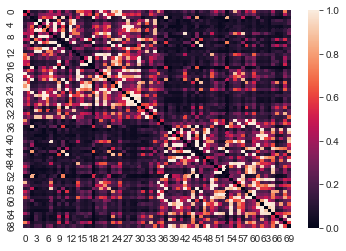

new connectivity matrix size: for LONG (70, 70)


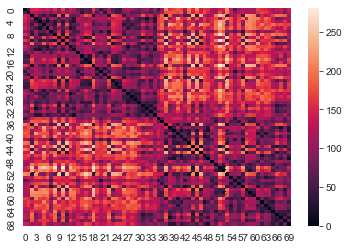

ESM input written to ../../data/DIAN/esm_input_mat_files/20190905_dian_pup_abeta_prob_orig_method_p75_brainstem_longi_all_subjects.mat
===inputs:===
v1
v2
ACP
LONG
ages_v2
ages_v1
===connectivity matrices===
../../data/DIAN/esm_input_mat_files/ACP.mat
../../data/DIAN/esm_input_mat_files/LONG.mat


In [103]:
esm.Prepare_Inputs_for_ESM(prob_matrices=prob_matrices, 
                           ages=ages, 
                           output_dir=output_dir,
                           file_name=file_names, 
                           conn_matrices=conn_matrices,
                           conn_mat_names=conn_mat_names,
                           conn_out_names=conn_out_names)

In [100]:
esm_longi_t1_t2_brainstem_res_path = "../../data/DIAN/esm_output_mat_files/20190905_dian_pup_abeta_prob_orig_method_p75_brainstem_longi_all_subjects_real_time_frozen29-Oct-2019.mat"

In [101]:
esm_longi_t1_t2_brainstem_res_mat = esm.loadmat(esm_longi_t1_t2_brainstem_res_path)
ref_t1 = np.array(dian_pup_voxelwise_ecdf_first_timepoint.loc[all_subs_2nd_timepoint, roi_cols_to_keep].T)
ref_t2 = esm_longi_t1_t2_brainstem_res_mat['ref_pattern']
pred_t2 = esm_longi_t1_t2_brainstem_res_mat['model_solutions0']

In [102]:
param_pattern_corrs_subs = esm_longi_t1_t2_brainstem_res_mat['param_pattern_corrs_subs']
param_rate_corrs_subs = esm_longi_t1_t2_brainstem_res_mat['param_rate_corrs_subs']
#param_pattern_r2_subs = esm_longi_t1_t2_brainstem_res_mat['param_pattern_r2_grid']
#param_rate_r2_subs = esm_longi_t1_t2_brainstem_res_mat['param_rate_r2_grid']

In [103]:
esm_longi_t1_t2_brainstem_res_mat['ref_pattern'].shape

(70, 199)

In [104]:
len(all_subs_2nd_timepoint)

199

average r2 =  0.502593024524921
average RMSE = 0.03624153307226563
average eval = 1.6791565123361028e+147


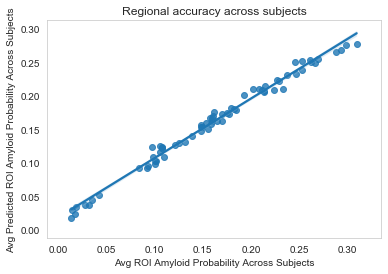

r2 =  0.98830222567386 /n


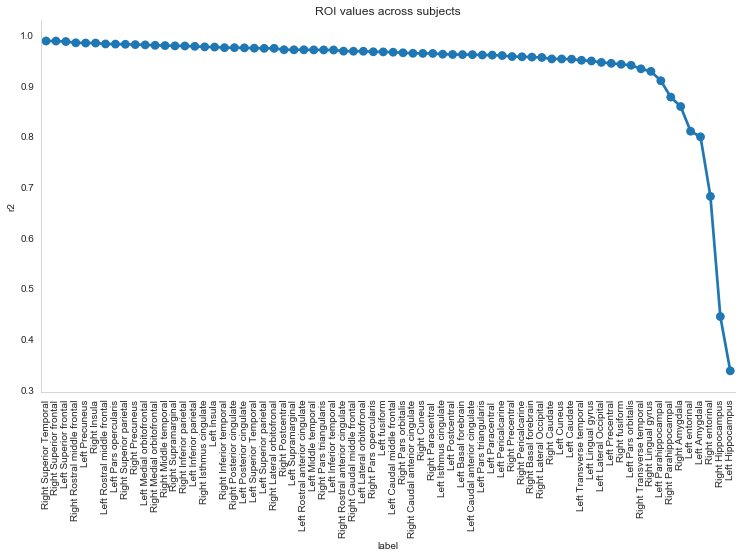

0.9368724271177492


In [105]:
esm_longi_t1_t2_brainstem_res = esm.Evaluate_ESM_Results(esm_longi_t1_t2_brainstem_res_path,
                                                         sids=all_subs_2nd_timepoint,
                                                         labels=roi_cols_to_keep,
                                                         lit=True)

In [106]:
model_output_t1_t2 = esm_longi_t1_t2_brainstem_res['model_output']

In [107]:
for i, sub in enumerate(model_output_t1_t2.index): 
    model_output_t1_t2.loc[sub, "Mutation"] = dian_pup_voxelwise_ecdf_first_timepoint.loc[sub, "Mutation"]
    model_output_t1_t2.loc[sub, "visit_t1"] = dian_pup_voxelwise_ecdf_first_timepoint.loc[sub, "visit"]
    model_output_t1_t2.loc[sub, "visit_t2"] = dian_pup_voxelwise_ecdf_second_timepoint.loc[sub, "visit"]
    t1_ref_cort_deposition = np.mean(ref_t1[pup_cortical_analysis_col_idx, i])
    t2_ref_cort_deposition = np.mean(ref_t2[pup_cortical_analysis_col_idx, i])
    model_output_t1_t2.loc[sub, 'T1_Ref_CortROIMean'] = t1_ref_cort_deposition
    model_output_t1_t2.loc[sub, 'T1_Ref_MattssonEarlyAcc_Mean'] = np.mean(ref_t1[mattsson_early_acc_cols, i])
    model_output_t1_t2.loc[sub, 'T2_Ref_CortROIMean'] = t2_ref_cort_deposition
    model_output_t1_t2.loc[sub, 'T2_Ref_MattssonEarlyAcc_Mean'] = np.mean(ref_t2[mattsson_early_acc_cols, i])
    model_output_t1_t2.loc[sub, 'age_diff'] = dian_pup_voxelwise_ecdf_second_timepoint.loc[sub, 'VISITAGEc'] - dian_pup_voxelwise_ecdf_first_timepoint.loc[sub, 'VISITAGEc']
    model_output_t1_t2.loc[sub, 'T1_T2_CortROIMean_Diff_Per_Year'] = (t2_ref_cort_deposition - t1_ref_cort_deposition) / (dian_pup_voxelwise_ecdf_second_timepoint.loc[sub, 'VISITAGEc'] - dian_pup_voxelwise_ecdf_first_timepoint.loc[sub, 'VISITAGEc'])
    model_output_t1_t2.loc[sub, 'T1_Age'] = dian_pup_voxelwise_ecdf_first_timepoint.loc[sub, 'VISITAGEc']
    model_output_t1_t2.loc[sub, 'T2_Age'] = dian_pup_voxelwise_ecdf_second_timepoint.loc[sub, 'VISITAGEc']
    model_output_t1_t2.loc[sub, 'T1_EYO'] = dian_pup_voxelwise_ecdf_first_timepoint.loc[sub, 'DIAN_EYO']
    model_output_t1_t2.loc[sub, 'T2_EYO'] = dian_pup_voxelwise_ecdf_second_timepoint.loc[sub, 'DIAN_EYO']
    model_output_t1_t2.loc[sub, 'esm_idx'] = i

Text(0.5, 1.0, 'Subjects')

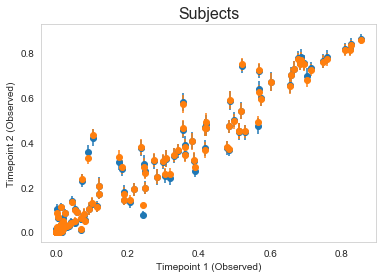

In [108]:
aoi=0
#plt.errorbar(ref_t1.mean(axis=aoi), ref_t2.mean(axis=aoi), yerr=ref_t1.std(axis=aoi), fmt='o')
plt.errorbar(ref_t1.mean(axis=aoi), ref_t2.mean(axis=(aoi)),
             yerr=ref_t2.std(axis=aoi)/np.sqrt(ref_t2.shape[aoi]), fmt='o')
plt.errorbar(ref_t1.mean(axis=aoi), pred_t2.mean(axis=(aoi)),
             yerr=pred_t2.std(axis=aoi)/np.sqrt(ref_t2.shape[aoi]), fmt='o')
plt.xlabel("Timepoint 1 (Observed)")
plt.ylabel("Timepoint 2 (Observed)")
plt.title("Subjects", fontsize=16)

Text(0.5, 1.0, 'Longitudinal Training Performance Across Subjects')

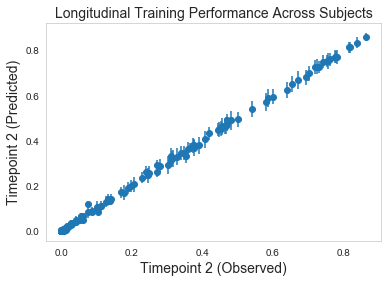

In [109]:
aoi=0
#plt.errorbar(ref_t1.mean(axis=aoi), ref_t2.mean(axis=aoi), yerr=ref_t1.std(axis=aoi), fmt='o')
plt.errorbar(ref_t2.mean(axis=aoi), pred_t2.mean(axis=(aoi)),
             yerr=pred_t2.std(axis=aoi)/np.sqrt(ref_t2.shape[aoi]), fmt='o')
plt.xlabel("Timepoint 2 (Observed)", fontsize=14)
plt.ylabel("Timepoint 2 (Predicted)", fontsize=14)
plt.title("Longitudinal Training Performance Across Subjects", fontsize=14)

Text(0.5, 1.0, 'Regions')

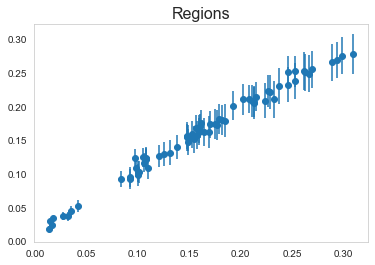

In [110]:
aoi=1
#plt.errorbar(ref_t1.mean(axis=aoi), ref_t2.mean(axis=aoi), yerr=ref_t1.std(axis=aoi), fmt='o')
plt.errorbar(ref_t2.mean(axis=aoi), pred_t2.mean(axis=(aoi)),
             yerr=ref_t2.std(axis=aoi)/np.sqrt(ref_t2.shape[aoi]), fmt='o')
plt.title("Regions", fontsize=16)

## Gantt Plot

In [112]:
import plotly.figure_factory as ff
from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go
from datetime import date
import plotly.express as px

In [113]:
ab_prob_gantt_df = pd.DataFrame(index=model_output_t1_t2.index, columns=["Task", "Start", "Finish", "Complete"])
for sub in model_output_t1_t2.index:
    ab_prob_gantt_df.loc[sub, 'Task'] = sub 
    ab_prob_gantt_df.loc[sub, 'Mutation'] = model_output_t1_t2.loc[sub, 'Mutation']
    ab_prob_gantt_df.loc[sub, 'Start'] = np.round(model_output_t1_t2.loc[sub, 'T1_EYO'],1)
    ab_prob_gantt_df.loc[sub, 'Finish'] = np.round(model_output_t1_t2.loc[sub, 'T2_EYO'],1)
    ab_prob_gantt_df.loc[sub, 'Complete'] = model_output_t1_t2.loc[sub, 'T1_T2_CortROIMean_Diff_Per_Year']
    ab_prob_gantt_df.loc[sub, 'Duration'] = ab_prob_gantt_df.loc[sub, 'Finish'] - ab_prob_gantt_df.loc[sub, 'Start']

In [114]:
def int2date(argdate: int) -> date:
    """
    If you have date as an integer, use this method to obtain a datetime.date object.

    Parameters
    ----------
    argdate : int
      Date as a regular integer value (example: 20160618)

    Returns
    -------
    dateandtime.date
      A date object which corresponds to the given value `argdate`.
    """
    year = int(argdate / 10000)
    month = int((argdate % 10000) / 100)
    day = int(argdate % 100)

    return date(year, month, day)


In [115]:
ab_prob_gantt_df.to_csv("ab_prob_gantt_df.csv")

In [116]:
subs_t1_t2_sorted_eyo_subs = model_output_t1_t2[model_output_t1_t2.Mutation==1].sort_values(by="T1_EYO").index
subs_t1_t2_sorted_eyo_esm_idx = model_output_t1_t2[model_output_t1_t2.Mutation==1].sort_values(by="T1_EYO").esm_idx
subs_t1_t2_sorted_eyo_esm_idx = [int(x) for x in subs_t1_t2_sorted_eyo_esm_idx]
age_diff_t1_t2_mutcarrier_sorted = []
for sub in subs_t1_t2_sorted_eyo_subs:  
    #print(model_output_t1_t2.loc[sub, 'age_diff'])
    age_diff_t1_t2_mutcarrier_sorted.append(model_output_t1_t2.loc[sub, 'age_diff'])

Text(0.5, 1, 'Change in A$\\beta$ Prob Between T1 and T2')

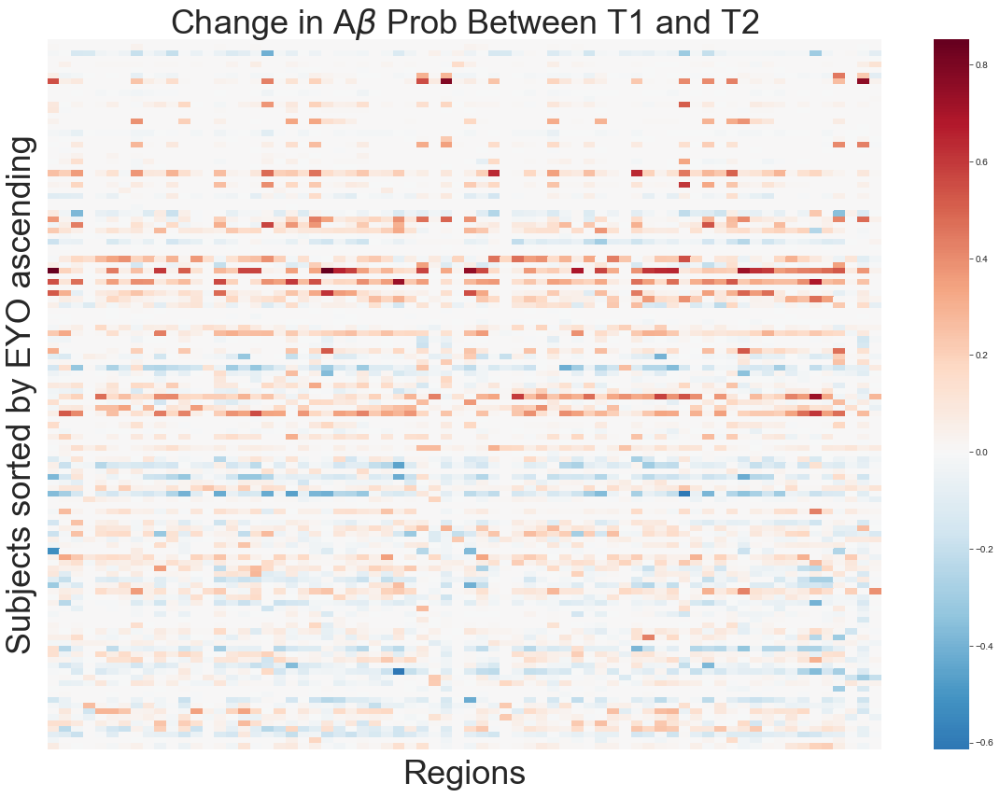

In [117]:
fig = plt.figure(figsize=(20,14))
min_eyo = np.min(model_output_t1_t2.loc[subs_t1_t2_sorted_eyo_subs,"T1_EYO"])
max_eyo = np.max(model_output_t1_t2.loc[subs_t1_t2_sorted_eyo_subs,"T1_EYO"])
age_diff = model_output_t1_t2[model_output_t1_t2.esm_idx.isin(subs_t1_t2_sorted_eyo_esm_idx)]
g = sns.heatmap((ref_t2[:,subs_t1_t2_sorted_eyo_esm_idx]-ref_t1[:,subs_t1_t2_sorted_eyo_esm_idx]).transpose(), center=0,cmap="RdBu_r")
g.set_yticklabels([])
g.set_xticklabels([])
plt.ylabel("Subjects sorted by EYO ascending", fontsize=36)
plt.xlabel("Regions", fontsize=36)
plt.title(r"Change in A$\beta$ Prob Between T1 and T2", fontsize=36)


In [118]:
def ab_eyo_gantt_plot(df, mut_status, minn=-0.15): 
    df_sorted = df[ab_prob_gantt_df.Mutation == mut_status].sort_values("Start", ascending=False)
    # set colour map
    cmap = px.colors.diverging.balance

    ind0 = df_sorted.index[0]

    fig = go.Figure()
    minn = minn
    maxx = -minn

    for idx, row in df_sorted.iterrows():

        # Potential Update: change opacity based on AB proba at start of bar
        # then, potentially, colour bars by normalized change (i.e. change / start proba)
        alpha = 1 # opacity
        
        # Set colour bin from value -> map
        c = int(np.floor(len(cmap)*(row.Complete - minn) / (maxx - minn)))

        # Make sure c is a valid index ... i.e. [ 0, len(cmap) ) 
        c = len(cmap) - 1 if c >= len(cmap) else c
        c = 0 if c < 0 else c

        # Only add colourbar one a single bar (its the same)
        if idx == ind0:
            marker = {"cmin": minn,
                      "cmax": maxx,
                      "showscale": True,
                      "color": cmap[c],
                      "opacity": alpha,
                      "colorscale": cmap}
        else:
            marker={"color": cmap[c],
                    "opacity": alpha,
                    "cmin": minn,
                    "cmax": maxx}

        # Add bar plot trace
        fig.add_trace(go.Bar(x0=row.Duration,
                             base=[row.Start],
                             y=[row.Task],
                             orientation='h',
                             marker=marker,
                             hovertext=row.Complete,
                             width=1.5))

    if mut_status == 1: 
        mut_status = "Mutation Carriers"
    else: 
        mut_status = "Noncarriers"
        
    fig.update_layout(showlegend=False, plot_bgcolor='rgb(255,255,255)',
                      title="AB Deposition Change Between Visits (" + mut_status + ")",
                      
                      yaxis={"title": "Subject", "tickvals": []},
                      xaxis={"title": "Estimated Years to Symptom Onset"})
    fig.show()

In [119]:
ab_eyo_gantt_plot(ab_prob_gantt_df, mut_status=1, minn=-.2)

In [120]:
ab_eyo_gantt_plot(ab_prob_gantt_df, mut_status=0, minn=-.2)

### Make Gantt Plot using SUVR values

In [121]:
ab_suvr_gantt_df = pd.DataFrame(index=ab_prob_gantt_df.index, columns=ab_prob_gantt_df.columns)

for sub in ab_suvr_gantt_df.index: 
    ab_suvr_gantt_df.loc[sub, 'Task'] = ab_prob_gantt_df.loc[sub, 'Task']
    ab_suvr_gantt_df.loc[sub, 'Start'] = ab_prob_gantt_df.loc[sub, 'Start']
    ab_suvr_gantt_df.loc[sub, 'Finish'] = ab_prob_gantt_df.loc[sub, 'Finish']
    ab_suvr_gantt_df.loc[sub, 'Mutation'] = ab_prob_gantt_df.loc[sub, 'Mutation']
    ab_suvr_gantt_df.loc[sub, 'Duration'] = ab_prob_gantt_df.loc[sub, 'Duration']
    visit_t1 = model_output_t1_t2.loc[sub, 'visit_t1']
    visit_t2 = model_output_t1_t2.loc[sub, 'visit_t2']
    suvr_t1 = pib_df[(pib_df.IMAGID == sub) & (pib_df.visit == visit_t1)].PIB_fSUVR_rsf_TOT_CORTMEAN.values[0]
    suvr_t2 = pib_df[(pib_df.IMAGID == sub) & (pib_df.visit == visit_t2)].PIB_fSUVR_rsf_TOT_CORTMEAN.values[0]
    ab_suvr_gantt_df.loc[sub, 'T1_SUVR'] = suvr_t1
    ab_suvr_gantt_df.loc[sub, 'T2_SUVR'] = suvr_t2
    complete = (suvr_t2 - suvr_t1) / (ab_suvr_gantt_df.loc[sub, 'Duration'])
    ab_suvr_gantt_df.loc[sub, 'Complete'] = complete
    
ab_suvr_gantt_df = ab_suvr_gantt_df.dropna()

In [122]:
ab_suvr_gantt_df.head()

,Task,Start,Finish,Complete,Mutation,Duration,T1_SUVR,T2_SUVR
1FXQEE,1FXQEE,-12.4,-11.3,-0.0127273,1,1.1,1.944,1.930
2VVTM5,2VVTM5,-4.1,-2.9,-0.0541667,0,1.2,1.089,1.024
34E2IA,34E2IA,-1.3,-0.2,0.159091,1,1.1,2.579,2.754
3WKEFU,3WKEFU,12.7,14,0.0530769,0,1.3,1.120,1.189
3YMWAT,3YMWAT,-1.4,-0.3,-0.00545455,1,1.1,2.272,2.266


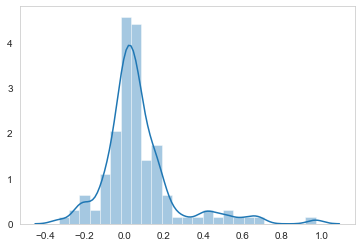

In [123]:
sns.distplot(list(ab_suvr_gantt_df[ab_suvr_gantt_df.Mutation==1].Complete))

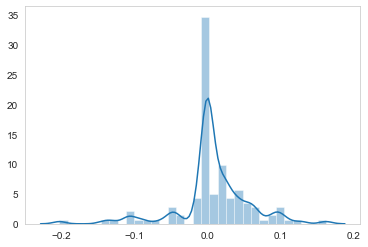

In [124]:
sns.distplot(list(ab_prob_gantt_df[ab_prob_gantt_df.Mutation==1].Complete))

In [135]:
dian_pup_voxelwise_ecdf_all_visits.head()

,Left Caudal anterior cingulate,Left Caudal middle frontal,Left Cuneus,Left entorinal,Left fusiform,Left Inferior parietal,Left Inferior temporal,Left Isthmus cingulate,Left Lateral Occipital,Left Lateral orbitofronal,...,Right Caudate,Right Hippocampus,Right Globus Pallidus,Right Putamen,Right Thalamus,visit,DIAN_EYO,VISITAGEc,visitNumber,Mutation
09NXRZ,0.000000,0.000000,0.000000e+00,0.000000,0.00000,0.000873,0.000000,0.000000,0.001178,0.001435,...,0.800702,2.282584e-04,0,0,0,v00,-11.544292,22.789041,1.0,1.0
0F9ACS,0.000000,0.000000,0.000000e+00,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000e+00,0,0,0,v00,-14.255284,33.536986,1.0,1.0
0LA7SQ,0.952713,0.400071,6.360225e-01,0.002138,0.24708,0.402461,0.322673,0.750151,0.355474,0.500048,...,0.634945,5.246594e-15,0,0,0,v00,-2.806088,46.638356,1.0,1.0
0O5OD0,0.000000,0.000000,0.000000e+00,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000285,0.000000e+00,0,0,0,v00,-15.786744,37.957781,1.0,0.0
0RN4X6,0.000000,0.000000,6.328179e-122,0.000000,0.00000,0.002050,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000e+00,0,0,0,v00,-19.342955,28.449315,1.0,1.0


In [ ]:
ab_suvr_gantt_df = pd.DataFrame(columns=ab_prob_gantt_df.columns)

for sub in dian_pup_voxelwise_ecdf_all_visits[dian_pup  ].index: 
    ab_suvr_gantt_df.loc[sub, 'Task'] = ab_prob_gantt_df.loc[sub, 'Task']
    ab_suvr_gantt_df.loc[sub, 'Start'] = ab_prob_gantt_df.loc[sub, 'Start']
    ab_suvr_gantt_df.loc[sub, 'Finish'] = ab_prob_gantt_df.loc[sub, 'Finish']
    ab_suvr_gantt_df.loc[sub, 'Mutation'] = ab_prob_gantt_df.loc[sub, 'Mutation']
    ab_suvr_gantt_df.loc[sub, 'Duration'] = ab_prob_gantt_df.loc[sub, 'Duration']
    visit_t1 = model_output_t1_t2.loc[sub, 'visit_t1']
    visit_t2 = model_output_t1_t2.loc[sub, 'visit_t2']
    suvr_t1 = pib_df[(pib_df.IMAGID == sub) & (pib_df.visit == visit_t1)].PIB_fSUVR_rsf_TOT_CORTMEAN.values[0]
    suvr_t2 = pib_df[(pib_df.IMAGID == sub) & (pib_df.visit == visit_t2)].PIB_fSUVR_rsf_TOT_CORTMEAN.values[0]
    ab_suvr_gantt_df.loc[sub, 'T1_SUVR'] = suvr_t1
    ab_suvr_gantt_df.loc[sub, 'T2_SUVR'] = suvr_t2
    complete = (suvr_t2 - suvr_t1) / (ab_suvr_gantt_df.loc[sub, 'Duration'])
    ab_suvr_gantt_df.loc[sub, 'Complete'] = complete
    
ab_suvr_gantt_df = ab_suvr_gantt_df.dropna()

In [125]:
ab_eyo_gantt_plot(ab_prob_gantt_df, mut_status=1, minn=-.2)

In [126]:
ab_eyo_gantt_plot(ab_suvr_gantt_df, mut_status=1, minn=-.4)

In [127]:
ab_eyo_gantt_plot(ab_prob_gantt_df, mut_status=0, minn=-.4)

In [128]:
mutcarrier_idx = list(model_output_t1_t2[model_output_t1_t2.Mutation==1].esm_idx)

In [129]:
pattern_pcs = [pcs[0] for pcs in param_pattern_corrs_subs]
pattern_pcs_arr = np.asarray(pattern_pcs)
pattern_pcs_arr.shape

rate_pcs = [pcs[0] for pcs in param_rate_corrs_subs]
rate_pcs_arr = np.asarray(rate_pcs)
rate_pcs_arr.shape

#pattern_r2_pcs = [pcs[0] for pcs in param_pattern_r2_subs]
#pattern_r2_pcs_arr = np.asarray(pattern_r2_pcs)

#rate_r2_pcs = [pcs[0] for pcs in param_rate_r2_subs]
#rate_r2_pcs_arr = np.asarray(rate_r2_pcs)

(199, 100, 100)

### Visualize subject-level longitudinal training performance

Mutation Carrier
1FXQEE: r2 = 0.236
DIAN EYO: -11.32
Mean Cortical SUVR: 1.93
Mean ref rate of change for probs: -0.06284832334764745
Mean post-cing ref rate of change: -0.04244444305774103
Mutation Carrier


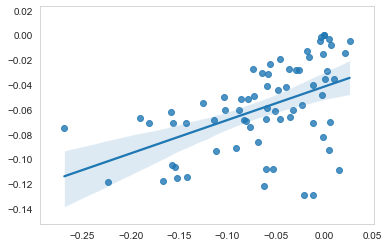



Noncarrier
2VVTM5: r2 = 0.829
DIAN EYO: -2.88
Mean Cortical SUVR: 1.02
Mean ref rate of change for probs: -2.733753455994624e-05
Mean post-cing ref rate of change: -2.2600492098e-313
Noncarrier


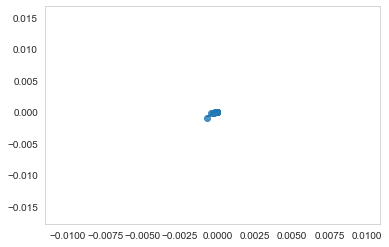



Mutation Carrier
34E2IA: r2 = 0.386
DIAN EYO: -0.16
Mean Cortical SUVR: 2.75
Mean ref rate of change for probs: 0.050018200727399306
Mean post-cing ref rate of change: 0.1283393250992773
Mutation Carrier


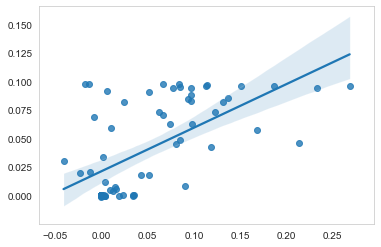



Noncarrier
3WKEFU: r2 = 1.0
DIAN EYO: 14.04
Mean Cortical SUVR: 1.19
Mean ref rate of change for probs: -2.8032582143262963e-06
Mean post-cing ref rate of change: 0.0
Noncarrier


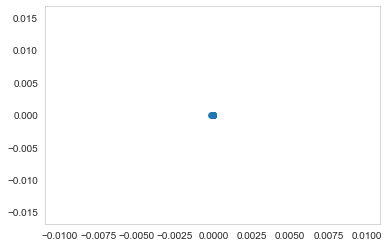



Mutation Carrier
3YMWAT: r2 = 0.526
DIAN EYO: -0.33
Mean Cortical SUVR: 2.27
Mean ref rate of change for probs: 0.027280083438673407
Mean post-cing ref rate of change: 0.017778227342204803
Mutation Carrier


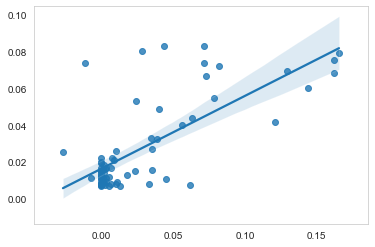



Mutation Carrier
4KEGQV: r2 = 0.067
DIAN EYO: 9.4
Mean Cortical SUVR: 2.15
Mean ref rate of change for probs: 0.03374608949678508
Mean post-cing ref rate of change: -0.01527832246625948
Mutation Carrier


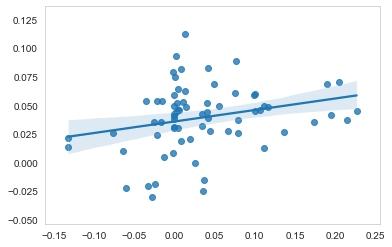



Noncarrier
5KD9CG: r2 = 0.021
DIAN EYO: 3.01
Mean Cortical SUVR: 1.01
Mean ref rate of change for probs: 0.00010479139980666944
Mean post-cing ref rate of change: 0.0
Noncarrier


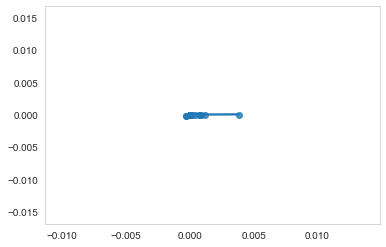



Mutation Carrier
5LGJ8I: r2 = 0.313
DIAN EYO: -5.47
Mean Cortical SUVR: 3.82
Mean ref rate of change for probs: 0.039693918402314655
Mean post-cing ref rate of change: 0.02050836174743313
Mutation Carrier


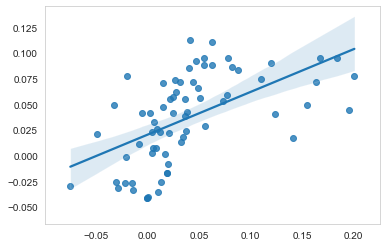



Mutation Carrier
67YHUY: r2 = 0.949
DIAN EYO: -0.49
Mean Cortical SUVR: 1.06
Mean ref rate of change for probs: -0.0003350676460394626
Mean post-cing ref rate of change: -0.0006202048859244748
Mutation Carrier


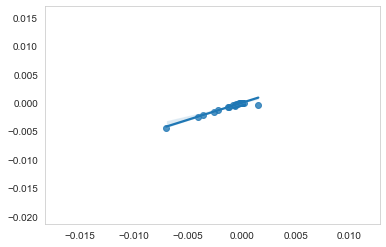



Mutation Carrier
6TATLD: r2 = 0.171
DIAN EYO: 9.78
Mean Cortical SUVR: 1.82
Mean ref rate of change for probs: 0.019515193272228427
Mean post-cing ref rate of change: 0.18403110992716323
Mutation Carrier


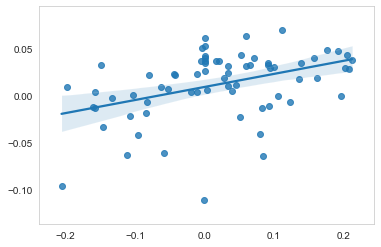



Noncarrier
76HB24: r2 = 0.346
DIAN EYO: 0.06
Mean Cortical SUVR: 1.03
Mean ref rate of change for probs: -1.5786355358315444e-05
Mean post-cing ref rate of change: -0.001008324728962313
Noncarrier


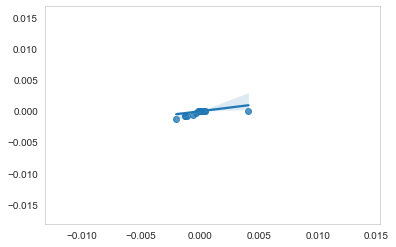



Noncarrier
7CMJYQ: r2 = 0.987
DIAN EYO: -0.63
Mean Cortical SUVR: 1.06
Mean ref rate of change for probs: -0.0021680019880086464
Mean post-cing ref rate of change: -0.004615594623937733
Noncarrier


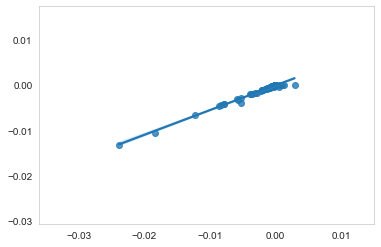



Noncarrier
7XRXWC: r2 = 0.01
DIAN EYO: 1.37
Mean Cortical SUVR: 1.05
Mean ref rate of change for probs: 0.007302568058573033
Mean post-cing ref rate of change: 0.004548626964997451
Noncarrier


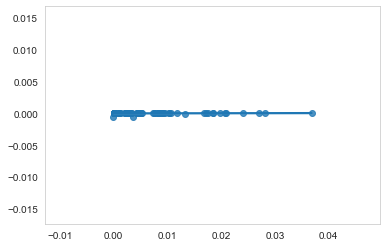



Mutation Carrier
83EINK: r2 = 0.708
DIAN EYO: 7.68
Mean Cortical SUVR: 3.37
Mean ref rate of change for probs: -0.07627729701789258
Mean post-cing ref rate of change: -0.07908844416690802
Mutation Carrier


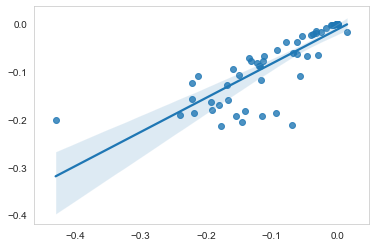



Mutation Carrier
8AKUN6: r2 = 0.86
DIAN EYO: -11.72
Mean Cortical SUVR: 0.96
Mean ref rate of change for probs: -0.0026650788176995504
Mean post-cing ref rate of change: -0.0037675972813510953
Mutation Carrier


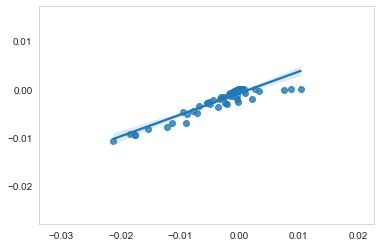



Mutation Carrier
8MQWHN: r2 = 0.556
DIAN EYO: 2.85
Mean Cortical SUVR: 4.75
Mean ref rate of change for probs: 0.09512841702821456
Mean post-cing ref rate of change: 0.11901181263385778
Mutation Carrier


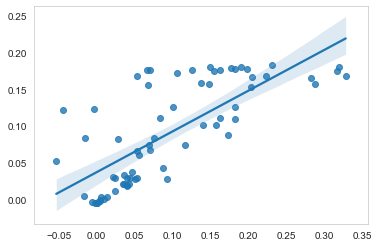



Mutation Carrier
8UFV8Z: r2 = 0.137
DIAN EYO: 4.5
Mean Cortical SUVR: 2.18
Mean ref rate of change for probs: -0.10041345229915503
Mean post-cing ref rate of change: -0.1939568896849382
Mutation Carrier


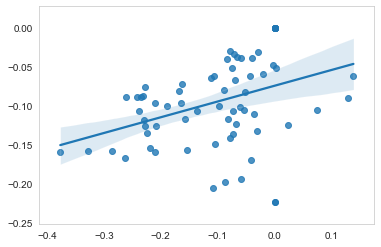



Mutation Carrier
9V76YB: r2 = 0.037
DIAN EYO: 3.84
Mean Cortical SUVR: 1.82
Mean ref rate of change for probs: 0.0005360501761161517
Mean post-cing ref rate of change: 0.0043465748835143725
Mutation Carrier


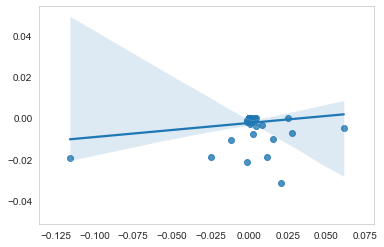



Mutation Carrier
ABOX7W: r2 = 0.521
DIAN EYO: -5.08
Mean Cortical SUVR: 1.56
Mean ref rate of change for probs: -0.009072892575470828
Mean post-cing ref rate of change: 0.030960721721254664
Mutation Carrier


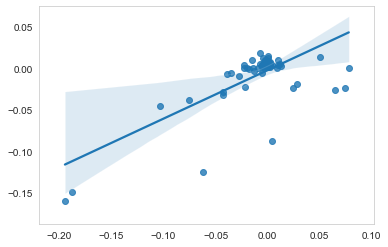



Noncarrier
AEXGEP: r2 = 0.026
DIAN EYO: 11.42
Mean Cortical SUVR: 1.1
Mean ref rate of change for probs: 0.00042816809713647045
Mean post-cing ref rate of change: 0.001815476383692525
Noncarrier


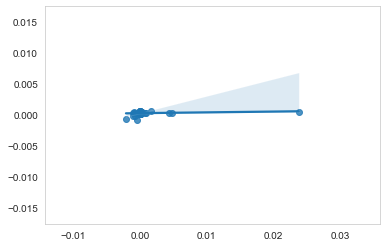



Mutation Carrier
B93NRI: r2 = 0.001
DIAN EYO: 0.83
Mean Cortical SUVR: 4.05
Mean ref rate of change for probs: -0.0010891970561056562
Mean post-cing ref rate of change: -0.010692017616821271
Mutation Carrier


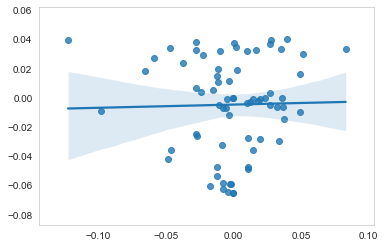



Mutation Carrier
BS2VBS: r2 = 0.012
DIAN EYO: -1.66
Mean Cortical SUVR: 1.16
Mean ref rate of change for probs: 0.04249719363846716
Mean post-cing ref rate of change: 0.059254049760931654
Mutation Carrier


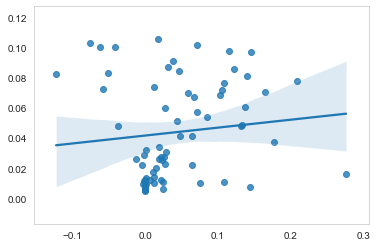



Mutation Carrier
CXRL3E: r2 = 0.56
DIAN EYO: -7.02
Mean Cortical SUVR: 1.01
Mean ref rate of change for probs: -0.00018089696023708833
Mean post-cing ref rate of change: 0.0005149592515681339
Mutation Carrier


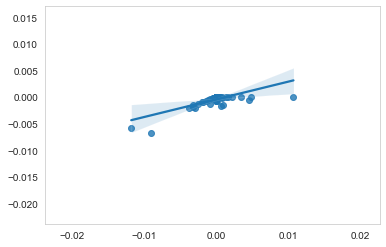



Mutation Carrier
D0IS2S: r2 = 0.073
DIAN EYO: 3.32
Mean Cortical SUVR: nan
Mean ref rate of change for probs: -0.05442868030451751
Mean post-cing ref rate of change: -0.11127027128765372
Mutation Carrier


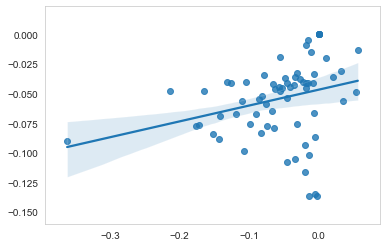



Mutation Carrier
D6TIH6: r2 = 0.155
DIAN EYO: 9.73
Mean Cortical SUVR: 2.13
Mean ref rate of change for probs: -0.07703184796972588
Mean post-cing ref rate of change: -0.11829870279278899
Mutation Carrier


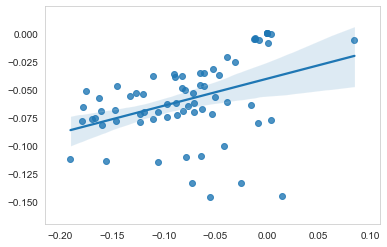



Mutation Carrier
DQW9BD: r2 = 0.046
DIAN EYO: 5.99
Mean Cortical SUVR: 2.72
Mean ref rate of change for probs: -0.07174799018873489
Mean post-cing ref rate of change: -0.07866213895339692
Mutation Carrier


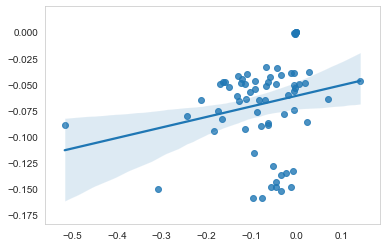



Mutation Carrier
DSSA42: r2 = 0.002
DIAN EYO: 3.1
Mean Cortical SUVR: 1.97
Mean ref rate of change for probs: 0.011721597831437267
Mean post-cing ref rate of change: 0.01917294264893935
Mutation Carrier


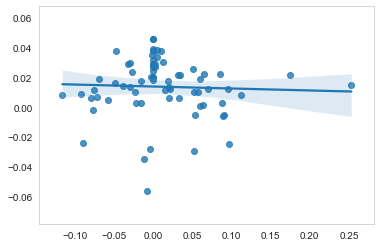



Mutation Carrier
F2Q4HA: r2 = 0.489
DIAN EYO: 7.64
Mean Cortical SUVR: 1.3
Mean ref rate of change for probs: -0.0002937524429386901
Mean post-cing ref rate of change: 0.00025525649874501944
Mutation Carrier


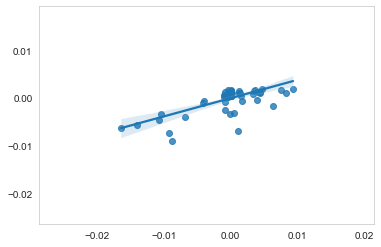



Mutation Carrier
FVPVRA: r2 = 0.071
DIAN EYO: 4.34
Mean Cortical SUVR: 1.68
Mean ref rate of change for probs: 0.020157822014364165
Mean post-cing ref rate of change: 0.02592389670374769
Mutation Carrier


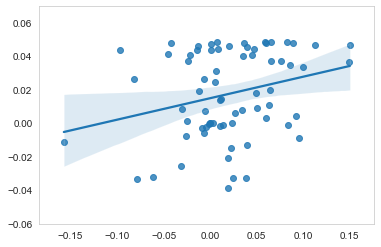



Mutation Carrier
FZQTVB: r2 = 0.014
DIAN EYO: 9.91
Mean Cortical SUVR: 1.77
Mean ref rate of change for probs: 0.0032671662266143247
Mean post-cing ref rate of change: 0.02866227398739786
Mutation Carrier


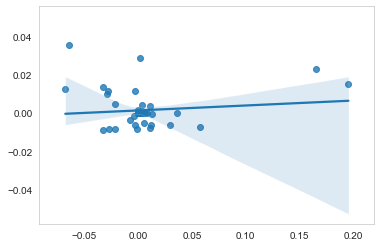



Mutation Carrier
G3RZYE: r2 = 0.097
DIAN EYO: 4.93
Mean Cortical SUVR: 3.78
Mean ref rate of change for probs: 0.04747278645019382
Mean post-cing ref rate of change: 0.044558264390020384
Mutation Carrier


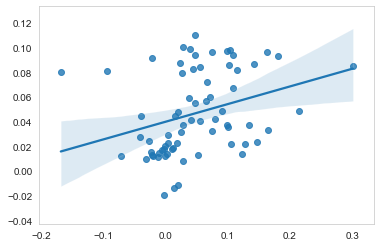



Mutation Carrier
GQ3NXG: r2 = 0.17
DIAN EYO: 3.34
Mean Cortical SUVR: 3.01
Mean ref rate of change for probs: 0.011138515763683986
Mean post-cing ref rate of change: 0.01098891618908661
Mutation Carrier


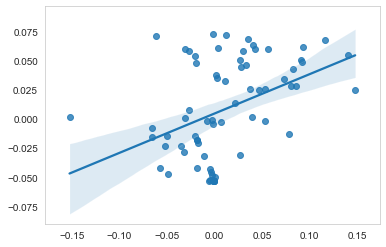



Mutation Carrier
HAB9WN: r2 = 0.153
DIAN EYO: 3.3
Mean Cortical SUVR: 1.76
Mean ref rate of change for probs: -0.0004853130982118143
Mean post-cing ref rate of change: 0.006689126161715133
Mutation Carrier


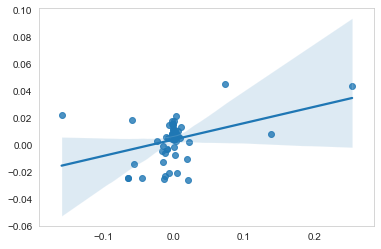



Mutation Carrier
IP8JVC: r2 = 0.105
DIAN EYO: -3.96
Mean Cortical SUVR: 1.91
Mean ref rate of change for probs: -0.035068192913343094
Mean post-cing ref rate of change: -0.10386940124088533
Mutation Carrier


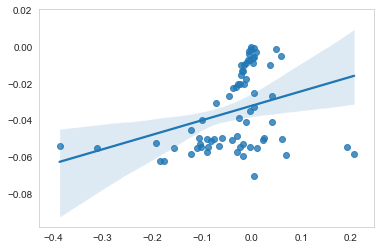



Mutation Carrier
JQ8KSL: r2 = 0.494
DIAN EYO: 1.43
Mean Cortical SUVR: 1.12
Mean ref rate of change for probs: 0.00034477009838227747
Mean post-cing ref rate of change: 0.00015393140816452182
Mutation Carrier


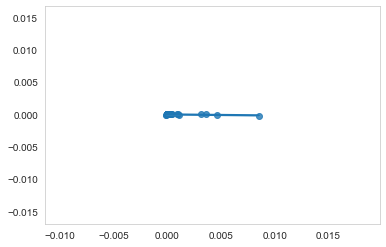



Noncarrier
L0KYTY: r2 = 0.586
DIAN EYO: 0.15
Mean Cortical SUVR: 1.23
Mean ref rate of change for probs: -0.004004140250421925
Mean post-cing ref rate of change: -0.02070006484969099
Noncarrier


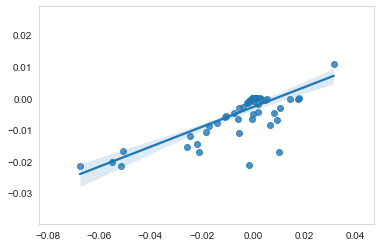



Mutation Carrier
L6JS6O: r2 = 0.014
DIAN EYO: 1.64
Mean Cortical SUVR: 1.94
Mean ref rate of change for probs: -0.012421450793074346
Mean post-cing ref rate of change: 0.011561144847770774
Mutation Carrier


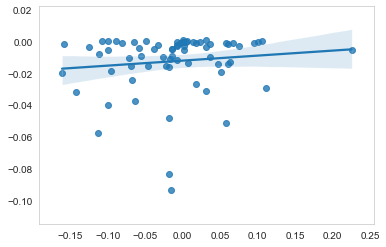



Mutation Carrier
LU88KY: r2 = 0.226
DIAN EYO: -2.64
Mean Cortical SUVR: 1.5
Mean ref rate of change for probs: -0.10369801120481362
Mean post-cing ref rate of change: 0.015727487662827385
Mutation Carrier


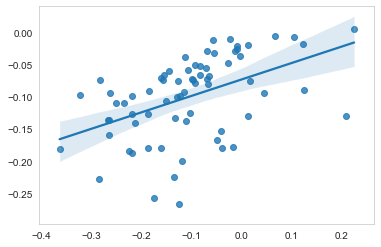



Mutation Carrier
MHB2SW: r2 = 0.022
DIAN EYO: 3.08
Mean Cortical SUVR: 3.0
Mean ref rate of change for probs: -0.05924198584290241
Mean post-cing ref rate of change: -0.07729146027650959
Mutation Carrier


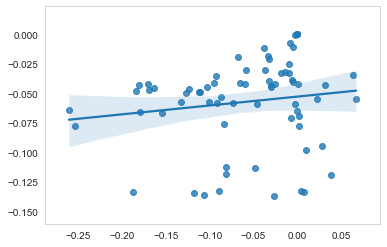



Noncarrier
NRIVVL: r2 = 0.92
DIAN EYO: -4.12
Mean Cortical SUVR: 0.99
Mean ref rate of change for probs: -0.0006457314227405504
Mean post-cing ref rate of change: -0.0002104820923940612
Noncarrier


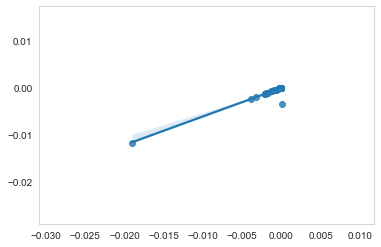



Mutation Carrier
OD8ZMU: r2 = 0.285
DIAN EYO: 0.11
Mean Cortical SUVR: 4.3
Mean ref rate of change for probs: 0.05796399186233555
Mean post-cing ref rate of change: 0.054381242271002245
Mutation Carrier


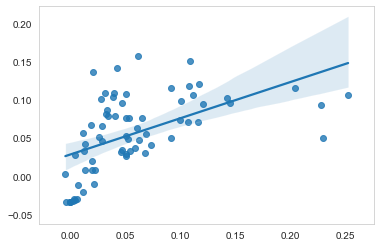



Mutation Carrier
OEV528: r2 = 0.135
DIAN EYO: 0.48
Mean Cortical SUVR: 2.32
Mean ref rate of change for probs: -0.11275424049143025
Mean post-cing ref rate of change: -0.11372515244890692
Mutation Carrier


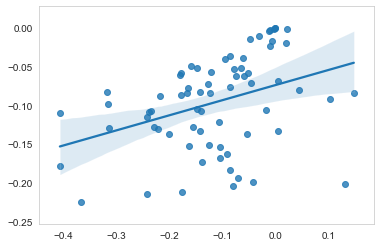



Noncarrier
P8HVA0: r2 = 1.0
DIAN EYO: -7.07
Mean Cortical SUVR: 1.14
Mean ref rate of change for probs: -0.00015502040063401356
Mean post-cing ref rate of change: -5.7594905561322684e-64
Noncarrier


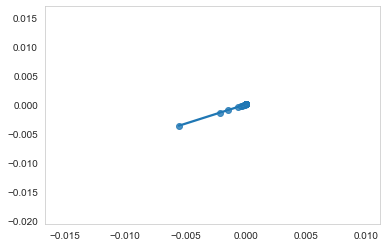



Mutation Carrier
PAU8PN: r2 = 0.521
DIAN EYO: -2.93
Mean Cortical SUVR: 1.37
Mean ref rate of change for probs: 0.012902186772846913
Mean post-cing ref rate of change: 0.0008250156771508057
Mutation Carrier


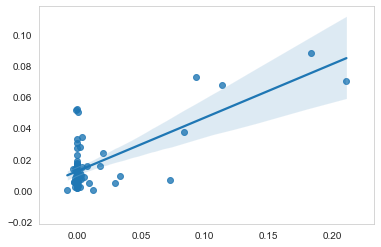



Noncarrier
PBAOM3: r2 = 0.991
DIAN EYO: -3.07
Mean Cortical SUVR: 1.08
Mean ref rate of change for probs: -0.00028408368251795006
Mean post-cing ref rate of change: -0.00020316195854629308
Noncarrier


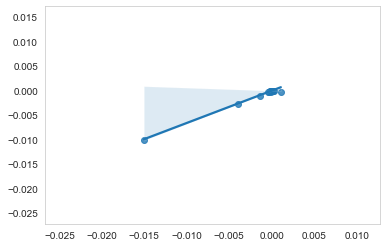



Noncarrier
PBHW42: r2 = 0.258
DIAN EYO: 5.37
Mean Cortical SUVR: 2.97
Mean ref rate of change for probs: -0.046370312978193814
Mean post-cing ref rate of change: -0.031602393605552136
Noncarrier


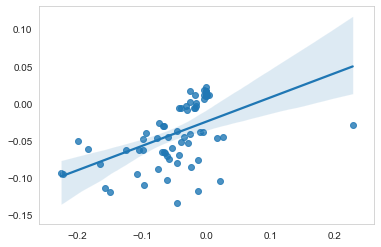



Mutation Carrier
PJV2V8: r2 = 0.0
DIAN EYO: 2.99
Mean Cortical SUVR: 2.58
Mean ref rate of change for probs: 0.027399343819288963
Mean post-cing ref rate of change: -0.03394628635117366
Mutation Carrier


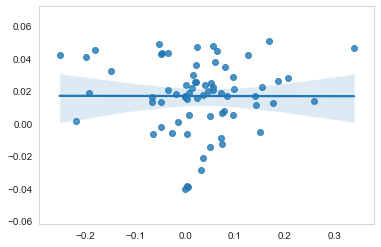



Mutation Carrier
PTFEWJ: r2 = 0.151
DIAN EYO: 3.75
Mean Cortical SUVR: 3.19
Mean ref rate of change for probs: -0.010041639144699422
Mean post-cing ref rate of change: 0.019892570987604136
Mutation Carrier


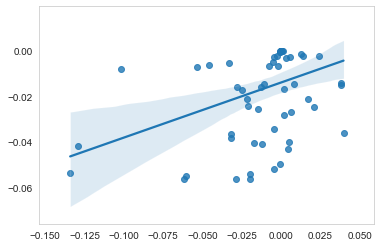



Mutation Carrier
PUI0R8: r2 = 0.715
DIAN EYO: -4.29
Mean Cortical SUVR: 1.97
Mean ref rate of change for probs: -0.005782837783333783
Mean post-cing ref rate of change: 0.0038435405043773458
Mutation Carrier


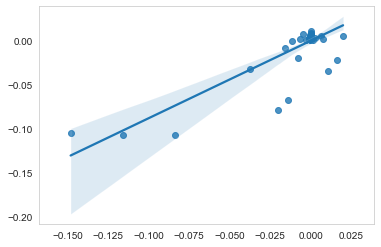



Mutation Carrier
Q4W4NR: r2 = 0.278
DIAN EYO: 0.43
Mean Cortical SUVR: 1.4
Mean ref rate of change for probs: 0.01835138990387677
Mean post-cing ref rate of change: 0.04203978678839229
Mutation Carrier


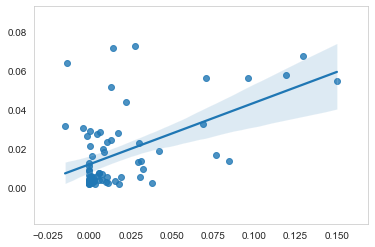



Mutation Carrier
Q681VF: r2 = 0.187
DIAN EYO: 5.05
Mean Cortical SUVR: 2.04
Mean ref rate of change for probs: -0.0503748700355443
Mean post-cing ref rate of change: -0.19261672096746982
Mutation Carrier


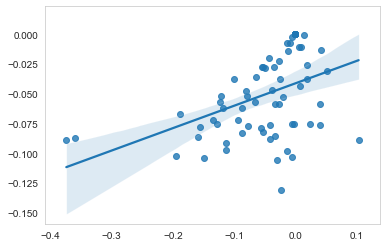



Mutation Carrier
R6Q4I8: r2 = 0.001
DIAN EYO: 10.52
Mean Cortical SUVR: 3.44
Mean ref rate of change for probs: 0.02576015402951708
Mean post-cing ref rate of change: 0.054947150749646186
Mutation Carrier


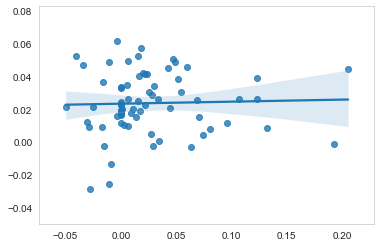



Mutation Carrier
SOACBP: r2 = 0.039
DIAN EYO: 0.88
Mean Cortical SUVR: 4.86
Mean ref rate of change for probs: 0.006612895346425772
Mean post-cing ref rate of change: -0.014896910459716526
Mutation Carrier


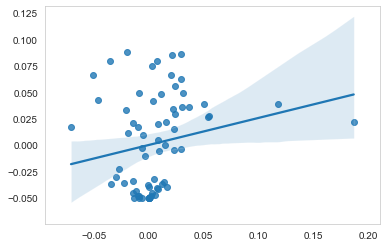



Mutation Carrier
T4IWDD: r2 = 0.142
DIAN EYO: 2.41
Mean Cortical SUVR: 6.45
Mean ref rate of change for probs: 0.009151559018453038
Mean post-cing ref rate of change: 0.04431236849946574
Mutation Carrier


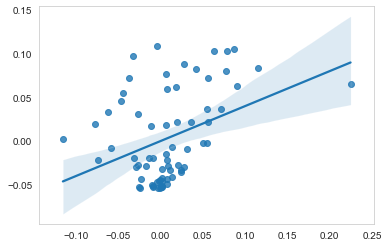



Mutation Carrier
T5QGMH: r2 = 0.057
DIAN EYO: 4.34
Mean Cortical SUVR: 2.43
Mean ref rate of change for probs: 0.009647819335104241
Mean post-cing ref rate of change: 0.009900730167697257
Mutation Carrier


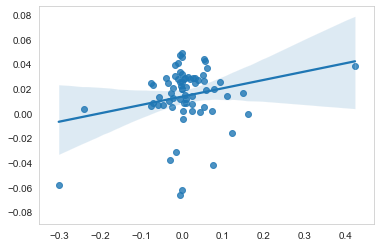



Mutation Carrier
TUKIOI: r2 = 0.864
DIAN EYO: -0.17
Mean Cortical SUVR: 1.36
Mean ref rate of change for probs: -0.00499460604035495
Mean post-cing ref rate of change: 0.0009422408662436488
Mutation Carrier


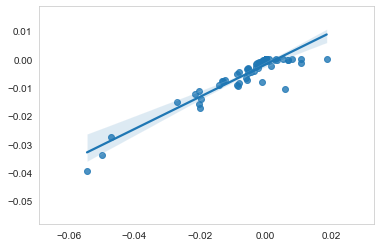



Mutation Carrier
UG9MGL: r2 = 0.645
DIAN EYO: 7.6
Mean Cortical SUVR: 1.68
Mean ref rate of change for probs: -0.009222126486528766
Mean post-cing ref rate of change: 0.0
Mutation Carrier


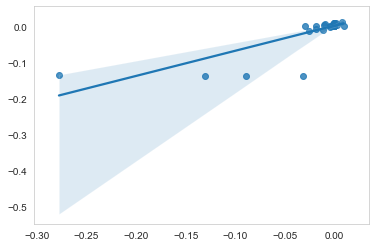



Mutation Carrier
UIRDPU: r2 = 0.004
DIAN EYO: 0.31
Mean Cortical SUVR: 2.04
Mean ref rate of change for probs: -0.10508555562510787
Mean post-cing ref rate of change: -0.03645449465431955
Mutation Carrier


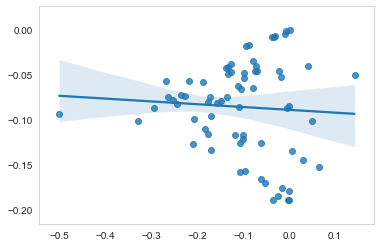



Mutation Carrier
UN9628: r2 = 0.506
DIAN EYO: 0.9
Mean Cortical SUVR: 2.56
Mean ref rate of change for probs: -0.13945669243031242
Mean post-cing ref rate of change: -0.20102973270504082
Mutation Carrier


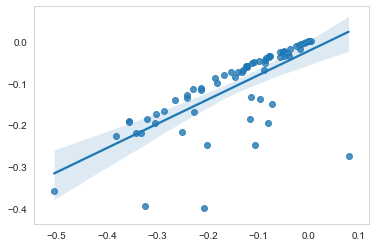



Noncarrier
UZN1YS: r2 = 0.983
DIAN EYO: 2.25
Mean Cortical SUVR: 1.02
Mean ref rate of change for probs: -0.0005787678757863946
Mean post-cing ref rate of change: 0.0
Noncarrier


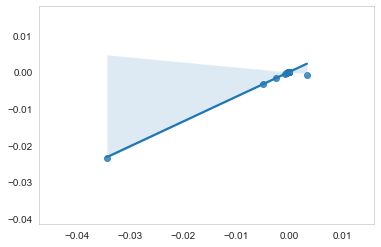



Mutation Carrier
VKTMIY: r2 = 0.371
DIAN EYO: 8.87
Mean Cortical SUVR: 4.1
Mean ref rate of change for probs: 0.06403639446779648
Mean post-cing ref rate of change: 0.05151662490659692
Mutation Carrier


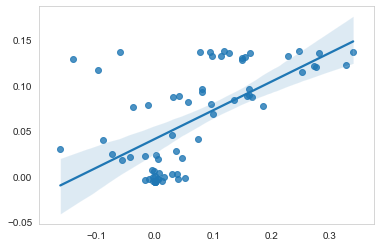



Noncarrier
VPEKVQ: r2 = 1.0
DIAN EYO: -5.59
Mean Cortical SUVR: 0.93
Mean ref rate of change for probs: -1.148356175269838e-151
Mean post-cing ref rate of change: 0.0
Noncarrier


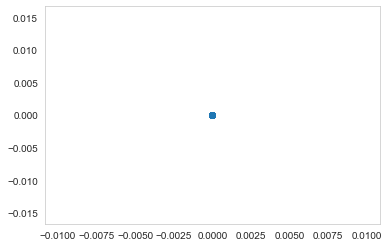



Mutation Carrier
W7S78P: r2 = 0.225
DIAN EYO: 1.02
Mean Cortical SUVR: 4.64
Mean ref rate of change for probs: 0.05859653052912264
Mean post-cing ref rate of change: 0.000891637037146085
Mutation Carrier


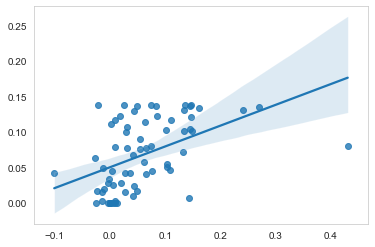



Mutation Carrier
WL3UA1: r2 = 0.197
DIAN EYO: -3.68
Mean Cortical SUVR: 2.15
Mean ref rate of change for probs: 0.0676481424940823
Mean post-cing ref rate of change: 0.09004741537682032
Mutation Carrier


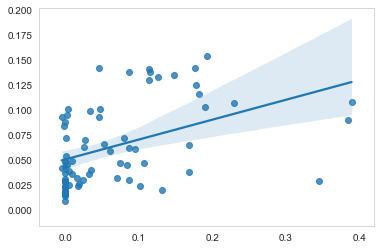



Mutation Carrier
YRMIIE: r2 = 0.002
DIAN EYO: 6.65
Mean Cortical SUVR: 4.76
Mean ref rate of change for probs: -0.006911132759330198
Mean post-cing ref rate of change: 0.00853017073456117
Mutation Carrier


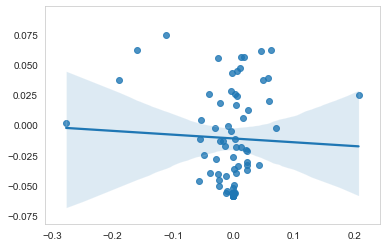



Mutation Carrier
0LA7SQ: r2 = 0.012
DIAN EYO: -0.45
Mean Cortical SUVR: 3.24
Mean ref rate of change for probs: 0.001065555059186706
Mean post-cing ref rate of change: 0.009742002652038872
Mutation Carrier


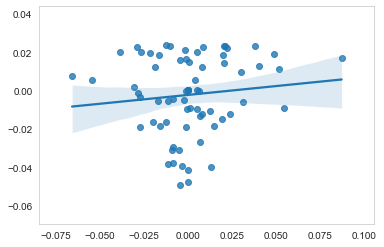



Mutation Carrier
0RN4X6: r2 = 0.186
DIAN EYO: -17.68
Mean Cortical SUVR: 1.28
Mean ref rate of change for probs: 0.0014162957461926339
Mean post-cing ref rate of change: 2.2341997172575576e-05
Mutation Carrier


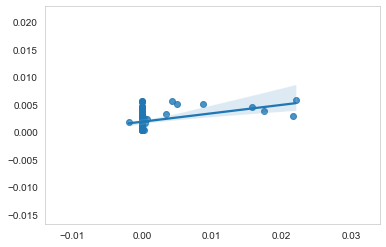



Noncarrier
2ZCX99: r2 = 0.265
DIAN EYO: -4.78
Mean Cortical SUVR: 1.0
Mean ref rate of change for probs: 1.116855348533893e-05
Mean post-cing ref rate of change: 0.0
Noncarrier


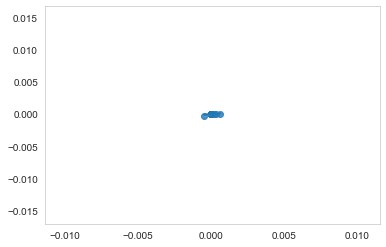



Mutation Carrier
3QM9OP: r2 = 0.233
DIAN EYO: -7.75
Mean Cortical SUVR: 1.73
Mean ref rate of change for probs: 0.0003522863342171273
Mean post-cing ref rate of change: -0.04161019629543789
Mutation Carrier


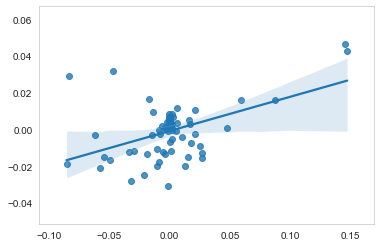



Noncarrier
3WWCQ9: r2 = 1.0
DIAN EYO: 0.08
Mean Cortical SUVR: 1.09
Mean ref rate of change for probs: -1.0302157995424085e-05
Mean post-cing ref rate of change: 0.0
Noncarrier


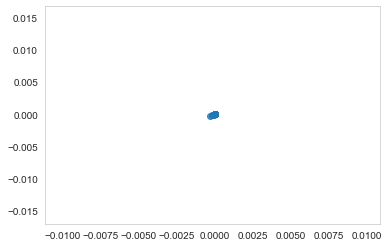



Mutation Carrier
44CAVQ: r2 = 0.156
DIAN EYO: -19.92
Mean Cortical SUVR: 1.66
Mean ref rate of change for probs: 0.018672084262210092
Mean post-cing ref rate of change: 0.01837657746004216
Mutation Carrier


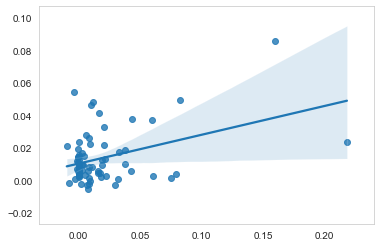



Mutation Carrier
4HUNQS: r2 = 0.113
DIAN EYO: 3.05
Mean Cortical SUVR: 2.8
Mean ref rate of change for probs: -0.043376243640803516
Mean post-cing ref rate of change: -0.0701755042309193
Mutation Carrier


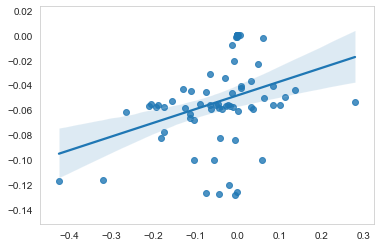



Mutation Carrier
4LLB2T: r2 = 0.037
DIAN EYO: 3.63
Mean Cortical SUVR: 2.92
Mean ref rate of change for probs: 0.008799598959265926
Mean post-cing ref rate of change: -0.004665373830797823
Mutation Carrier


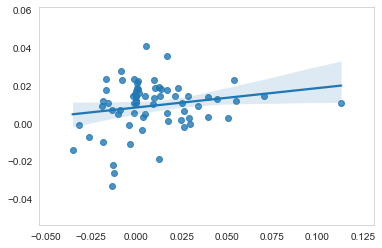



Mutation Carrier
5ILQGC: r2 = nan
DIAN EYO: -19.82
Mean Cortical SUVR: 1.0
Mean ref rate of change for probs: 9.239778725779075e-06
Mean post-cing ref rate of change: 0.0
Mutation Carrier


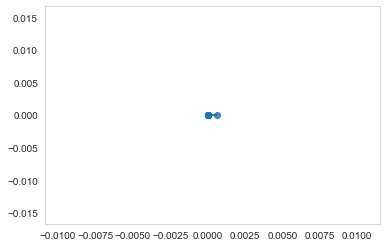



Mutation Carrier
62UV1H: r2 = 0.635
DIAN EYO: 3.81
Mean Cortical SUVR: 1.86
Mean ref rate of change for probs: -0.013774546909000561
Mean post-cing ref rate of change: -0.0015225613703655706
Mutation Carrier


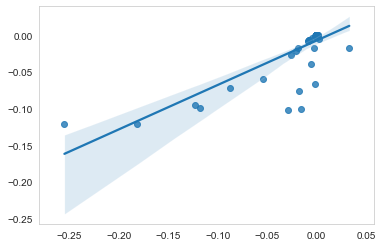



Mutation Carrier
9HBSN9: r2 = 0.013
DIAN EYO: 4.32
Mean Cortical SUVR: 3.96
Mean ref rate of change for probs: 0.010859970463636693
Mean post-cing ref rate of change: -0.005929352940476944
Mutation Carrier


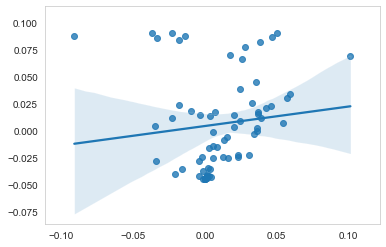



Noncarrier
AKJ1YE: r2 = 0.982
DIAN EYO: 6.97
Mean Cortical SUVR: 0.91
Mean ref rate of change for probs: -0.0008820728434856735
Mean post-cing ref rate of change: -0.0031846596303916645
Noncarrier


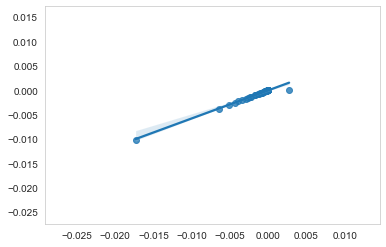



Noncarrier
AP992Q: r2 = 1.0
DIAN EYO: 5.83
Mean Cortical SUVR: 1.2
Mean ref rate of change for probs: -0.0005776645851846152
Mean post-cing ref rate of change: 0.0
Noncarrier


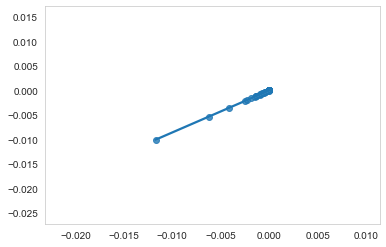



Mutation Carrier
AZ5MWZ: r2 = 1.0
DIAN EYO: -6.57
Mean Cortical SUVR: 1.0
Mean ref rate of change for probs: -1.1921996641156276e-05
Mean post-cing ref rate of change: 0.0
Mutation Carrier


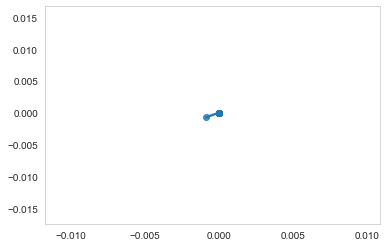



Mutation Carrier
C5HB23: r2 = 0.086
DIAN EYO: -0.29
Mean Cortical SUVR: 1.16
Mean ref rate of change for probs: 0.0007639946955269882
Mean post-cing ref rate of change: 0.0018092611241166145
Mutation Carrier


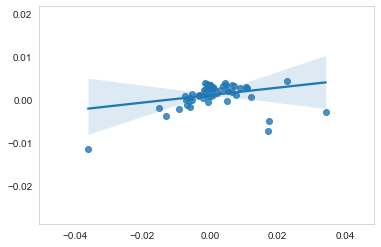



Noncarrier
DA0DVX: r2 = 0.203
DIAN EYO: -3.46
Mean Cortical SUVR: 1.07
Mean ref rate of change for probs: 0.000852688070026525
Mean post-cing ref rate of change: 0.004325759333409139
Noncarrier


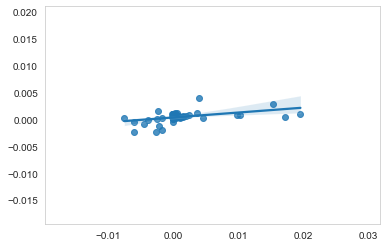



Mutation Carrier
F9Y8XT: r2 = 0.005
DIAN EYO: 5.77
Mean Cortical SUVR: 3.11
Mean ref rate of change for probs: 0.02330776111316235
Mean post-cing ref rate of change: 0.004324398094743875
Mutation Carrier


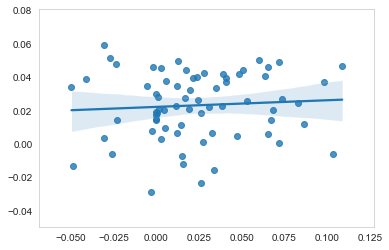



Mutation Carrier
FI05HF: r2 = 0.234
DIAN EYO: 1.68
Mean Cortical SUVR: 3.08
Mean ref rate of change for probs: 0.034781272127266796
Mean post-cing ref rate of change: 0.015292799056432658
Mutation Carrier


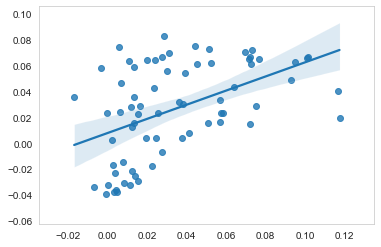



Mutation Carrier
GR3BSU: r2 = 0.669
DIAN EYO: 0.37
Mean Cortical SUVR: 2.29
Mean ref rate of change for probs: 0.10576017061854862
Mean post-cing ref rate of change: 0.08325368770155919
Mutation Carrier


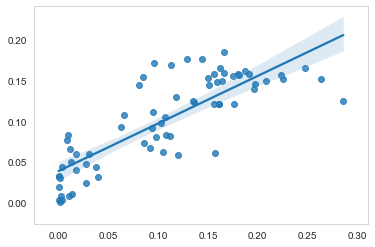



Mutation Carrier
HDK66G: r2 = 0.032
DIAN EYO: -29.83
Mean Cortical SUVR: 1.09
Mean ref rate of change for probs: 5.056147860994556e-05
Mean post-cing ref rate of change: 7.03891747080433e-05
Mutation Carrier


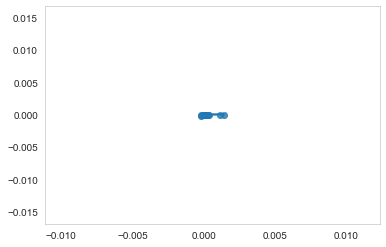



Noncarrier
IWH7L1: r2 = nan
DIAN EYO: -20.17
Mean Cortical SUVR: 1.05
Mean ref rate of change for probs: 7.513501249660933e-05
Mean post-cing ref rate of change: 0.0
Noncarrier


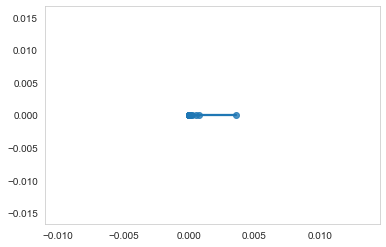



Mutation Carrier
J69QF3: r2 = 1.0
DIAN EYO: -10.04
Mean Cortical SUVR: 1.12
Mean ref rate of change for probs: -3.891684004443213e-06
Mean post-cing ref rate of change: 0.0
Mutation Carrier


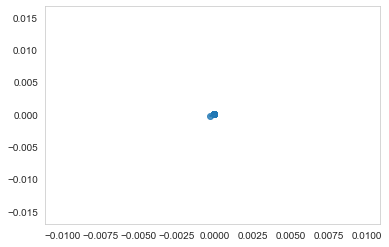



Noncarrier
JRG21A: r2 = 0.022
DIAN EYO: -10.81
Mean Cortical SUVR: 1.06
Mean ref rate of change for probs: 0.0016090760275052568
Mean post-cing ref rate of change: -0.0003693878521166755
Noncarrier


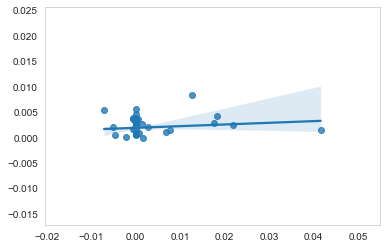



Mutation Carrier
KG4W9Z: r2 = 0.228
DIAN EYO: -5.68
Mean Cortical SUVR: 1.85
Mean ref rate of change for probs: 0.053025948470000014
Mean post-cing ref rate of change: 0.06634006111458261
Mutation Carrier


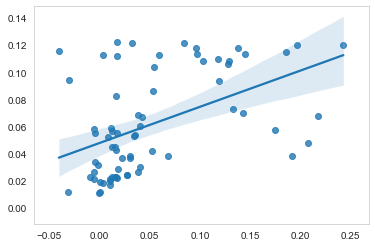



Mutation Carrier
KUVUGB: r2 = 0.613
DIAN EYO: -15.13
Mean Cortical SUVR: 1.58
Mean ref rate of change for probs: 0.026196133895174088
Mean post-cing ref rate of change: 0.04165347691842811
Mutation Carrier


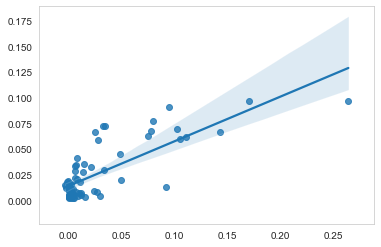



Mutation Carrier
L2YDAS: r2 = 0.028
DIAN EYO: 6.99
Mean Cortical SUVR: 4.38
Mean ref rate of change for probs: 0.017241827421593813
Mean post-cing ref rate of change: 0.03435403100699233
Mutation Carrier


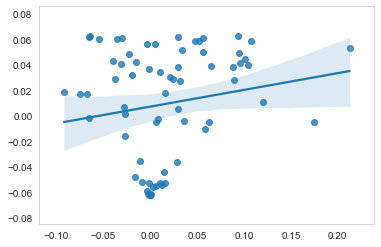



Noncarrier
MA5V2F: r2 = 0.002
DIAN EYO: -7.11
Mean Cortical SUVR: 0.94
Mean ref rate of change for probs: 8.874992672775187e-05
Mean post-cing ref rate of change: 0.0
Noncarrier


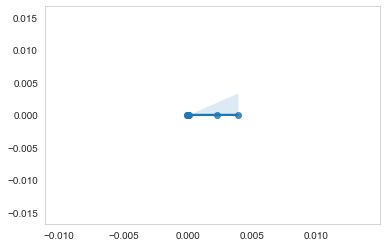



Noncarrier
MOUL5R: r2 = 1.0
DIAN EYO: -5.46
Mean Cortical SUVR: 0.9
Mean ref rate of change for probs: -0.0003539586144996991
Mean post-cing ref rate of change: 0.0
Noncarrier


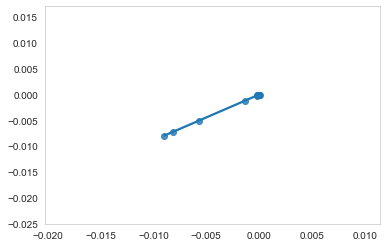



Mutation Carrier
MZR5QU: r2 = 0.049
DIAN EYO: -1.47
Mean Cortical SUVR: 2.16
Mean ref rate of change for probs: -0.013034551499464857
Mean post-cing ref rate of change: 0.06059404262974429
Mutation Carrier


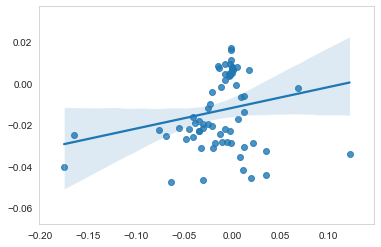



Mutation Carrier
NOFLPK: r2 = 0.611
DIAN EYO: -9.76
Mean Cortical SUVR: 2.44
Mean ref rate of change for probs: 0.07219069483362932
Mean post-cing ref rate of change: 0.02093101820406453
Mutation Carrier


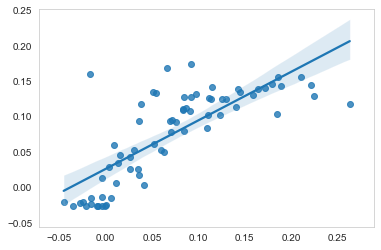



Mutation Carrier
OTO2HD: r2 = 0.323
DIAN EYO: 2.69
Mean Cortical SUVR: 4.15
Mean ref rate of change for probs: 0.0701526383852196
Mean post-cing ref rate of change: 0.05651310823412039
Mutation Carrier


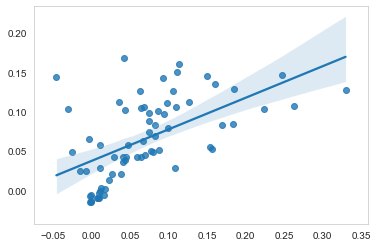



Mutation Carrier
P2YHNA: r2 = 0.003
DIAN EYO: 1.4
Mean Cortical SUVR: 2.82
Mean ref rate of change for probs: -0.006983035815920677
Mean post-cing ref rate of change: 0.025041075847081148
Mutation Carrier


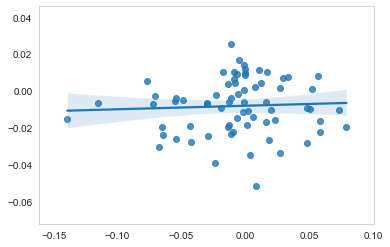



Mutation Carrier
PFH1PM: r2 = 0.293
DIAN EYO: 3.18
Mean Cortical SUVR: 1.09
Mean ref rate of change for probs: 0.09934386169298379
Mean post-cing ref rate of change: 0.030263932966904977
Mutation Carrier


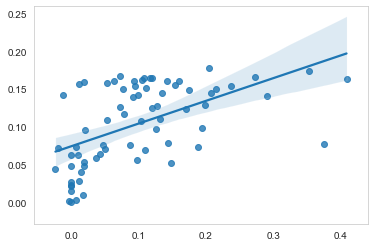



Mutation Carrier
QQ3EQ6: r2 = 0.291
DIAN EYO: -0.21
Mean Cortical SUVR: 2.49
Mean ref rate of change for probs: 0.011082080354953961
Mean post-cing ref rate of change: 0.021594836745507273
Mutation Carrier


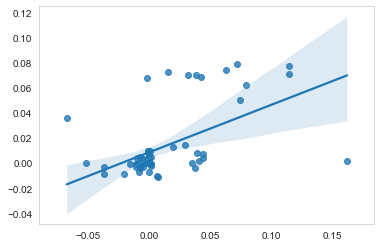



Mutation Carrier
RA9E9U: r2 = 0.478
DIAN EYO: -17.48
Mean Cortical SUVR: 1.15
Mean ref rate of change for probs: 0.0014776645792916514
Mean post-cing ref rate of change: -2.923834702236251e-05
Mutation Carrier


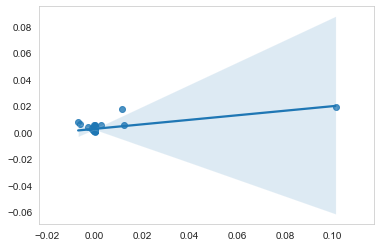



Noncarrier
SNLCWR: r2 = 0.058
DIAN EYO: -17.43
Mean Cortical SUVR: 1.01
Mean ref rate of change for probs: 0.0017997718124050555
Mean post-cing ref rate of change: 0.0019253548604799872
Noncarrier


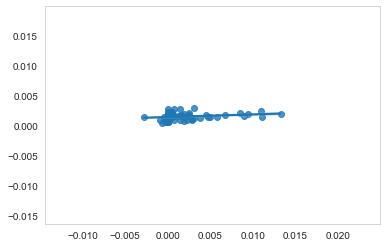



Mutation Carrier
UB4BB8: r2 = 0.537
DIAN EYO: 0.42
Mean Cortical SUVR: 5.24
Mean ref rate of change for probs: 0.04116319648958515
Mean post-cing ref rate of change: 0.04038355248638254
Mutation Carrier


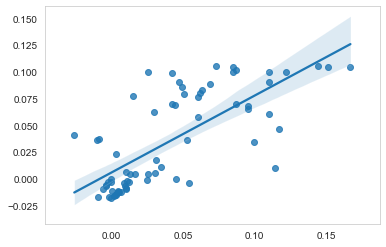



Mutation Carrier
VFU1K1: r2 = 0.204
DIAN EYO: -11.41
Mean Cortical SUVR: 3.11
Mean ref rate of change for probs: 0.05085687365611632
Mean post-cing ref rate of change: 0.03212806843154299
Mutation Carrier


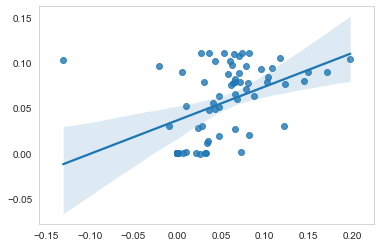



Noncarrier
WQCPKV: r2 = nan
DIAN EYO: -10.49
Mean Cortical SUVR: 1.02
Mean ref rate of change for probs: 0.0
Mean post-cing ref rate of change: 0.0
Noncarrier


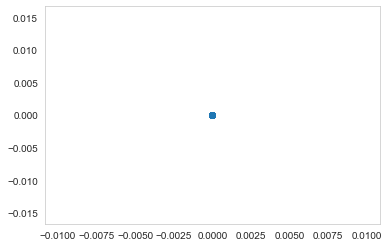



Noncarrier
XGTYID: r2 = 0.906
DIAN EYO: -0.91
Mean Cortical SUVR: 0.88
Mean ref rate of change for probs: -0.003120397687294348
Mean post-cing ref rate of change: -0.0005073292225946857
Noncarrier


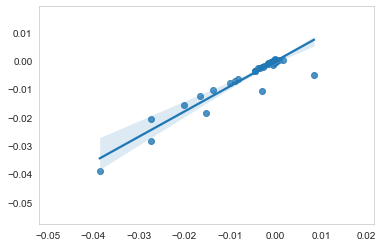



Noncarrier
XJSZOD: r2 = nan
DIAN EYO: -8.41
Mean Cortical SUVR: 0.96
Mean ref rate of change for probs: 0.0
Mean post-cing ref rate of change: 0.0
Noncarrier


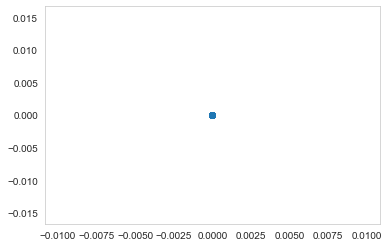



Noncarrier
XMUWSN: r2 = 0.999
DIAN EYO: -1.06
Mean Cortical SUVR: 1.06
Mean ref rate of change for probs: -0.0002294010453848228
Mean post-cing ref rate of change: -1.8518362141238212e-05
Noncarrier


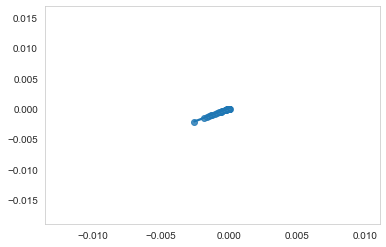



Noncarrier
0O5OD0: r2 = 0.381
DIAN EYO: -12.85
Mean Cortical SUVR: 0.98
Mean ref rate of change for probs: -2.3499318308964506e-07
Mean post-cing ref rate of change: 0.0
Noncarrier


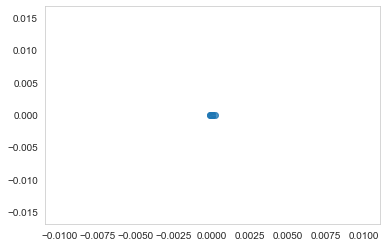



Mutation Carrier
1BVPA1: r2 = 0.993
DIAN EYO: 0.95
Mean Cortical SUVR: 1.16
Mean ref rate of change for probs: -8.129325227239396e-05
Mean post-cing ref rate of change: 0.0
Mutation Carrier


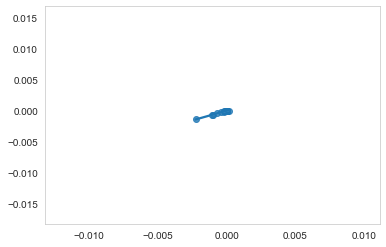



Noncarrier
1KP11R: r2 = 1.0
DIAN EYO: -11.22
Mean Cortical SUVR: 1.0
Mean ref rate of change for probs: -0.00016522207144245644
Mean post-cing ref rate of change: -0.00024201373607051792
Noncarrier


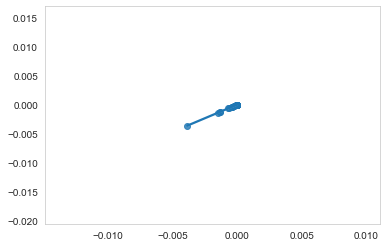



Noncarrier
293IV5: r2 = 0.833
DIAN EYO: -17.4
Mean Cortical SUVR: 1.0
Mean ref rate of change for probs: -0.0002844962630002711
Mean post-cing ref rate of change: -0.0012344558830362277
Noncarrier


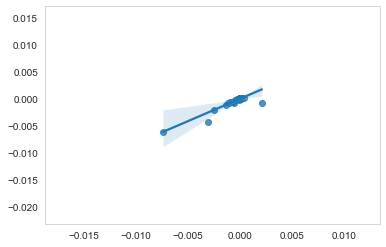



Mutation Carrier
2D1APM: r2 = 0.35
DIAN EYO: -4.95
Mean Cortical SUVR: 4.14
Mean ref rate of change for probs: 0.03151672235659874
Mean post-cing ref rate of change: 0.014195594083098529
Mutation Carrier


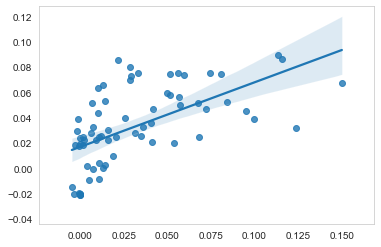



Noncarrier
2ES6B9: r2 = nan
DIAN EYO: 11.6
Mean Cortical SUVR: 1.07
Mean ref rate of change for probs: 9.787767286255612e-06
Mean post-cing ref rate of change: 4.291107717703128e-05
Noncarrier


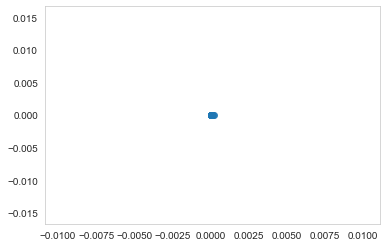



Mutation Carrier
2P1WOY: r2 = 0.215
DIAN EYO: -6.21
Mean Cortical SUVR: 2.32
Mean ref rate of change for probs: 0.09939675773179357
Mean post-cing ref rate of change: 0.0878072446668691
Mutation Carrier


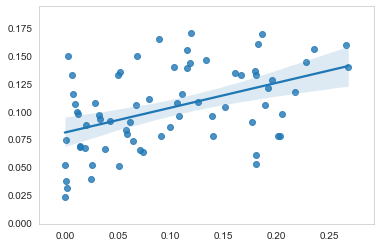



Mutation Carrier
3RC7PE: r2 = 0.1
DIAN EYO: -13.49
Mean Cortical SUVR: 1.08
Mean ref rate of change for probs: 0.0007905356097620807
Mean post-cing ref rate of change: 0.0
Mutation Carrier


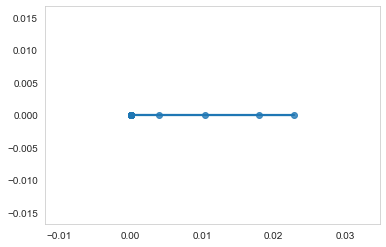



Noncarrier
41L6T6: r2 = 0.796
DIAN EYO: -7.96
Mean Cortical SUVR: nan
Mean ref rate of change for probs: -9.62936812654568e-07
Mean post-cing ref rate of change: 0.0
Noncarrier


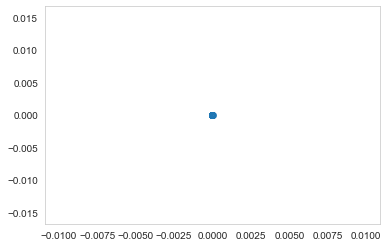



Mutation Carrier
41VBKZ: r2 = 0.0
DIAN EYO: -11.47
Mean Cortical SUVR: 1.91
Mean ref rate of change for probs: 0.029297825727147498
Mean post-cing ref rate of change: 0.03055829146482548
Mutation Carrier


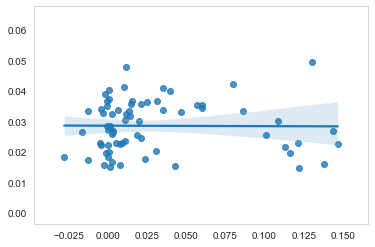



Noncarrier
4J49QW: r2 = 0.767
DIAN EYO: 14.07
Mean Cortical SUVR: 0.92
Mean ref rate of change for probs: -4.494213697605322e-05
Mean post-cing ref rate of change: 0.0
Noncarrier


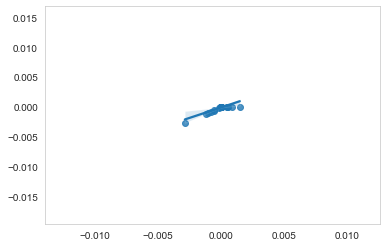



Mutation Carrier
5FZWKH: r2 = 0.937
DIAN EYO: -18.09
Mean Cortical SUVR: 0.93
Mean ref rate of change for probs: -1.759116772418162e-05
Mean post-cing ref rate of change: -7.046477058931514e-167
Mutation Carrier


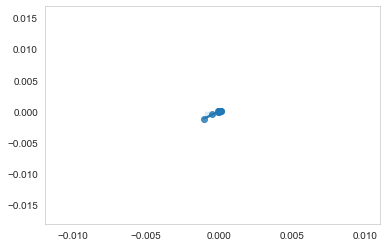



Mutation Carrier
5OGELK: r2 = 0.062
DIAN EYO: -15.98
Mean Cortical SUVR: 1.42
Mean ref rate of change for probs: 0.0037994204148160565
Mean post-cing ref rate of change: 0.005627385974039061
Mutation Carrier


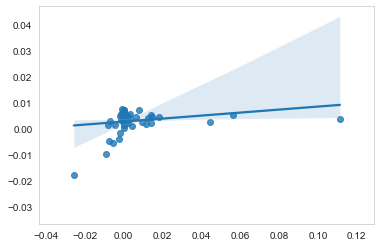



Mutation Carrier
6KLYSA: r2 = 0.472
DIAN EYO: 1.66
Mean Cortical SUVR: nan
Mean ref rate of change for probs: 0.05954840070994807
Mean post-cing ref rate of change: 0.055960191003226675
Mutation Carrier


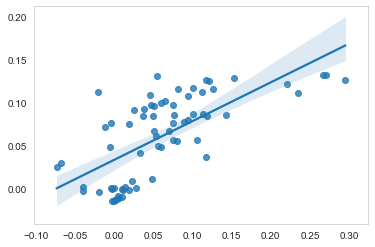



Noncarrier
6XGHMZ: r2 = 1.0
DIAN EYO: -8.3
Mean Cortical SUVR: 1.04
Mean ref rate of change for probs: -0.0006903654660318697
Mean post-cing ref rate of change: -0.0005748852000024464
Noncarrier


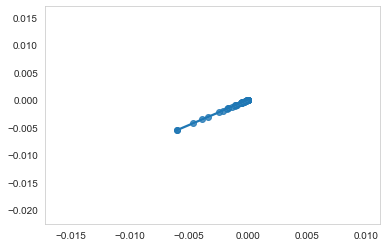



Noncarrier
71EU2X: r2 = nan
DIAN EYO: -15.71
Mean Cortical SUVR: 1.02
Mean ref rate of change for probs: 2.3870538497292117e-06
Mean post-cing ref rate of change: 0.0
Noncarrier


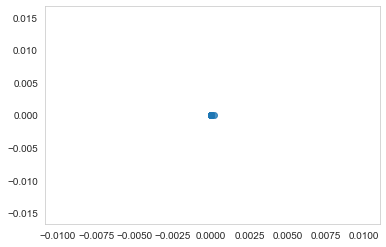



Noncarrier
7U5XQ7: r2 = 0.268
DIAN EYO: 8.73
Mean Cortical SUVR: 1.3
Mean ref rate of change for probs: 0.005629953466387402
Mean post-cing ref rate of change: 0.0006694959644494429
Noncarrier


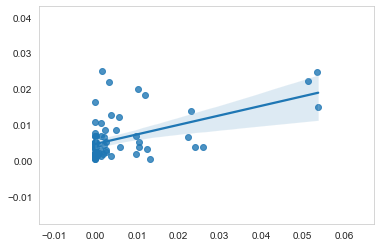



Mutation Carrier
8XXUDD: r2 = 0.163
DIAN EYO: -12.89
Mean Cortical SUVR: 1.9
Mean ref rate of change for probs: -0.0037770660099619283
Mean post-cing ref rate of change: 0.00190924397366838
Mutation Carrier


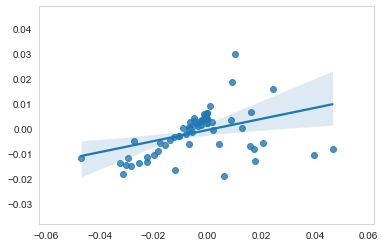



Noncarrier
AZVW0Q: r2 = 1.0
DIAN EYO: -16.37
Mean Cortical SUVR: 0.94
Mean ref rate of change for probs: -0.002684695115993474
Mean post-cing ref rate of change: -0.0002927043824147758
Noncarrier


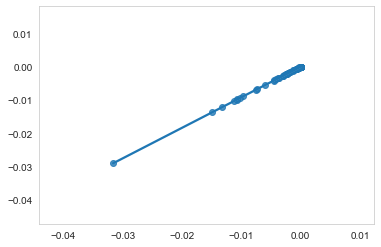



Noncarrier
BMV2ZL: r2 = 0.585
DIAN EYO: -21.62
Mean Cortical SUVR: 1.1
Mean ref rate of change for probs: -3.588293459816622e-05
Mean post-cing ref rate of change: 3.3983090014408826e-05
Noncarrier


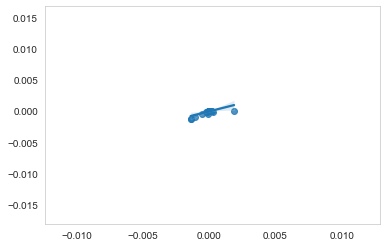



Noncarrier
CD8IP3: r2 = 0.817
DIAN EYO: 6.57
Mean Cortical SUVR: 0.9
Mean ref rate of change for probs: -0.0024573865645839176
Mean post-cing ref rate of change: -0.00010713988149096051
Noncarrier


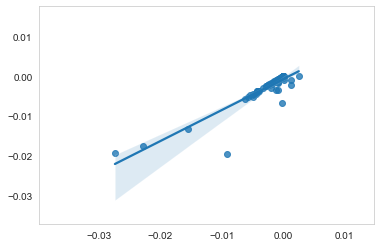



Mutation Carrier
D1YOXP: r2 = 0.386
DIAN EYO: -11.68
Mean Cortical SUVR: 1.65
Mean ref rate of change for probs: -0.015372377923683955
Mean post-cing ref rate of change: -0.021127044138982552
Mutation Carrier


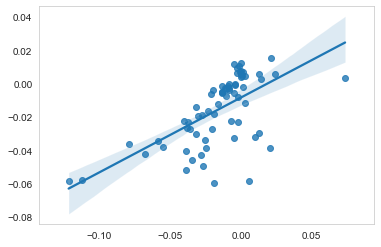



Noncarrier
DDZ9FW: r2 = 1.0
DIAN EYO: -14.48
Mean Cortical SUVR: 1.06
Mean ref rate of change for probs: -8.794753146438546e-06
Mean post-cing ref rate of change: 0.0
Noncarrier


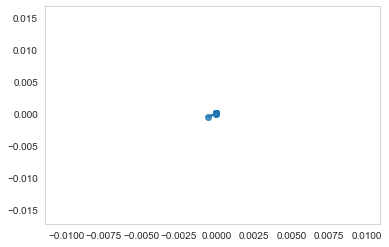



Mutation Carrier
DF2ECY: r2 = 0.327
DIAN EYO: -19.49
Mean Cortical SUVR: 1.27
Mean ref rate of change for probs: 0.0001536065757811824
Mean post-cing ref rate of change: 8.815061469658023e-05
Mutation Carrier


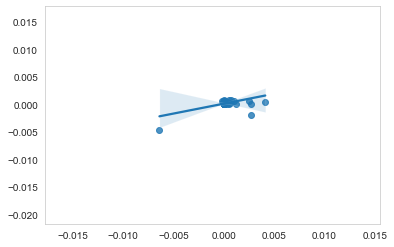



Mutation Carrier
DHYR5O: r2 = 0.944
DIAN EYO: -14.53
Mean Cortical SUVR: 1.1
Mean ref rate of change for probs: -3.876251299547749e-05
Mean post-cing ref rate of change: 9.920526267251992e-06
Mutation Carrier


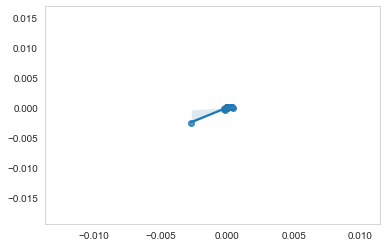



Noncarrier
F2T4YV: r2 = 0.998
DIAN EYO: -14.5
Mean Cortical SUVR: 1.01
Mean ref rate of change for probs: -0.0009175538679611265
Mean post-cing ref rate of change: -0.002241511942727939
Noncarrier


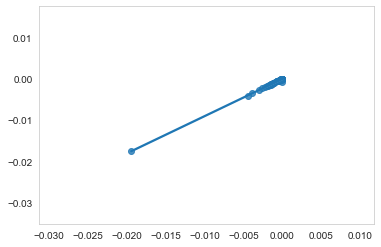



Mutation Carrier
F8ZIH8: r2 = 0.993
DIAN EYO: -16.55
Mean Cortical SUVR: 1.11
Mean ref rate of change for probs: -0.003669674321512947
Mean post-cing ref rate of change: -0.002662282288046971
Mutation Carrier


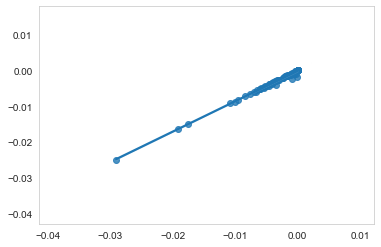



Noncarrier
FBEEU3: r2 = 0.275
DIAN EYO: -12.56
Mean Cortical SUVR: 1.04
Mean ref rate of change for probs: 5.35015906686678e-06
Mean post-cing ref rate of change: 3.4194594773298925e-169
Noncarrier


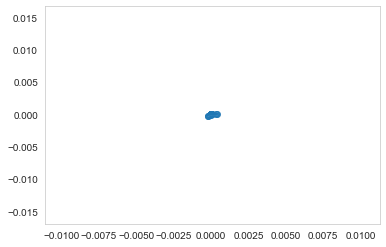



Mutation Carrier
FR4AL7: r2 = 1.0
DIAN EYO: -4.24
Mean Cortical SUVR: 1.53
Mean ref rate of change for probs: -0.000969664256574583
Mean post-cing ref rate of change: -0.00039320624994989683
Mutation Carrier


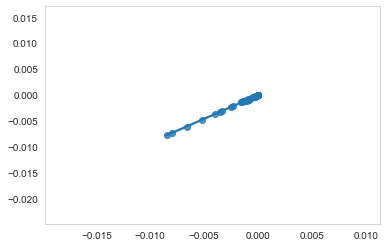



Mutation Carrier
G07MMZ: r2 = 0.07
DIAN EYO: -19.82
Mean Cortical SUVR: 1.08
Mean ref rate of change for probs: 5.512560158528341e-05
Mean post-cing ref rate of change: 0.0001238381436563196
Mutation Carrier


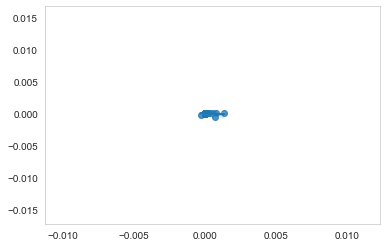



Noncarrier
G9EQHL: r2 = 0.503
DIAN EYO: -14.76
Mean Cortical SUVR: 0.99
Mean ref rate of change for probs: 1.4648405344706432e-05
Mean post-cing ref rate of change: 7.587434699584985e-05
Noncarrier


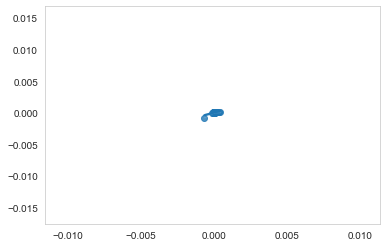



Mutation Carrier
GJDUBJ: r2 = 0.896
DIAN EYO: -4.43
Mean Cortical SUVR: 1.09
Mean ref rate of change for probs: -0.0003868127909909565
Mean post-cing ref rate of change: -0.00010579218563904932
Mutation Carrier


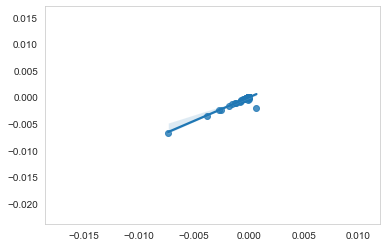



Mutation Carrier
GM4TCN: r2 = 0.417
DIAN EYO: -18.52
Mean Cortical SUVR: 2.35
Mean ref rate of change for probs: 0.01811567237327232
Mean post-cing ref rate of change: 0.05555083496712689
Mutation Carrier


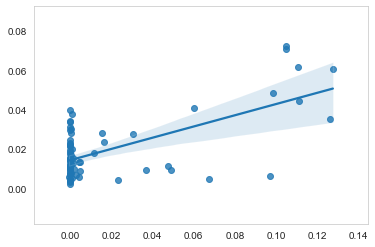



Noncarrier
H9CLW8: r2 = 0.301
DIAN EYO: -11.98
Mean Cortical SUVR: 1.26
Mean ref rate of change for probs: 0.003920951059576507
Mean post-cing ref rate of change: 0.00943282837637417
Noncarrier


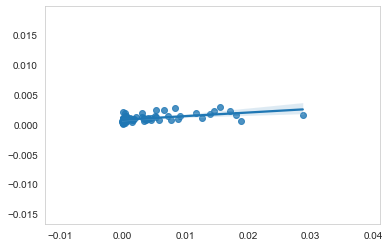



Noncarrier
HBDE5F: r2 = 1.0
DIAN EYO: -17.98
Mean Cortical SUVR: 0.96
Mean ref rate of change for probs: -0.004391791271101143
Mean post-cing ref rate of change: -0.009075758004918928
Noncarrier


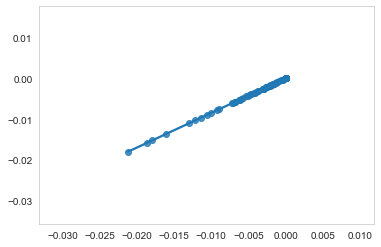



Mutation Carrier
HFCLR1: r2 = 0.426
DIAN EYO: 2.39
Mean Cortical SUVR: 1.0
Mean ref rate of change for probs: -9.82131362124909e-05
Mean post-cing ref rate of change: -0.0001043267822270755
Mutation Carrier


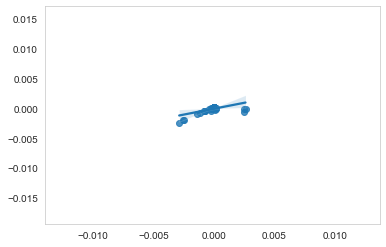



Mutation Carrier
HONS3G: r2 = 0.178
DIAN EYO: 4.92
Mean Cortical SUVR: 2.1
Mean ref rate of change for probs: 0.005221530004164269
Mean post-cing ref rate of change: 0.015000315396951687
Mutation Carrier


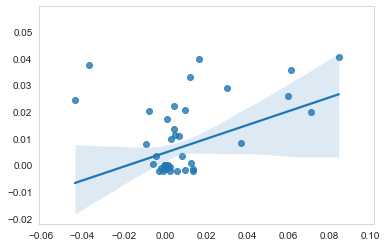



Noncarrier
HYXE1H: r2 = 0.913
DIAN EYO: -3.94
Mean Cortical SUVR: 0.92
Mean ref rate of change for probs: -0.001513811762356929
Mean post-cing ref rate of change: -0.006165837778417888
Noncarrier


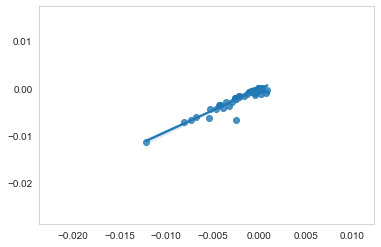



Noncarrier
I296MB: r2 = 0.343
DIAN EYO: -4.1
Mean Cortical SUVR: 1.0
Mean ref rate of change for probs: -4.513882053912041e-05
Mean post-cing ref rate of change: 0.0017769377340569954
Noncarrier


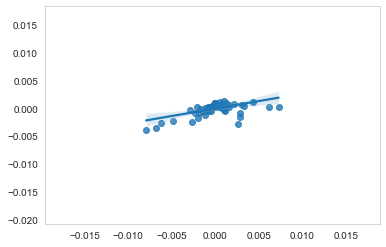



Noncarrier
IZHCNQ: r2 = 0.307
DIAN EYO: -10.79
Mean Cortical SUVR: 0.98
Mean ref rate of change for probs: 0.00022456823594459757
Mean post-cing ref rate of change: 0.00017010573886190022
Noncarrier


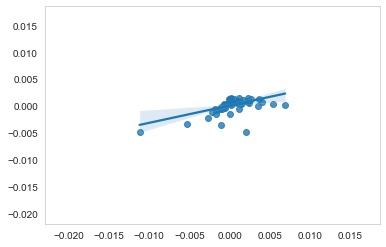



Mutation Carrier
J85UII: r2 = 0.998
DIAN EYO: -15.85
Mean Cortical SUVR: 1.05
Mean ref rate of change for probs: -0.0001593172250119182
Mean post-cing ref rate of change: 8.753165035062116e-05
Mutation Carrier


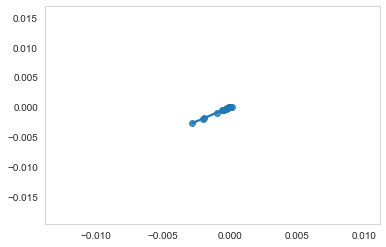



Mutation Carrier
JRF1GO: r2 = 0.752
DIAN EYO: -11.7
Mean Cortical SUVR: 1.86
Mean ref rate of change for probs: 0.028091863042464617
Mean post-cing ref rate of change: 0.07745950597433754
Mutation Carrier


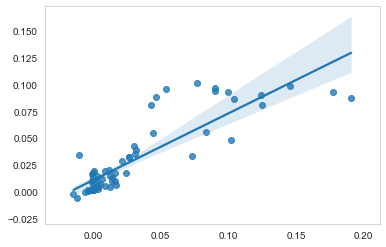



Noncarrier
K6CF46: r2 = 0.047
DIAN EYO: 0.11
Mean Cortical SUVR: 0.97
Mean ref rate of change for probs: 8.632908248209083e-05
Mean post-cing ref rate of change: -0.0002389716890045519
Noncarrier


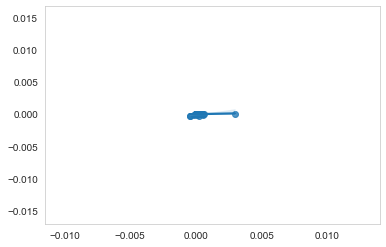



Noncarrier
KSVHOU: r2 = 0.063
DIAN EYO: -16.19
Mean Cortical SUVR: 1.13
Mean ref rate of change for probs: 0.00014647797335312653
Mean post-cing ref rate of change: -0.0005066850782205229
Noncarrier


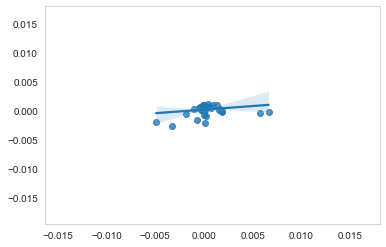



Noncarrier
L8O49P: r2 = 0.224
DIAN EYO: -13.16
Mean Cortical SUVR: 1.06
Mean ref rate of change for probs: 0.0002982539370083719
Mean post-cing ref rate of change: -0.00025451442414686255
Noncarrier


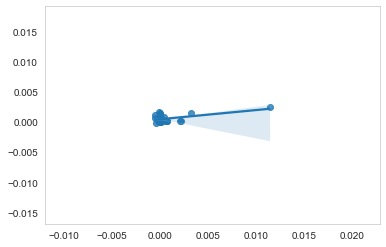



Noncarrier
LFSEUQ: r2 = 0.997
DIAN EYO: 0.79
Mean Cortical SUVR: 1.04
Mean ref rate of change for probs: -0.0001452113488678368
Mean post-cing ref rate of change: -4.7787176559663545e-05
Noncarrier


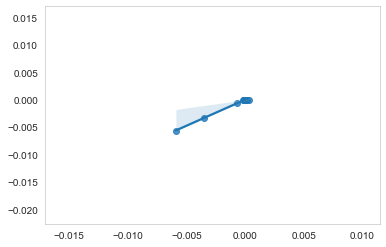



Mutation Carrier
LKU6IH: r2 = 0.32
DIAN EYO: -6.09
Mean Cortical SUVR: 2.11
Mean ref rate of change for probs: 0.0868194460577129
Mean post-cing ref rate of change: 0.15523375139583578
Mutation Carrier


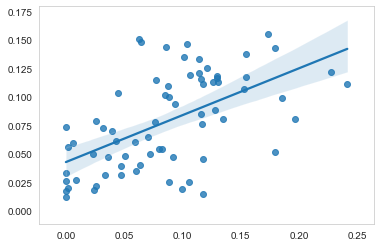



Mutation Carrier
MI97B5: r2 = 0.014
DIAN EYO: 10.5
Mean Cortical SUVR: 4.81
Mean ref rate of change for probs: -0.002629013856390063
Mean post-cing ref rate of change: 0.014927685330234098
Mutation Carrier


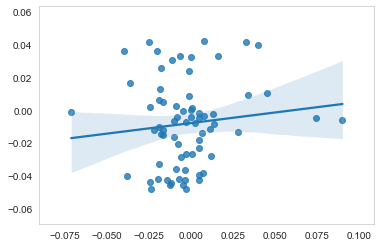



Noncarrier
MQI4EF: r2 = nan
DIAN EYO: -13.59
Mean Cortical SUVR: 1.01
Mean ref rate of change for probs: 4.218094518657037e-07
Mean post-cing ref rate of change: 0.0
Noncarrier


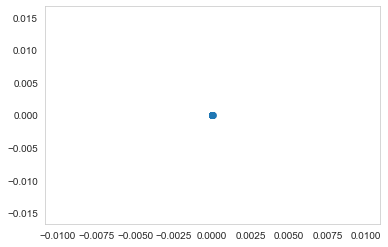



Noncarrier
MTVKBE: r2 = 0.997
DIAN EYO: -6.95
Mean Cortical SUVR: 0.93
Mean ref rate of change for probs: -0.003388010863810252
Mean post-cing ref rate of change: -0.0034228472943957336
Noncarrier


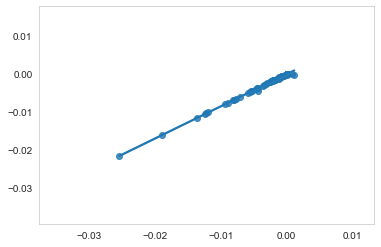



Mutation Carrier
NM1AWO: r2 = 0.01
DIAN EYO: -23.37
Mean Cortical SUVR: 1.02
Mean ref rate of change for probs: 0.003864480204511548
Mean post-cing ref rate of change: 0.003814415660045213
Mutation Carrier


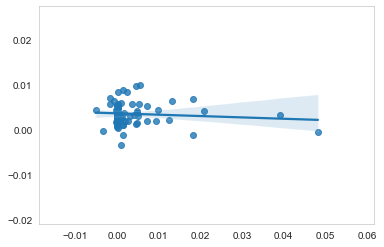



Mutation Carrier
O5RKSU: r2 = 0.449
DIAN EYO: -15.02
Mean Cortical SUVR: 2.27
Mean ref rate of change for probs: 0.051891272348023265
Mean post-cing ref rate of change: 0.07610742972543498
Mutation Carrier


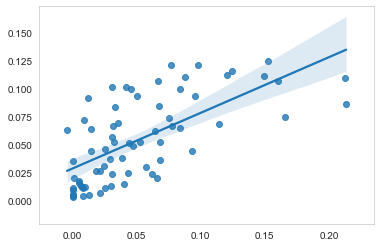



Mutation Carrier
OI1VHG: r2 = 0.039
DIAN EYO: 11.16
Mean Cortical SUVR: 3.71
Mean ref rate of change for probs: 0.006979816561873409
Mean post-cing ref rate of change: 0.0024527165802795316
Mutation Carrier


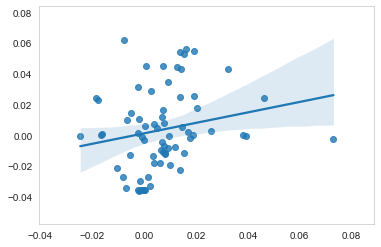



Mutation Carrier
OKPUPX: r2 = 0.996
DIAN EYO: -19.47
Mean Cortical SUVR: 1.02
Mean ref rate of change for probs: -0.0015419416236779218
Mean post-cing ref rate of change: -0.0011047213918531683
Mutation Carrier


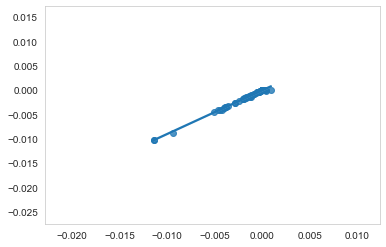



Mutation Carrier
OMDGV9: r2 = 0.341
DIAN EYO: -16.74
Mean Cortical SUVR: 1.58
Mean ref rate of change for probs: 0.018093616585835116
Mean post-cing ref rate of change: 0.025124233217929413
Mutation Carrier


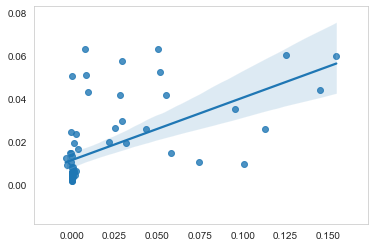



Mutation Carrier
OOSXI9: r2 = 0.533
DIAN EYO: -18.83
Mean Cortical SUVR: 1.88
Mean ref rate of change for probs: 0.0009409261641699247
Mean post-cing ref rate of change: 0.009736014107566492
Mutation Carrier


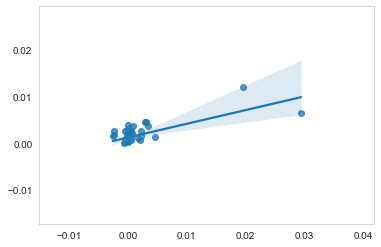



Noncarrier
OPEP4R: r2 = 0.996
DIAN EYO: -22.63
Mean Cortical SUVR: 1.06
Mean ref rate of change for probs: -0.0016788172828052295
Mean post-cing ref rate of change: -0.0007754205679532117
Noncarrier


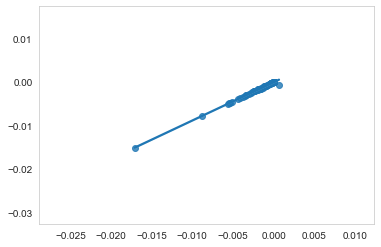



Noncarrier
OUYDMF: r2 = 1.0
DIAN EYO: -2.39
Mean Cortical SUVR: 1.09
Mean ref rate of change for probs: -3.8293214119980157e-05
Mean post-cing ref rate of change: -0.00015180546866457853
Noncarrier


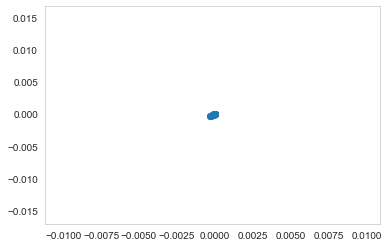



Mutation Carrier
PCQ6GI: r2 = 0.883
DIAN EYO: -11.94
Mean Cortical SUVR: 1.14
Mean ref rate of change for probs: -6.805344133814773e-05
Mean post-cing ref rate of change: -0.0003728491598288742
Mutation Carrier


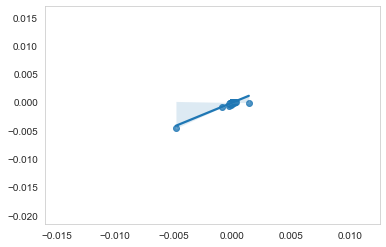



Mutation Carrier
PJJIHZ: r2 = 0.029
DIAN EYO: -4.74
Mean Cortical SUVR: 1.54
Mean ref rate of change for probs: 0.006397624988618946
Mean post-cing ref rate of change: -0.010891298185667747
Mutation Carrier


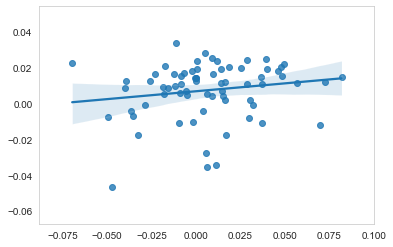



Mutation Carrier
PVACF4: r2 = 0.034
DIAN EYO: -12.66
Mean Cortical SUVR: 0.95
Mean ref rate of change for probs: 1.60716765786109e-05
Mean post-cing ref rate of change: 0.0
Mutation Carrier


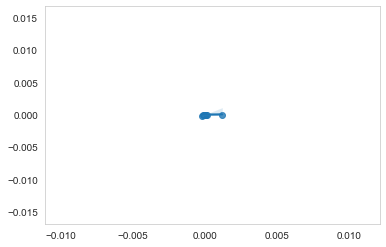



Noncarrier
S21FGN: r2 = 1.0
DIAN EYO: -7.78
Mean Cortical SUVR: 1.03
Mean ref rate of change for probs: -0.0002443965293400126
Mean post-cing ref rate of change: 0.0
Noncarrier


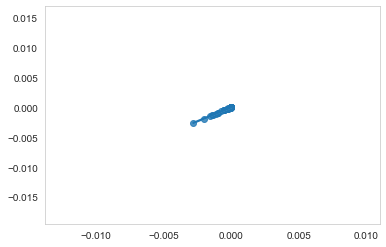



Mutation Carrier
SDN5R9: r2 = 0.202
DIAN EYO: 0.42
Mean Cortical SUVR: 1.45
Mean ref rate of change for probs: 0.0006563702930765567
Mean post-cing ref rate of change: -0.010763514106008855
Mutation Carrier


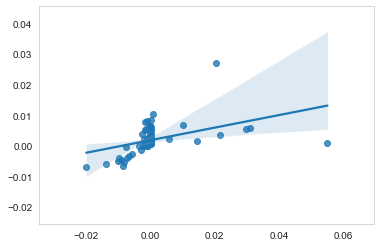



Noncarrier
SPEFRV: r2 = 0.001
DIAN EYO: -19.79
Mean Cortical SUVR: 1.1
Mean ref rate of change for probs: 5.2248873212766524e-05
Mean post-cing ref rate of change: 0.0
Noncarrier


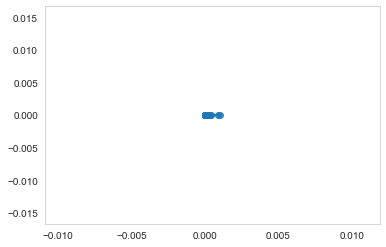



Noncarrier
SRH9ND: r2 = 1.0
DIAN EYO: -26.07
Mean Cortical SUVR: 1.12
Mean ref rate of change for probs: -0.00010674561976052614
Mean post-cing ref rate of change: 0.0
Noncarrier


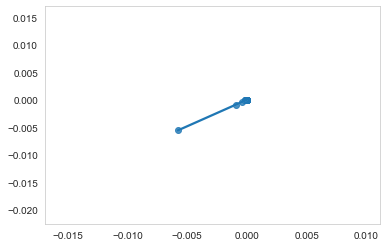



Noncarrier
TANQX8: r2 = 0.37
DIAN EYO: -12.44
Mean Cortical SUVR: 0.97
Mean ref rate of change for probs: -0.0006321994465917365
Mean post-cing ref rate of change: -0.0018049408169574152
Noncarrier


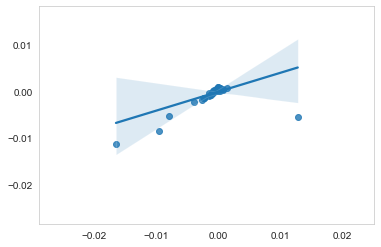



Noncarrier
TCJ2GZ: r2 = 1.0
DIAN EYO: 7.99
Mean Cortical SUVR: 1.04
Mean ref rate of change for probs: -1.3321938001963982e-05
Mean post-cing ref rate of change: 0.0
Noncarrier


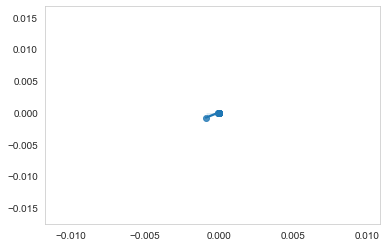



Noncarrier
TI3NJN: r2 = 0.767
DIAN EYO: 7.6
Mean Cortical SUVR: 0.99
Mean ref rate of change for probs: 1.3847245509006626e-05
Mean post-cing ref rate of change: 0.0001459183769954192
Noncarrier


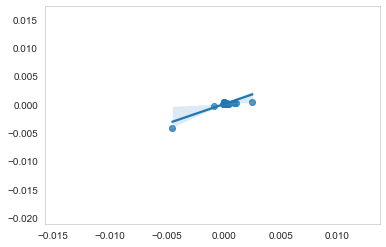



Noncarrier
UMJQEQ: r2 = 0.115
DIAN EYO: -15.83
Mean Cortical SUVR: 1.01
Mean ref rate of change for probs: 1.488045923470474e-05
Mean post-cing ref rate of change: 0.0
Noncarrier


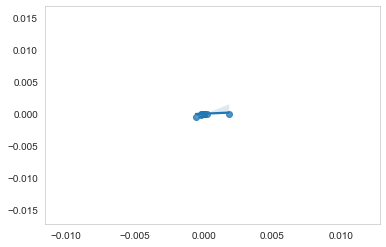



Mutation Carrier
UYUTRU: r2 = 0.163
DIAN EYO: -19.66
Mean Cortical SUVR: 1.56
Mean ref rate of change for probs: 0.028001601694044816
Mean post-cing ref rate of change: 0.016936751270210316
Mutation Carrier


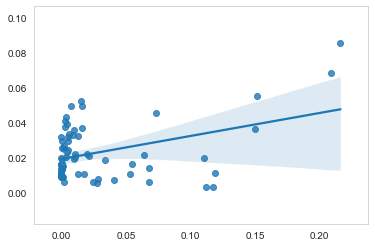



Noncarrier
V24NB2: r2 = 1.0
DIAN EYO: -17.78
Mean Cortical SUVR: 1.14
Mean ref rate of change for probs: -2.974790764388433e-06
Mean post-cing ref rate of change: 0.0
Noncarrier


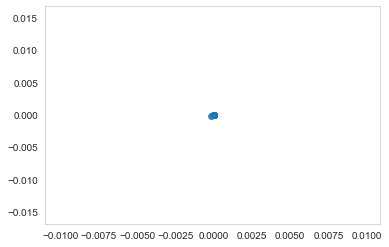



Mutation Carrier
VMGRO8: r2 = 0.982
DIAN EYO: -6.29
Mean Cortical SUVR: 1.08
Mean ref rate of change for probs: -8.302233913181994e-05
Mean post-cing ref rate of change: -3.7248300407135422e-199
Mutation Carrier


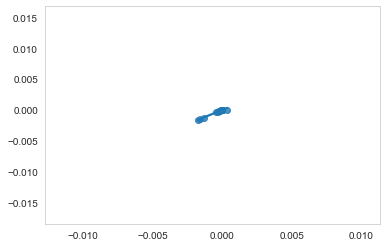



Mutation Carrier
WDQRU0: r2 = 0.952
DIAN EYO: -26.97
Mean Cortical SUVR: 0.97
Mean ref rate of change for probs: -0.01845232887517813
Mean post-cing ref rate of change: -0.01896659711424569
Mutation Carrier


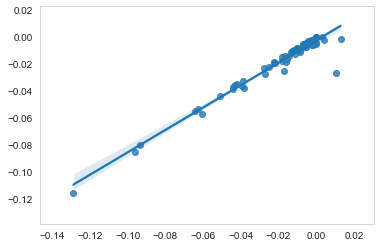



Noncarrier
WGNDC1: r2 = 1.0
DIAN EYO: -11.6
Mean Cortical SUVR: 1.05
Mean ref rate of change for probs: -0.0001384517573270231
Mean post-cing ref rate of change: -1.20951934e-316
Noncarrier


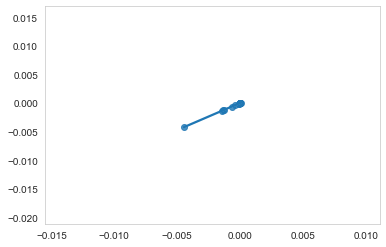



Mutation Carrier
WWG4NB: r2 = 0.13
DIAN EYO: 4.07
Mean Cortical SUVR: 3.16
Mean ref rate of change for probs: 0.008110045506531261
Mean post-cing ref rate of change: -0.0015470981188712807
Mutation Carrier


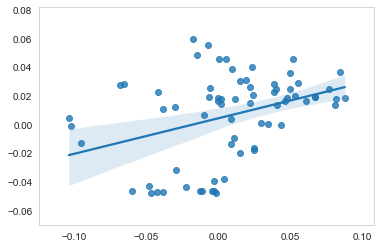



Noncarrier
XJCYRZ: r2 = 0.179
DIAN EYO: -13.14
Mean Cortical SUVR: 1.0
Mean ref rate of change for probs: 1.002586986573577e-05
Mean post-cing ref rate of change: 3.006861965887262e-41
Noncarrier


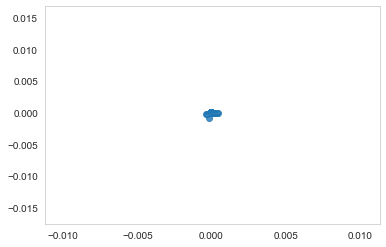



Noncarrier
XZFQGW: r2 = 0.421
DIAN EYO: -8.68
Mean Cortical SUVR: 1.08
Mean ref rate of change for probs: 2.0751925583939288e-05
Mean post-cing ref rate of change: 0.00021928884408574156
Noncarrier


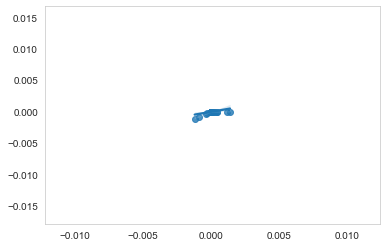



Mutation Carrier
Y8P7AO: r2 = 0.493
DIAN EYO: 0.96
Mean Cortical SUVR: 2.37
Mean ref rate of change for probs: 0.06274879158126706
Mean post-cing ref rate of change: 0.04787916130807882
Mutation Carrier


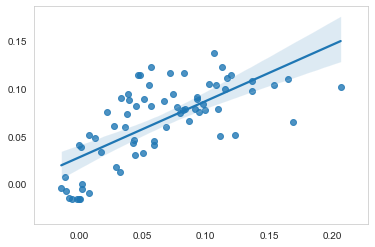



Mutation Carrier
YJECHL: r2 = 0.394
DIAN EYO: -5.36
Mean Cortical SUVR: 3.03
Mean ref rate of change for probs: 0.13517277726308116
Mean post-cing ref rate of change: 0.15431877042669223
Mutation Carrier


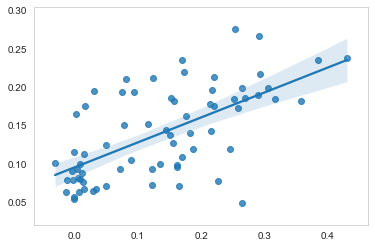



Noncarrier
ZUZQ9P: r2 = 0.153
DIAN EYO: -9.67
Mean Cortical SUVR: 1.07
Mean ref rate of change for probs: 0.0003592643258994772
Mean post-cing ref rate of change: 0.0015820927574170633
Noncarrier


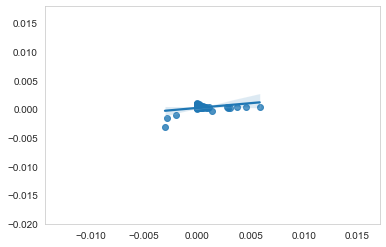



Noncarrier
ZVIB5B: r2 = 1.0
DIAN EYO: 23.09
Mean Cortical SUVR: nan
Mean ref rate of change for probs: -0.0029209733135712444
Mean post-cing ref rate of change: -0.0016302446406576024
Noncarrier


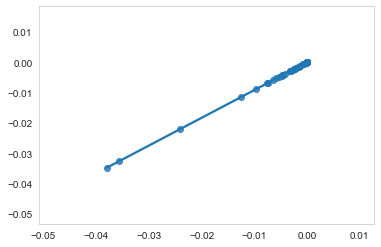



Mutation Carrier
7WX8KG: r2 = 0.18
DIAN EYO: -19.54
Mean Cortical SUVR: 1.28
Mean ref rate of change for probs: 0.0026229314289803757
Mean post-cing ref rate of change: 0.0001846690740699494
Mutation Carrier


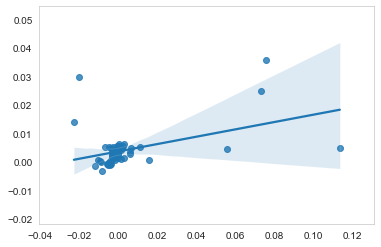



Mutation Carrier
89MLR7: r2 = 1.0
DIAN EYO: -22.38
Mean Cortical SUVR: 0.98
Mean ref rate of change for probs: -0.0002093461365843526
Mean post-cing ref rate of change: -0.0014794461092599363
Mutation Carrier


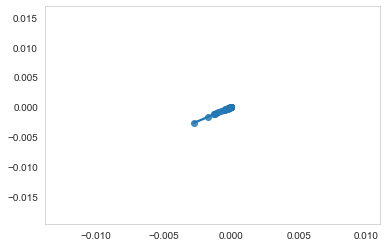



Noncarrier
IB8Z6S: r2 = 0.713
DIAN EYO: 3.36
Mean Cortical SUVR: 0.96
Mean ref rate of change for probs: -4.2878584577757686e-05
Mean post-cing ref rate of change: 0.00010136776004396842
Noncarrier


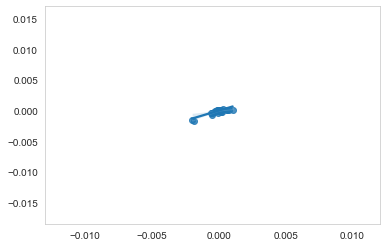



Mutation Carrier
N16QVF: r2 = 0.0
DIAN EYO: -27.08
Mean Cortical SUVR: 1.07
Mean ref rate of change for probs: 0.0006314953842666824
Mean post-cing ref rate of change: 0.00038072085894731223
Mutation Carrier


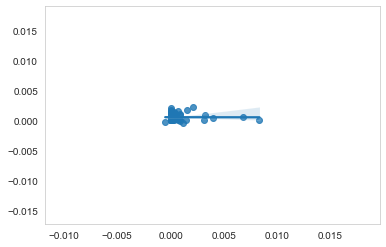



Noncarrier
OBL8WX: r2 = 0.703
DIAN EYO: -14.04
Mean Cortical SUVR: 1.13
Mean ref rate of change for probs: -0.000556698111250959
Mean post-cing ref rate of change: -0.0017163852121221514
Noncarrier


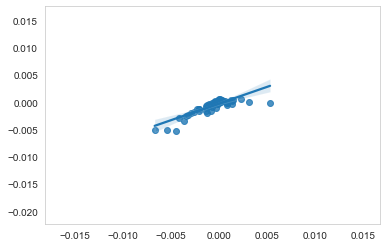



Noncarrier
10H57G: r2 = 0.973
DIAN EYO: -13.0
Mean Cortical SUVR: 0.87
Mean ref rate of change for probs: -0.00027691548455777815
Mean post-cing ref rate of change: -0.00019124772448879564
Noncarrier


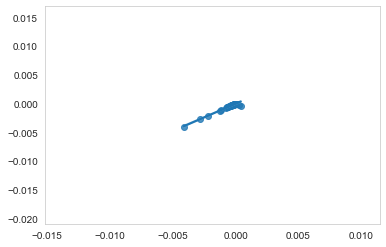



Mutation Carrier
5A2RSX: r2 = 1.0
DIAN EYO: -6.69
Mean Cortical SUVR: 1.18
Mean ref rate of change for probs: -0.00021006863270724252
Mean post-cing ref rate of change: -0.00011521024025482666
Mutation Carrier


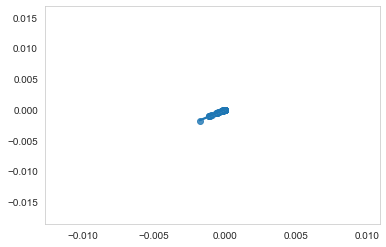



Mutation Carrier
BPN5U8: r2 = 1.0
DIAN EYO: -23.36
Mean Cortical SUVR: 1.06
Mean ref rate of change for probs: -1.1093783604302784e-05
Mean post-cing ref rate of change: 0.0
Mutation Carrier


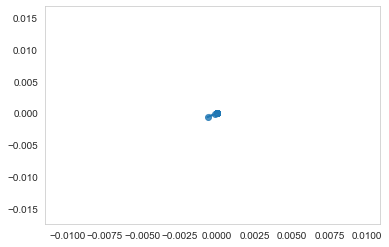



Mutation Carrier
G88LMH: r2 = 1.0
DIAN EYO: -13.46
Mean Cortical SUVR: 1.17
Mean ref rate of change for probs: -0.00011706474762715711
Mean post-cing ref rate of change: -0.0003039100829220541
Mutation Carrier


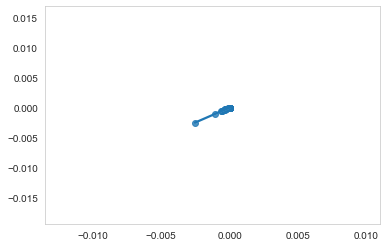



Noncarrier
KZFLJU: r2 = nan
DIAN EYO: 10.88
Mean Cortical SUVR: 0.98
Mean ref rate of change for probs: 0.0
Mean post-cing ref rate of change: 0.0
Noncarrier


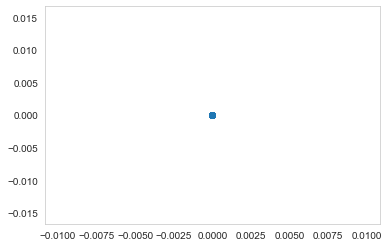



Noncarrier
WJI89Q: r2 = nan
DIAN EYO: -19.56
Mean Cortical SUVR: 1.08
Mean ref rate of change for probs: 0.0
Mean post-cing ref rate of change: 0.0
Noncarrier


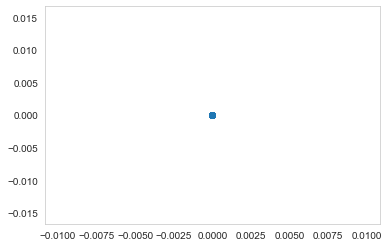

In [130]:
subs_final_dian_eyo = []
subs_dian_eyo_t1 = []
subs_final_t1_t2_age_diff = []
subs_final_t1_t2_normalized_diff_r2 = []
subs_final_t2_mean_cortical_suvr = []
subs_final_t1_t2_mean_rate_change = []
subs_final_t1_t2_postcing_rate_change = []
subs_final_t1_t2_cdr = []
subs_final_apoe = []
subs_final_gender = []
subs_final_education = [] 
subs_final_mutation = []
mutcarrier_idx = []
for i in range(0, len(model_output_t1_t2.index)):
    sub = model_output_t1_t2.index[i] 
    visit_label = dian_pup_voxelwise_ecdf_second_timepoint.loc[sub, 'visit']
    visit_label_t1 = dian_pup_voxelwise_ecdf_first_timepoint.loc[sub, 'visit']
    dian_eyo = round(clinical_df[(clinical_df.IMAGID == sub) & (clinical_df.visit == visit_label)].DIAN_EYO.values[0],2)
    dian_eyo_t1 = round(clinical_df[(clinical_df.IMAGID == sub) & (clinical_df.visit == visit_label_t1)].DIAN_EYO.values[0],2)
    subs_dian_eyo_t1.append(dian_eyo_t1)
    subs_final_dian_eyo.append(dian_eyo)
    mean_cortical_suvr = round(pib_df[(pib_df.IMAGID == sub) & (pib_df.visit == visit_label)].PIB_fSUVR_rsf_TOT_CORTMEAN.values[0],2)
    subs_final_t2_mean_cortical_suvr.append(mean_cortical_suvr)
    age_diff_t1_t2 = round(dian_pup_voxelwise_ecdf_second_timepoint.loc[sub, 'VISITAGEc'] - dian_pup_voxelwise_ecdf_first_timepoint.loc[sub, 'VISITAGEc'],3)
    subs_final_t1_t2_age_diff.append(age_diff_t1_t2)
    cdr = clinical_df[(clinical_df.IMAGID == sub) & (clinical_df.visit == visit_label)].cdrglob.values[0]
    subs_final_t1_t2_cdr.append(cdr)
    apoe = genetic_df[(genetic_df.IMAGID == sub) & (genetic_df.visit == visit_label)].apoe.values[0]
    mutcarrier = genetic_df[(genetic_df.IMAGID == sub) & (genetic_df.visit == visit_label)].Mutation.values[0]
    subs_final_mutation.append(mutcarrier)
    subs_final_apoe.append(apoe)
    ref_t1_sub = ref_t1[:,i]
    ref_t2_sub = ref_t2[:,i]
    pred_t2_sub = pred_t2[:,i]
    diff_ref_normalized = (ref_t2_sub - ref_t1_sub) / age_diff_t1_t2
    mean_rate_change = np.mean(diff_ref_normalized)
    ref_postcing_t1_sub = (ref_t1[20,i]+ref_t1[56,i])/2
    ref_postcing_t2_sub = (ref_t2[20,i]+ref_t2[56,i])/2
    pred_postcing_t2_sub = (pred_t2[20,i]+pred_t2[56,i])/2
    diff_ref_postcing_normalized = (ref_postcing_t2_sub - ref_postcing_t1_sub) / age_diff_t1_t2
    postcing_rate_change = diff_ref_postcing_normalized
    subs_final_t1_t2_postcing_rate_change.append(postcing_rate_change)
    if mutcarrier == 1: 
        print("Mutation Carrier")
        mutcarrier_idx.append(i)
    else: 
        print("Noncarrier")
    subs_final_t1_t2_mean_rate_change.append(mean_rate_change)
    diff_pred_normalized = (pred_t2_sub - ref_t1_sub) / age_diff_t1_t2
    r,p = stats.pearsonr(diff_ref_normalized, diff_pred_normalized)
    r2 = round(r ** 2,3)
    subs_final_t1_t2_normalized_diff_r2.append(r2)
    print(sub + ": r2 = " + str(r2))
    print("DIAN EYO: " + str(dian_eyo))
    print("Mean Cortical SUVR: " + str(mean_cortical_suvr))
    print("Mean ref rate of change for probs: " + str(mean_rate_change))
    print("Mean post-cing ref rate of change: " + str(postcing_rate_change))
    if mutcarrier == 1: 
        print("Mutation Carrier")
    else: 
        print("Noncarrier")
    sns.regplot(diff_ref_normalized, diff_pred_normalized)
    plt.show()
    print("\n")

In [131]:
mutcarriers_final_t1_t2_age_diff = []
for i in mutcarrier_idx: 
    mutcarriers_final_t1_t2_age_diff.append(subs_final_t1_t2_age_diff[i])

In [132]:
ref_t1_t2_rate_mutcarriers = ((ref_t2[:,mutcarrier_idx]-ref_t1[:,mutcarrier_idx]) / mutcarriers_final_t1_t2_age_diff)
pred_t1_t2_rate_mutcarriers = ((pred_t2[:,mutcarrier_idx]-ref_t1[:,mutcarrier_idx]) / mutcarriers_final_t1_t2_age_diff)

## get the mean, SD of rate of change r2 using orig SC matrix + null models

In [133]:
ref_t1_t2_rate_mutcarriers.shape

(70, 124)

In [134]:
mc_t1_t2_r2 = [] 
for i in range(0, ref_t1_t2_rate_mutcarriers.shape[1]):
    r,p = stats.pearsonr(ref_t1_t2_rate_mutcarriers[:,i],
                       pred_t1_t2_rate_mutcarriers[:,i])
    r2 = r**2 
    if str(r2) == 'nan':
        r2 = 0
    mc_t1_t2_r2.append(r2)

In [ ]:
np.mean(mc_t1_t2_r2)

In [ ]:
longi_t1_t2_rmse = [] 
for i in range(0, len(ref_t1_t2_rate_mutcarriers)):
    mse = mean_squared_error(ref_t1_t2_rate_mutcarriers[:,i], pred_t1_t2_rate_mutcarriers[:,i])
    rmse = np.sqrt(mse)
    longi_t1_t2_rmse.append(rmse)

In [ ]:
print("Longi RMSE\nMean: {0}\nSD: {1}".format(np.mean(longi_t1_t2_rmse), np.std(longi_t1_t2_rmse)))

In [ ]:
r,p= stats.pearsonr(ref_t1_t2_rate_mutcarriers.mean(1), pred_t1_t2_rate_mutcarriers.mean(1))
r2 = r ** 2
print(r2)

In [ ]:
rmse_t1_t2_range = []
for i,j in enumerate(mutcarrier_idx): 
    mse = mean_squared_error(((ref_t2[:,j]-ref_t1[:,j]) / mutcarriers_final_t1_t2_age_diff[i]),  
                             ((pred_t2[:,j]-ref_t1[:,j]) / mutcarriers_final_t1_t2_age_diff[i]))
    rmse = np.sqrt(mse) 
    rmse_t1_t2_range.append(rmse)

In [ ]:
sns.distplot(rmse_t1_t2_range, kde=False)

In [ ]:
np.median(rmse_t1_t2_range)

In [ ]:
ref_t1_t2_rate_mutcarriers_all_regions = ((ref_t2[:,mutcarrier_idx]-ref_t1[:,mutcarrier_idx]) / mutcarriers_final_t1_t2_age_diff)
pred_t1_t2_rate_mutcarriers_all_regions = ((pred_t2[:,mutcarrier_idx]-ref_t1[:,mutcarrier_idx]) / mutcarriers_final_t1_t2_age_diff)

In [ ]:
for i in range(0, len(mutcarriers_final_t1_t2_age_diff)):
    ref_t1_t2_rate_mutcarriers_all_regions[:, i] = (ref_t2[:,i] - ref_t1[:,i]) / mutcarriers_final_t1_t2_age_diff[i]
    
for i in range(0, len(mutcarriers_final_t1_t2_age_diff)):
    pred_t1_t2_rate_mutcarriers_all_regions[:, i] = (pred_t2[:,i] - ref_t1[:,i]) / mutcarriers_final_t1_t2_age_diff[i]
    

In [ ]:
ref_t1_t2_rate_mutcarriers_all_regions.shape

In [ ]:
ref_t1_t2_rate_mutcarriers_df = pd.DataFrame(index=list(dian_pup_voxelwise_ecdf_second_timepoint[dian_pup_voxelwise_ecdf_second_timepoint.Mutation == 1].index),
                                             columns=roi_cols)
pred_t1_t2_rate_mutcarriers_df = pd.DataFrame(index=list(dian_pup_voxelwise_ecdf_second_timepoint[dian_pup_voxelwise_ecdf_second_timepoint.Mutation == 1].index),
                                              columns=roi_cols)

In [ ]:
for i, sub in enumerate(ref_t1_t2_rate_mutcarriers_df.index): 
    ref_t1_t2_rate_mutcarriers_df.loc[sub, roi_cols_to_keep] = ref_t1_t2_rate_mutcarriers_all_regions[:, i]
    pred_t1_t2_rate_mutcarriers_df.loc[sub, roi_cols_to_keep] = pred_t1_t2_rate_mutcarriers_all_regions[:, i]
    ref_t1_t2_rate_mutcarriers_df.loc[sub, roi_cols_to_exclude] = 0 
    pred_t1_t2_rate_mutcarriers_df.loc[sub, roi_cols_to_exclude] = 0

In [ ]:
ref_t1_t2_rate_mutcarriers_df.loc[:, 'DIAN_EYO'] = dian_pup_voxelwise_ecdf_second_timepoint.loc[:, 'DIAN_EYO'] 
pred_t1_t2_rate_mutcarriers_df.loc[:, 'DIAN_EYO'] = dian_pup_voxelwise_ecdf_second_timepoint.loc[:, 'DIAN_EYO']

In [ ]:
ref_t1_t2_rate_mutcarriers_df.to_csv("../../data/DIAN/ref_t1_t2_rate_mutcarriers_df.csv")
pred_t1_t2_rate_mutcarriers_df.to_csv("../../data/DIAN/pred_t1_t2_rate_mutcarriers_df.csv")

In [ ]:
len(roi_cols)

In [ ]:
threshold = 0.1
age_ranges = [[-20,-15], [-15, -10], [-10, -5], [-5,0], [0,5], [5,10], [10,15]] 
for ar in age_ranges:  
    curr_ref_rate_probs = np.zeros_like(dkt_data)
    curr_pred_rate_probs = np.zeros_like(dkt_data)
    for i in range(0, len(roi_cols)): 
        curr_ref_rate_probs[dkt_data==(i+1)] = np.mean(ref_t1_t2_rate_mutcarriers_df[(ref_t1_t2_rate_mutcarriers_df.DIAN_EYO > ar[0]) & (ref_t1_t2_rate_mutcarriers_df.DIAN_EYO < ar[1])][roi_cols[i]])
        curr_pred_rate_probs[dkt_data==(i+1)] = np.mean(pred_t1_t2_rate_mutcarriers_df[(pred_t1_t2_rate_mutcarriers_df.DIAN_EYO > ar[0]) & (pred_t1_t2_rate_mutcarriers_df.DIAN_EYO < ar[1])][roi_cols[i]])
    curr_ref_rate_probs_img = nib.Nifti1Image(curr_ref_rate_probs, affine=dkt_atlas.affine, header=dkt_atlas.header)
    curr_pred_rate_probs_img = nib.Nifti1Image(curr_pred_rate_probs, affine=dkt_atlas.affine, header=dkt_atlas.header)
    fig = plt.figure(figsize=(20,5))
    ax1 = plt.subplot(121)
    plotting.plot_stat_map(curr_ref_rate_probs_img, draw_cross=False, vmax=0.1, cut_coords=[-2, 2, 24], axes=ax1)
    plt.title("EYO: {0} to {1}".format(str(ar[0]), str(ar[1])), fontsize=24)
    ax2 = plt.subplot(122)
    plotting.plot_stat_map(curr_pred_rate_probs_img, draw_cross=False, vmax=0.1, cut_coords=[-2, 2, 24], axes=ax2)
    plt.show()

In [ ]:
plt.figure(figsize=(10, 10))
g = sns.regplot(ref_t1_t2_rate_mutcarriers_all_regions.mean(1), 
                pred_t1_t2_rate_mutcarriers_all_regions.mean(1), 
                color="#700026",
                scatter_kws={'s': 100})
r,p = stats.pearsonr(ref_t1_t2_rate_mutcarriers_all_regions.mean(1), 
                     pred_t1_t2_rate_mutcarriers_all_regions.mean(1))
r2 = r**2
print(r2)
plt.xlabel("Observed", fontsize=24)
plt.ylabel("Predicted", fontsize=24)
plt.title('Regional Rate of Change in Amyloid Beta\n For Mutation Carriers Between Timepoints 1 & 2', fontsize=24)
#plt.title("Observed vs Predicted Rate of Change Across All Regions for Mutation Carriers", fontsize=36)
plt.text(x=-0.013, y=0.022, s="r2: " + str(np.round(r2, 3)), fontsize=24)
g.tick_params(labelsize=20)
plt.savefig("model_performance_global_t1_t2_mutcarriers.jpg")
#for idx in range(0,len(roi_cols_to_keep)):
#    g.text(ref_t1_t2_rate[idx], pred_t1_t2_rate[idx], roi_cols_to_keep[idx],
#            horizontalalignment='left',size='medium',color='black',weight='semibold')

In [143]:
plt.figure(figsize=(10, 10))
g = sns.regplot(((ref_t2-ref_t1)/subs_final_t1_t2_age_diff).mean(1), 
                ((pred_t2-ref_t1)/subs_final_t1_t2_age_diff).mean(1), 
                color="#700026",
                scatter_kws={'s': 100})
r,p = stats.pearsonr(((ref_t2-ref_t1)/subs_final_t1_t2_age_diff).mean(1), ((pred_t2-ref_t1)/subs_final_t1_t2_age_diff).mean(1))
r2 = r**2
print(r2)
plt.xlabel("Observed", fontsize=24)
plt.ylabel("Predicted", fontsize=24)
plt.title('Regional Rate of Change in Amyloid Beta\n For All Subjects Between Timepoints 1 & 2', fontsize=24)
#plt.title("Observed vs Predicted Rate of Change Across All Regions for Mutation Carriers", fontsize=36)
plt.text(x=-0.012, y=0.02, s="r2: " + str(np.round(r2, 3)), fontsize=24)
g.tick_params(labelsize=20)
plt.savefig("model_performance_global_t1_t2_allsubs.jpg")
#for idx in range(0,len(roi_cols_to_keep)):
#    g.text(ref_t1_t2_rate[idx], pred_t1_t2_rate[idx], roi_cols_to_keep[idx],
#            horizontalalignment='left',size='medium',color='black',weight='semibold')

NameError: name 'plt' is not defined

In [ ]:
sns.set_style("whitegrid", {'axes.grid' : False})
fig, ax = plt.subplots(2, 3, sharex=True, sharey=True, figsize=(25,15))
i = 0 
j = 0 
x = 0
roi_names = ["L CAC", "L PC", "L Precuneus", "L Parahippocampal", "L Lingual Gyrus", "L Amygdala"]
for idx in [0, 20, 22, 13, 10, 32]:
    roi = roi_cols_to_keep[idx] 
    ref_t1_t2_roi_rate = ((pred_t2[idx,mutcarrier_idx]-ref_t1[idx,mutcarrier_idx])
                          / mutcarriers_final_t1_t2_age_diff)
    pred_t1_t2_roi_rate = ((ref_t2[idx,mutcarrier_idx]-ref_t1[idx,mutcarrier_idx]) 
                           / mutcarriers_final_t1_t2_age_diff)
    plt.figure(figsize=(20,20))
    g = sns.regplot(ref_t1_t2_roi_rate, 
                    pred_t1_t2_roi_rate, 
                    color="#004C99",
                    scatter_kws={'s': 100},
                    ax=ax[i][j])
    g.tick_params(labelsize=40)
    g.set(ylim=(-0.4, 0.4))
    g.set(xlim=(-0.4, 0.4))
    r,p = stats.pearsonr(ref_t1_t2_roi_rate, pred_t1_t2_roi_rate)
    r2 = r**2
    curr_ax = ax[i][j] 
    curr_ax.set_title(roi_names[x], fontsize=48)
    curr_ax.text(x=-0.35, y=0.3, s="r2: " + str(np.round(r2, 3)), fontsize=40)
    if j == 2: 
        j = 0 
        i = 1
    else: 
        j += 1
    x += 1
fig.text(0.5, 0, 'Observed Subject Rate of Change', ha='center', va='center', fontsize=60)
fig.text(0.025, 0.5, 'Predicted Subject Rate of Change', ha='center', va='center', rotation='vertical', fontsize=60)
#ax.set_xlabel('Observed Regional Rate of Change')
#ax.set_ylabel('Predicted Regional Rate of Change')
fig.savefig("regional_performance_t1_t2_mutcarriers.jpg")

In [ ]:
model_output_t1_t2[model_output_t1_t2.T1_T2_CortROIMean_Diff_Per_Year > 0.07]

In [ ]:
sns.set_style("whitegrid", {'axes.grid' : False})
fig, ax = plt.subplots(2, 3, sharex=True, sharey=True, figsize=(25,15))
i = 0 
j = 0 
x = 0
for a in [15,30,60,62,63,83]:
    #idx = mutcarrier_idx[a]    
    sub = all_subs_2nd_timepoint[a]           
    dian_eyo = subs_t1_dian_eyo[a]
    ref_t1_t2_sub_rate = ((pred_t2[:,a]-ref_t1[:,a])
                          / subs_final_t1_t2_age_diff[a])
    pred_t1_t2_sub_rate = ((ref_t2[:,a]-ref_t1[:,a]) 
                           / subs_final_t1_t2_age_diff[a])
    plt.figure(figsize=(20,20))
    g = sns.regplot(ref_t1_t2_sub_rate, 
                    pred_t1_t2_sub_rate, 
                    color="#700026",
                    scatter_kws={'s': 100},
                    ax=ax[i][j],
                    )
    g.axvline(x=0.0, color="grey")
    g.tick_params(labelsize=40)
    r,p = stats.pearsonr(ref_t1_t2_sub_rate, pred_t1_t2_sub_rate)
    r2 = np.round(r**2,2)
    g.set(ylim=(-0.3, 0.3))
    g.set(xlim=(-0.3, 0.3))
    curr_ax = ax[i][j] 
    curr_ax.set_title("sub {0}".format(str(x)), fontsize=48)
    curr_ax.text(x=-0.25, y = 0.2, s="r2: {0}".format(str(r2)), fontsize=32)
    #curr_ax.text(x=x, y=y, s="r2: " + str(np.round(r2, 3)), fontsize=24)
    
    if j == 2: 
        j = 0 
        i = 1
    else: 
        j += 1
    x += 1
    
    #if j != 2: 
    #    j += 1
    #else:
    #    i += 1 
    #    j = 0
    #x += 1
        
fig.text(0.5, 0.04, 'Observed Regional Rate of Change', ha='center', va='center', fontsize=60)
fig.text(0.02, 0.5, 'Predicted Regional \nRate of Change', ha='center', va='center', rotation='vertical', fontsize=60)

In [ ]:
sns.set_style("whitegrid", {'axes.grid' : False})
fig, ax = plt.subplots(3, 3, sharex=True, sharey=True, figsize=(20,20))
i = 0 
j = 0 
x = 0
for a in [4, 15, 83,13,14,22, 16, 90, 96]:
    #idx = mutcarrier_idx[a]    
    sub = all_subs_2nd_timepoint[a]           
    #dian_eyo = subs_t1_dian_eyo[a]
    ref_t1_t2_sub_rate = ((pred_t2[:,a]-ref_t1[:,a])
                          / subs_final_t1_t2_age_diff[a])
    pred_t1_t2_sub_rate = ((ref_t2[:,a]-ref_t1[:,a]) 
                           / subs_final_t1_t2_age_diff[a])
    plt.figure(figsize=(20,20))
    g = sns.regplot(ref_t1_t2_sub_rate, 
                    pred_t1_t2_sub_rate, 
                    color="#700026",
                    scatter_kws={'s': 100},
                    ax=ax[i][j],
                    )
    g.axvline(x=0.0, color="grey")
    g.tick_params(labelsize=40)
    r,p = stats.pearsonr(ref_t1_t2_sub_rate, pred_t1_t2_sub_rate)
    r2 = np.round(r**2,2)
    g.set(ylim=(-0.3, 0.3))
    g.set(xlim=(-0.3, 0.3))
    curr_ax = ax[i][j] 
    curr_ax.set_title("sub {0}".format(str(x)), fontsize=48)
    curr_ax.text(x=-0.25, y = 0.2, s="r2: {0}".format(str(r2)), fontsize=32)
    #curr_ax.text(x=x, y=y, s="r2: " + str(np.round(r2, 3)), fontsize=24)
    if j != 2: 
        j += 1
    else:
        i += 1 
        j = 0
    x += 1
        
fig.text(0.5, 0.04, 'Observed Regional Rate of Change', ha='center', va='center', fontsize=60)
fig.text(0.02, 0.5, 'Predicted Regional Rate of Change', ha='center', va='center', rotation='vertical', fontsize=60)

In [ ]:
roi_avg_t1_ab_vals = []
roi_r2_t1_t2 = []
for i, roi in enumerate(roi_cols_to_keep):
    avg_val = np.mean(ref_t1[i, mutcarrier_idx])
    #print(roi, avg_val)
    ref_t1_t2_roi_rate = ((pred_t2[i,mutcarrier_idx]-ref_t1[i,mutcarrier_idx])
                          / mutcarriers_final_t1_t2_age_diff)
    pred_t1_t2_roi_rate = ((ref_t2[i,mutcarrier_idx]-ref_t1[i,mutcarrier_idx]) 
                           / mutcarriers_final_t1_t2_age_diff)
    r,p = stats.pearsonr(ref_t1_t2_roi_rate, pred_t1_t2_roi_rate)
    r2 = r ** 2
    roi_avg_t1_ab_vals.append(avg_val)
    roi_r2_t1_t2.append(r2)

In [ ]:
sns.scatterplot(roi_avg_t1_ab_vals, roi_r2_t1_t2, s=80)
plt.xlabel("Average Cortical AB Deposition at T1", fontsize=20)
plt.ylabel("Rate of Change R2", fontsize=20)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

In [ ]:
subs_rate_pcs_dict = {}
for i in range(0, rate_pcs_arr.shape[0]):
    sub = all_subs_2nd_timepoint[i]
    rate_r2 = esm_longi_t1_t2_brainstem_res['model_output'].loc[sub, 'model_r2']
    rc_r2 = subs_final_t1_t2_normalized_diff_r2[i]
    #print(sub + ", pattern r2: " + str(pattern_r2))
    #print(sub + ", rate of change r2: " + str(rc_r2))
    #sns.heatmap(pattern_pcs_arr[i])
    subs_rate_pcs_dict[sub] = rate_pcs_arr[i]
    #plt.show()

In [ ]:
subs_pattern_pcs_dict = {}
for i in range(0, pattern_pcs_arr.shape[0]):
    sub = all_subs_2nd_timepoint[i]
    pattern_r2 = esm_longi_t1_t2_brainstem_res['model_output'].loc[sub, 'model_r2']
    rc_r2 = subs_final_t1_t2_normalized_diff_r2[i]
    #print(sub + ", pattern r2: " + str(pattern_r2))
    #print(sub + ", rate of change r2: " + str(rc_r2))
    #sns.heatmap(pattern_pcs_arr[i])
    subs_pattern_pcs_dict[sub] = pattern_pcs_arr[i]
    #plt.show()

## Make spaghetti plot for change in AB prob vs EYO 

In [ ]:
dian_pup_voxelwise_ecdf_first_timepoint.head()

In [ ]:
from nilearn import datasets
from nilearn import plotting

In [ ]:
dkt_atlas = nib.load("../../data/atlases/DKT_filledin.nii.gz")
dkt_data = dkt_atlas.get_data()

In [ ]:
for i, roi in enumerate(roi_cols):
    if "Medial orbitofrontal" in roi or "Posterior cingulate" in roi or "Precuneus" in roi: 
        print(i, roi)

In [ ]:
sub_t1_dkt = np.zeros_like(dkt_data)
for i in range(0, len(roi_cols)): 
    sub_t1_dkt[dkt_data==(i+1)] = dian_pup_voxelwise_ecdf_first_timepoint.loc["KG4W9Z",roi_cols[i]]
sub_t1_dkt_img = nib.Nifti1Image(sub_t1_dkt, affine=dkt_atlas.affine, header=dkt_atlas.header)

sub_t2_dkt = np.zeros_like(dkt_data)
for i in range(0, len(roi_cols)): 
    sub_t2_dkt[dkt_data==(i+1)] = dian_pup_voxelwise_ecdf_second_timepoint.loc["KG4W9Z",roi_cols[i]]
sub_t2_dkt_img = nib.Nifti1Image(sub_t2_dkt, affine=dkt_atlas.affine, header=dkt_atlas.header)

sub_t3_dkt = np.zeros_like(dkt_data)
for i in range(0, len(roi_cols)): 
    sub_t3_dkt[dkt_data==(i+1)] = dian_pup_voxelwise_ecdf_third_timepoint.loc["KG4W9Z",roi_cols[i]]
sub_t3_dkt_img = nib.Nifti1Image(sub_t3_dkt, affine=dkt_atlas.affine, header=dkt_atlas.header)

sub_diff_t1_t2_dkt = np.zeros_like(dkt_data)
diff_age_t1_t2 = dian_pup_voxelwise_ecdf_second_timepoint.loc["KG4W9Z",'VISITAGEc'] - dian_pup_voxelwise_ecdf_first_timepoint.loc["KG4W9Z",'VISITAGEc']
for i in range(0, len(roi_cols)): 
    sub_diff_t1_t2_dkt[dkt_data==(i+1)] = (dian_pup_voxelwise_ecdf_second_timepoint.loc["KG4W9Z",roi_cols[i]]-dian_pup_voxelwise_ecdf_first_timepoint.loc["KG4W9Z",roi_cols[i]])/diff_age_t1_t2
sub_diff_t1_t2_dkt_img = nib.Nifti1Image(sub_diff_t1_t2_dkt, affine=dkt_atlas.affine, header=dkt_atlas.header)

sub_diff_t2_t3_dkt = np.zeros_like(dkt_data)
diff_age_t2_t3 = dian_pup_voxelwise_ecdf_third_timepoint.loc["KG4W9Z",'VISITAGEc'] - dian_pup_voxelwise_ecdf_second_timepoint.loc["KG4W9Z",'VISITAGEc']
for i in range(0, len(roi_cols)): 
    sub_diff_t2_t3_dkt[dkt_data==(i+1)] = (dian_pup_voxelwise_ecdf_third_timepoint.loc["KG4W9Z",roi_cols[i]]-dian_pup_voxelwise_ecdf_second_timepoint.loc["KG4W9Z",roi_cols[i]])/diff_age_t2_t3
sub_diff_t2_t3_dkt_img = nib.Nifti1Image(sub_diff_t2_t3_dkt, affine=dkt_atlas.affine, header=dkt_atlas.header)

sub_mattsson_seed_dkt = np.zeros_like(dkt_data) 
for i in [11,20,22,50,59,61]: 
    sub_mattsson_seed_dkt[dkt_data==(i+1)] = 0.1 
sub_mattsson_seed_dkt_img = nib.Nifti1Image(sub_mattsson_seed_dkt, affine=dkt_atlas.affine, header=dkt_atlas.header)

In [ ]:
plotting.view_img(sub_mattsson_seed_dkt_img)

In [ ]:
sns.reset_defaults()

In [ ]:
pup_cortical_analysis_col_idx

In [160]:
subs_final_dian_eyo = []
subs_dian_eyo_t1 = []
subs_final_t1_t2_age_diff = []
subs_final_t1_t2_normalized_diff_r2 = []
subs_final_t1_mean_cortical_suvr = []
subs_final_t2_mean_cortical_suvr = []
subs_final_t1_t2_mean_rate_change = []
subs_final_t1_t2_cortroi_mrc = []
subs_final_t1_t2_cortroi_mean = []
subs_final_t1_cortroi_mean = []
subs_final_t2_ref_cortroi_mean = []
subs_final_t2_pred_cortroi_mean = []
subs_final_t1_t2_cdr = []
subs_final_apoe = []
subs_final_gender = []
subs_final_education = [] 
subs_final_mutation = []
subs_final_esm_idx = []
mutcarrier_idx = []
for i in range(0, len(model_output_t1_t2.index)):
    sub = model_output_t1_t2.index[i] 
    visit_label = dian_pup_voxelwise_ecdf_second_timepoint.loc[sub, 'visit']
    visit_label_t1 = dian_pup_voxelwise_ecdf_first_timepoint.loc[sub, 'visit']
    dian_eyo = round(clinical_df[(clinical_df.IMAGID == sub) & (clinical_df.visit == visit_label)].DIAN_EYO.values[0],2)
    dian_eyo_t1 = round(clinical_df[(clinical_df.IMAGID == sub) & (clinical_df.visit == visit_label_t1)].DIAN_EYO.values[0],2)
    subs_dian_eyo_t1.append(dian_eyo_t1)
    subs_final_dian_eyo.append(dian_eyo)
    mean_cortical_suvr_t1 = round(pib_df[(pib_df.IMAGID == sub) & (pib_df.visit == visit_label_t1)].PIB_fSUVR_rsf_TOT_CORTMEAN.values[0],2)
    mean_cortical_suvr_t2 = round(pib_df[(pib_df.IMAGID == sub) & (pib_df.visit == visit_label)].PIB_fSUVR_rsf_TOT_CORTMEAN.values[0],2)
    subs_final_t1_mean_cortical_suvr.append(mean_cortical_suvr_t1)
    subs_final_t2_mean_cortical_suvr.append(mean_cortical_suvr_t2)
    age_diff_t1_t2 = round(dian_pup_voxelwise_ecdf_second_timepoint.loc[sub, 'VISITAGEc'] - dian_pup_voxelwise_ecdf_first_timepoint.loc[sub, 'VISITAGEc'],3)
    subs_final_t1_t2_age_diff.append(age_diff_t1_t2)
    cdr = clinical_df[(clinical_df.IMAGID == sub) & (clinical_df.visit == visit_label)].cdrglob.values[0]
    subs_final_t1_t2_cdr.append(cdr)
    apoe = genetic_df[(genetic_df.IMAGID == sub) & (genetic_df.visit == visit_label)].apoe.values[0]
    mutcarrier = genetic_df[(genetic_df.IMAGID == sub) & (genetic_df.visit == visit_label)].Mutation.values[0]
    subs_final_mutation.append(mutcarrier)
    subs_final_apoe.append(apoe)
    ref_t1_sub = ref_t1[:,i]
    ref_t2_sub = ref_t2[:,i]
    pred_t2_sub = pred_t2[:,i]
    diff_ref_normalized = (ref_t2_sub - ref_t1_sub) / age_diff_t1_t2
    mean_rate_change = np.mean(diff_ref_normalized)
    ref_pupcortroi_t1_sub = np.sum(ref_t1[pup_cortical_analysis_col_idx,:])/len(pup_cortical_analysis_col_idx)
    ref_pupcortroi_t2_sub = np.sum(ref_t2[pup_cortical_analysis_col_idx,:])/len(pup_cortical_analysis_col_idx)
    pred_pupcortroi_t2_sub = np.sum(pred_t2[pup_cortical_analysis_col_idx,:])/len(pup_cortical_analysis_col_idx)
    diff_ref_pupcortroi_normalized = (ref_pupcortroi_t2_sub - ref_pupcortroi_t1_sub) / age_diff_t1_t2
    pupcortroi_rate_change = diff_ref_pupcortroi_normalized
    subs_final_t1_t2_cortroi_mrc.append(pupcortroi_rate_change)
    subs_final_t1_cortroi_mean = ref_pupcortroi_t1_sub
    subs_final_t2_ref_cortroi_mean = ref_pupcortroi_t2_sub
    subs_final_t2_pred_cortroimean = pred_pupcortroi_t2_sub
    #if mutcarrier == 1: 
    #    print("Mutation Carrier")
    #    mutcarrier_idx.append(i)
    #else: 
    #    print("Noncarrier")
    subs_final_t1_t2_mean_rate_change.append(mean_rate_change)
    diff_pred_normalized = (pred_t2_sub - ref_t1_sub) / age_diff_t1_t2
    r,p = stats.pearsonr(diff_ref_normalized, diff_pred_normalized)
    r2 = round(r ** 2,3)
    subs_final_t1_t2_normalized_diff_r2.append(r2)
    subs_final_esm_idx.append(model_output_t1_t2.loc[sub, 'esm_idx'])
    #print(sub + ": r2 = " + str(r2))
    #print("DIAN EYO: " + str(dian_eyo))
    #print("Mean Cortical SUVR: " + str(mean_cortical_suvr))
    #print("Mean ref rate of change for probs: " + str(mean_rate_change))
    #print("Mean post-cing ref rate of change: " + str(postcing_rate_change))
    #if mutcarrier == 1: 
    #    print("Mutation Carrier")
    #else: 
    #    print("Nobncarrier")
    #sns.regplot(diff_ref_normalized, diff_pred_normalized)
    #plt.show()
    #print("\n")

NameError: name 'model_output_t1_t2' is not defined

In [ ]:
esm_longi_real_time_all_sub_df=pd.concat([pd.Series(subs_final_dian_eyo), 
                                          pd.Series(subs_final_t1_t2_mean_rate_change), 
                                          pd.Series(subs_final_t1_t2_cortroi_mrc),
                                          pd.Series(subs_final_t1_cortroi_mean),
                                          pd.Series(subs_final_t2_ref_cortroi_mean),
                                          pd.Series(subs_final_t2_pred_cortroi_mean),
                                          pd.Series(subs_final_t1_mean_cortical_suvr),
                                          pd.Series(subs_final_t2_mean_cortical_suvr), 
                                          pd.Series(subs_final_t1_t2_normalized_diff_r2),
                                          pd.Series(subs_final_t1_t2_cdr),
                                          pd.Series(subs_final_apoe),
                                          pd.Series(subs_final_mutation),
                                          pd.Series(esm_longi_t1_t2_brainstem_res_mat['BETAS0_est'].flatten()),
                                          pd.Series(esm_longi_t1_t2_brainstem_res_mat['DELTAS0_est'].flatten()),
                                          pd.Series(subs_final_t1_t2_age_diff),
                                          pd.Series(subs_final_esm_idx)],
                                          axis=1, 
                                          sort=False)

In [ ]:
betas0 = esm_longi_t1_t2_brainstem_res_mat['BETAS0']
deltas0 = esm_longi_t1_t2_brainstem_res_mat['DELTAS0']

In [ ]:
esm_longi_real_time_all_sub_df.index = all_subs_2nd_timepoint
esm_longi_real_time_all_sub_df.columns = ["DIAN_EYO", 
                                          "Mean_Rate_Change", 
                                          "Cortical_Regions_MRC",
                                          "T1_CortROIMean", 
                                          "T2_Ref_CortROIMean",
                                          "T2_Pred_CortROIMean",
                                          "Mean_Cortical_SUVR_T1",
                                          "Mean_Cortical_SUVR_T2" 
                                          "Normalized_Diff_R2_T1_T2", 
                                          "CDR",
                                          "APOE", 
                                          "Mutation", 
                                          "BETAS0_est",
                                          "DELTAS0_est", 
                                          "EYO_Diff",
                                          "ESM_idx"]

In [ ]:
for sub in esm_longi_real_time_all_sub_df.index: 
    esm_longi_real_time_all_sub_df.loc[sub, 'visit_t1'] = dian_pup_voxelwise_ecdf_first_timepoint.loc[sub, 'visit']
    esm_longi_real_time_all_sub_df.loc[sub, 'visit_t2'] = dian_pup_voxelwise_ecdf_second_timepoint.loc[sub, 'visit']

In [ ]:
sns.regplot(esm_longi_real_time_all_sub_df[esm_longi_real_time_all_sub_df.Mutation == 1].Mean_Cortical_SUVR_T1, esm_longi_real_time_all_sub_df[esm_longi_real_time_all_sub_df.Mutation == 1].Mean_Cortical_SUVR_Change)

In [ ]:
sns.regplot(esm_longi_real_time_all_sub_df.T1_CortROIMean, esm_longi_real_time_all_sub_df.T2_Pred_CortROIMean)

In [ ]:
betas0_est = (np.exp(-betas0)+betas0-1)/betas0
deltas0_est = (1-np.exp(-deltas0))/deltas0
bdr0_log = np.log(betas0_est/deltas0_est)

In [ ]:
esm_longi_real_time_all_sub_df['Beta_Delta_Ratio'] = esm_longi_t1_t2_brainstem_res_mat['BETAS_est']/esm_longi_t1_t2_brainstem_res_mat['DELTAS_est']
esm_longi_real_time_all_sub_df['BETAS_est'] = esm_longi_t1_t2_brainstem_res_mat['BETAS_est']
esm_longi_real_time_all_sub_df['DELTAS_est'] = esm_longi_t1_t2_brainstem_res_mat['DELTAS_est']
esm_longi_real_time_all_sub_df['Beta_Delta_Ratio_Log'] = np.log(esm_longi_real_time_all_sub_df['Beta_Delta_Ratio'])

In [ ]:
esm_longi_real_time_all_sub_df = esm_longi_real_time_all_sub_df.dropna()
esm_longi_real_time_all_sub_df = esm_longi_real_time_all_sub_df[esm_longi_real_time_all_sub_df.Mean_Rate_Change != 0.0]

In [ ]:
esm_longi_real_time_all_sub_df['Rate_R'] = np.sqrt(esm_longi_real_time_all_sub_df.Normalized_Diff_R2_T1_T2)

In [ ]:
for sub in esm_longi_real_time_all_sub_df.index: 
    esm_longi_real_time_all_sub_df.loc[sub, 'T1_Ref_MattssonEarlyAcc_Mean'] = model_output_t1_t2.loc[sub, 'T1_Ref_MattssonEarlyAcc_Mean']
    esm_longi_real_time_all_sub_df.loc[sub, 'T2_Ref_MattssonEarlyAcc_Mean'] = model_output_t1_t2.loc[sub, 'T2_Ref_MattssonEarlyAcc_Mean']

In [ ]:
sns.distplot(esm_longi_real_time_all_sub_df[esm_longi_real_time_all_sub_df.Mutation == 1].Normalized_Diff_R2_T1_T2, bins=10, kde=False)

In [ ]:
np.mean(esm_longi_real_time_all_sub_df[esm_longi_real_time_all_sub_df.Mutation==1].Normalized_Diff_R2_T1_T2)

In [ ]:
np.std(esm_longi_real_time_all_sub_df[esm_longi_real_time_all_sub_df.Mutation==1].Normalized_Diff_R2_T1_T2)

In [ ]:
esm_longi_real_time_all_sub_df.columns

In [ ]:
sns.scatterplot(x="Cortical_Regions_MRC",y="Normalized_Diff_R2_T1_T2", 
                data=esm_longi_real_time_all_sub_df[esm_longi_real_time_all_sub_df.Mutation == 1],
                s=70,
                color="#700026")
plt.xlabel("Cortical Regions Mean Rate Change", fontsize=18)
plt.xticks(fontsize=16,rotation=45)
plt.yticks(fontsize=16)
plt.ylabel("R2", fontsize=18)

In [ ]:
sns.distplot(esm_longi_real_time_all_sub_df[esm_longi_real_time_all_sub_df.Mutation == 1].Normalized_Diff_R2_T1_T2, bins=10)

In [ ]:
for sub in esm_longi_real_time_all_sub_df.index: 
    visit_t1 = esm_longi_real_time_all_sub_df.loc[sub, 'visit_t1']
    visit_t2 = esm_longi_real_time_all_sub_df.loc[sub, 'visit_t2']
    if sub in wmh_df.index: 
        visits = list(wmh_df[wmh_df.IMAGID == sub].visit.values)
        if visit_t1 in visits: 
            esm_longi_real_time_all_sub_df.loc[sub, 'wmh_volume_t1'] = wmh_df[(wmh_df.IMAGID == sub) & (wmh_df.visit == visit_t1)].volume.values[0]
        if visit_t2 in visits: 
            esm_longi_real_time_all_sub_df.loc[sub, 'wmh_volume_t2'] = wmh_df[(wmh_df.IMAGID == sub) & (wmh_df.visit == visit_t2)].volume.values[0]
    #model_output.loc[sub, 'wmh_volume'] = wmh_df[(wmh_df.IMAGID == sub) & (wmh_df.visit == visit)].volume.values[0]

In [ ]:
sns.boxplot(x="Mutation", y="wmh_volume_t1", data=esm_longi_real_time_all_sub_df)

## Guo: Compute pseudotemporal regional accumulation rate based on baseline cortical probs vs regional probs

In [ ]:
regional_aar = {} 
for roi in roi_cols_to_keep:
    subs = list(esm_longi_real_time_all_sub_df[(esm_longi_real_time_all_sub_df.Mutation == 1)].index)
    subs_roi_t1 = dian_pup_voxelwise_ecdf_first_timepoint.loc[subs, roi] 
    subs_roi_t2 = dian_pup_voxelwise_ecdf_second_timepoint.loc[subs, roi] 
    eyo_change = dian_pup_voxelwise_ecdf_second_timepoint.loc[subs, 'DIAN_EYO'] - dian_pup_voxelwise_ecdf_first_timepoint.loc[sub, 'DIAN_EYO']
    roi_aar = (subs_roi_t2 - subs_roi_t1) / eyo_change 
    regional_aar[roi] = np.mean(roi_aar)

In [ ]:
pseudotemporal_regional_slopes = {} 
for roi in roi_cols_to_keep:
    subs = list(esm_longi_real_time_all_sub_df[(esm_longi_real_time_all_sub_df.Mutation == 1)].index)
    reg = LinearRegression().fit(np.array(esm_longi_real_time_all_sub_df.loc[subs,'T1_CortROIMean']).reshape(-1,1), 
                             dian_pup_voxelwise_ecdf_first_timepoint.loc[subs, roi])
    slope = reg.coef_[0]
    pseudotemporal_regional_slopes[roi] = slope

In [ ]:
sns.regplot(list(pseudotemporal_regional_slopes.values()), list(regional_aar.values()), lowess=True)

In [ ]:
sns.distplot(esm_longi_real_time_all_sub_df[esm_longi_real_time_all_sub_df.Mutation == 0].Cortical_Regions_MRC, kde=False)
plt.title("Noncarriers Mean Rate of Change")

In [ ]:
mean_mrc_std_noncarriers = esm_longi_real_time_all_sub_df[esm_longi_real_time_all_sub_df.Mutation == 0].Mean_Rate_Change.std()
cortroi_mrc_std_nc = esm_longi_real_time_all_sub_df[esm_longi_real_time_all_sub_df.Mutation == 0].Cortical_Regions_MRC.std()

In [ ]:
mean_mrc_std_noncarriers

In [ ]:
2*mean_mrc_std_noncarriers

In [ ]:
2*cortroi_mrc_std_nc 

In [ ]:
for sub in esm_longi_real_time_all_sub_df.index: 
    if esm_longi_real_time_all_sub_df.loc[sub, 'Mean_Rate_Change'] > 2*cortroi_mrc_std_nc:
        esm_longi_real_time_all_sub_df.loc[sub, 'Accumulator'] = 1
        esm_longi_real_time_all_sub_df.loc[sub, 'Accumulator_Status'] = "Yes"
    else: 
        esm_longi_real_time_all_sub_df.loc[sub, 'Accumulator'] = 0
        esm_longi_real_time_all_sub_df.loc[sub, 'Accumulator_Status'] = "No"

In [ ]:
sns.distplot(esm_longi_real_time_all_sub_df[esm_longi_real_time_all_sub_df.Accumulator == 1].Mean_Rate_Change, kde=False)
sns.distplot(esm_longi_real_time_all_sub_df[esm_longi_real_time_all_sub_df.Accumulator == 0].Mean_Rate_Change, kde=False)
#plt.title("Mutation Carriers Mean Rate of Change")
plt.ylabel("Count")
plt.xlabel("All ROI Mean Rate of Change")

In [ ]:
len(esm_longi_real_time_all_sub_df[esm_longi_real_time_all_sub_df.Mutation == 1])

In [ ]:
len(esm_longi_real_time_all_sub_df[esm_longi_real_time_all_sub_df.Accumulator == 1])

In [ ]:
accumulator_t1_t2_idx = []
for sub in esm_longi_real_time_all_sub_df.index: 
    if esm_longi_real_time_all_sub_df.loc[sub, 'Accumulator'] == 1: 
        accumulator_t1_t2_idx.append(esm_longi_real_time_all_sub_df.loc[sub, 'ESM_idx'])

In [ ]:
from scipy import optimize

In [ ]:
acc_t1_t2_age_diff = [x for i,x in enumerate(subs_final_t1_t2_age_diff) if i in accumulator_t1_t2_idx]

In [ ]:
len(acc_t1_t2_age_diff)

In [ ]:
for sub in esm_longi_real_time_all_sub_df.index: 
    esm_longi_real_time_all_sub_df.loc[sub, 'wmh_vol_diff_t1_t2'] = esm_longi_real_time_all_sub_df.loc[sub, 'wmh_volume_t2'] - esm_longi_real_time_all_sub_df.loc[sub, 'wmh_volume_t1']
    esm_longi_real_time_all_sub_df.loc[sub, 'ab_prob_diff_t1_t2'] = esm_longi_real_time_all_sub_df.loc[sub, 'T2_Ref_CortROIMean'] - esm_longi_real_time_all_sub_df.loc[sub, 'T1_CortROIMean']

In [ ]:
sns.lmplot(x="DIAN_EYO", y="wmh_volume_t1", data=esm_longi_real_time_all_sub_df, hue="Mutation",lowess=True)
plt.xlabel("Estimated Years to Symptom Onset", fontsize=18)
plt.ylabel("WMH Volume", fontsize=18)

In [ ]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
esm_longi_real_time_all_sub_df['wmh_volume_t1_transform'] = np.arcsinh(esm_longi_real_time_all_sub_df.wmh_volume_t1)
esm_longi_real_time_all_sub_df['wmh_volume_t2_scaled'] = scaler.fit_transform(esm_longi_real_time_all_sub_df['wmh_volume_t2'].values.reshape(-1,1))
esm_longi_real_time_all_sub_df['wmh_volume_t1_scaled'] = scaler.fit_transform(esm_longi_real_time_all_sub_df['wmh_volume_t1'].values.reshape(-1,1))

In [ ]:
fig = plt.figure(figsize=(12, 5))
plt.subplot(121)
g = sns.regplot(x="DIAN_EYO", y="wmh_volume_t1_transform", data=esm_longi_real_time_all_sub_df[esm_longi_real_time_all_sub_df.Mutation == 1],lowess=True)
plt.xlabel("Estimated Years to Symptom Onset", fontsize=18)
plt.ylabel("Total WMH Volume", fontsize=18)

plt.subplot(122)
g = sns.regplot(x="DIAN_EYO", y="T1_CortROIMean", data=esm_longi_real_time_all_sub_df[esm_longi_real_time_all_sub_df.Mutation == 1],lowess=True)
plt.xlabel("Estimated Years to Symptom Onset", fontsize=18)
plt.ylabel("Cortical AB Mean", fontsize=18)



In [ ]:
sns.lmplot(x="DIAN_EYO", y="T1_CortROIMean", data=esm_longi_real_time_all_sub_df, hue="Mutation", lowess=True)
plt.xlabel("Estimated Years to Symptom Onset", fontsize=18)
plt.ylabel("AB Cortical ROI Avg", fontsize=18)

In [ ]:
sns.catplot(x="Mutation", y="wmh_volume_t1_scaled", data=esm_longi_real_time_all_sub_df, kind="box")

In [ ]:
esm_longi_real_time_all_sub_df.columns

In [ ]:
sns.lmplot(x="wmh_volume_t1_transform", y="T1_CortROIMean", data=esm_longi_real_time_all_sub_df, hue="Mutation")
plt.ylim([-0.5, 1.5])
r,p = stats.pearsonr(esm_longi_real_time_all_sub_df[esm_longi_real_time_all_sub_df.Mutation == 1].wmh_volume_t1_transform, 
                     esm_longi_real_time_all_sub_df[esm_longi_real_time_all_sub_df.Mutation == 1].T1_CortROIMean)
r2 = r ** 2
plt.ylabel("Cortical Amyloid Beta Mean")
plt.xlabel("WMH Total (inverse hyperbolic sine transform)")
plt.text(x=3, y=1.25, s="r: {0}\np: {1}".format(str(np.round(r, 3)), str(np.round(p, 3))), fontsize=14, color="orange")
#print("r: {0}, p: {1}".format(str(np.round(r, 3)), str(np.round(p, 3))))

In [ ]:
sns.lmplot(x="wmh_volume_t1", y="ab_prob_diff_t1_t2", data=esm_longi_real_time_all_sub_df[esm_longi_real_time_all_sub_df.Mutation == 1])

In [ ]:
sns.lmplot(x="wmh_volume_t1_transform", y="Beta_Delta_Ratio_Log", data=esm_longi_real_time_all_sub_df[esm_longi_real_time_all_sub_df.Mutation == 1], hue="Accumulator")
#plt.ylim([-0.5, 1.5])
r,p = stats.pearsonr(esm_longi_real_time_all_sub_df[esm_longi_real_time_all_sub_df.Mutation == 1].wmh_volume_t1_transform, 
                     esm_longi_real_time_all_sub_df[esm_longi_real_time_all_sub_df.Mutation == 1].Beta_Delta_Ratio_Log)
r2 = r ** 2
print("r2: {0}".format(str(r)))

In [ ]:
ref_t1_t2_rate_acc = ((ref_t2[:, accumulator_t1_t2_idx]-ref_t1[:, accumulator_t1_t2_idx]) / acc_t1_t2_age_diff)
pred_t1_t2_rate_acc = ((pred_t2[:, accumulator_t1_t2_idx]-ref_t1[:, accumulator_t1_t2_idx]) / acc_t1_t2_age_diff)

In [ ]:
plt.figure(figsize=(10, 10))
g = sns.regplot(ref_t1_t2_rate_acc.mean(1), 
                pred_t1_t2_rate_acc.mean(1), 
                color="#700026",
                scatter_kws={'s': 100})
r,p = stats.pearsonr(ref_t1_t2_rate_acc.mean(1), pred_t1_t2_rate_acc.mean(1))
r2 = r**2
plt.xlabel("Observed", fontsize=24)
plt.ylabel("Predicted", fontsize=24)
plt.title(r'Regional Rate of Change in A$\beta$ Deposition Between Timepoints 1 & 2', fontsize=24)
#plt.title("Observed vs Predicted Rate of Change Across All Regions for Mutation Carriers", fontsize=36)
plt.text(x=0.0, y=0.08, s="r2: " + str(np.round(r2, 3)), fontsize=24)
g.tick_params(labelsize=20)
plt.savefig("model_performance_global_t1_t2_acc.jpg")
#for idx in range(0,len(roi_cols_to_keep)):
#    g.text(ref_t1_t2_rate[idx], pred_t1_t2_rate[idx], roi_cols_to_keep[idx],
#            horizontalalignment='left',size='medium',color='black',weight='semibold')

In [ ]:
esm_longi_real_time_all_sub_df.columns

In [ ]:
sns.distplot(esm_longi_real_time_all_sub_df.Cortical_Regions_MRC, kde=False)
sns.distplot(esm_longi_real_time_all_sub_df.Mean_Rate_Change, kde=False)

In [ ]:
for sub in esm_longi_real_time_all_sub_df.index: 
    if esm_longi_real_time_all_sub_df.loc[sub, 'APOE'] == 23: 
        esm_longi_real_time_all_sub_df.loc[sub, 'APOE4'] = 0
    elif esm_longi_real_time_all_sub_df.loc[sub, 'APOE'] == 24: 
        esm_longi_real_time_all_sub_df.loc[sub, 'APOE4'] = 1
    elif esm_longi_real_time_all_sub_df.loc[sub, 'APOE'] == 33:
        esm_longi_real_time_all_sub_df.loc[sub, 'APOE4'] = 0
    elif esm_longi_real_time_all_sub_df.loc[sub, 'APOE'] == 34:
        esm_longi_real_time_all_sub_df.loc[sub, 'APOE4'] = 1    
    elif esm_longi_real_time_all_sub_df.loc[sub, 'APOE'] == 44:
        esm_longi_real_time_all_sub_df.loc[sub, 'APOE4'] = 2

In [211]:
sns.catplot(x="Mutation", y="Mean_Rate_Change",col="Accumulator",
            kind="violin", data=esm_longi_real_time_all_sub_df);

NameError: name 'sns' is not defined

In [ ]:
import statsmodels
import statsmodels.api as sm
from statsmodels.formula.api import ols

In [ ]:
for sub in esm_longi_real_time_all_sub_df.index: 
    visit = dian_pup_voxelwise_ecdf_second_timepoint.loc[sub, 'visit']
    esm_longi_real_time_all_sub_df.loc[sub, 'Age'] = clinical_df[(clinical_df.IMAGID == sub) & (clinical_df.visit == visit)].VISITAGEc.values[0]
    esm_longi_real_time_all_sub_df.loc[sub, 'Sex'] = genetic_df[(genetic_df.IMAGID == sub) & (genetic_df.visit == visit)].SEX.values[0]
    esm_longi_real_time_all_sub_df.loc[sub, 'Education'] = clinical_df[(clinical_df.IMAGID == sub) & (clinical_df.visit == visit)].EDUC.values[0]
    if (esm_longi_real_time_all_sub_df.loc[sub, 'APOE'] == 33) or (esm_longi_real_time_all_sub_df.loc[sub, 'APOE'] == 23):
        esm_longi_real_time_all_sub_df.loc[sub, 'APOE4'] = 0 
    elif (esm_longi_real_time_all_sub_df.loc[sub, 'APOE'] == 34) or (esm_longi_real_time_all_sub_df.loc[sub, 'APOE'] == 24):
        esm_longi_real_time_all_sub_df.loc[sub, 'APOE4'] = 1
    else: 
        esm_longi_real_time_all_sub_df.loc[sub, 'APOE4'] = 2

In [ ]:
for sub in esm_longi_real_time_all_sub_df.index: 
    if esm_longi_real_time_all_sub_df.loc[sub, 'CDR'] > 1: 
        esm_longi_real_time_all_sub_df.loc[sub, 'CDR_norm'] = 1 
    else: 
        esm_longi_real_time_all_sub_df.loc[sub, 'CDR_norm'] = esm_longi_real_time_all_sub_df.loc[sub, 'CDR']

In [ ]:
sns.distplot(esm_longi_real_time_all_sub_df[esm_longi_real_time_all_sub_df.Mutation == 1].CDR)

In [ ]:
import statsmodels.api as sm

In [ ]:
train = ["BETAS_est", "DELTAS_est"]
target = esm_longi_real_time_all_sub_df["CDR_norm"]

logit = sm.Logit(target, esm_longi_real_time_all_sub_df[train])

  # fit the model
result = logit.fit()

In [ ]:
bdr_no_eyo_formula = 'Beta_Delta_Ratio_Log ~ C(Accumulator) + C(Mutation) + C(APOE4) + C(Sex) + Education'
bdr_no_eyo_model = ols(bdr_no_eyo_formula, esm_longi_real_time_all_sub_df).fit()
bdr_no_eyo_aov_table = statsmodels.stats.anova.anova_lm(bdr_no_eyo_model, typ=2)
print(bdr_no_eyo_aov_table)

In [ ]:
format(0.00001, '.03e')

In [ ]:
delta_no_eyo_formula = 'DELTAS_est ~ C(Accumulator) + C(Mutation) + C(APOE4) + C(Sex) + Education'
delta_no_eyo_model = ols(delta_no_eyo_formula, esm_longi_real_time_all_sub_df).fit()
delta_no_eyo_aov_table = statsmodels.stats.anova.anova_lm(delta_no_eyo_model, typ=2)
print(delta_no_eyo_aov_table)

In [ ]:
esm_longi_real_time_all_sub_df[esm_longi_real_time_all_sub_df.Mutation == 1].shape

In [ ]:
beta_no_eyo_formula = 'BETAS_est ~ C(Accumulator) + C(Mutation) + C(APOE4) + C(Sex) + Education'
beta_no_eyo_model = ols(beta_no_eyo_formula, esm_longi_real_time_all_sub_df).fit()
beta_no_eyo_aov_table = statsmodels.stats.anova.anova_lm(beta_no_eyo_model, typ=2)
print(beta_no_eyo_aov_table)

In [ ]:
cortical_mrc_formula = 'T1_CortROIMean ~ BETAS_est + Age + C(APOE4) + C(Sex) + Education + DELTAS_est'
cortical_mrc_model = ols(cortical_mrc_formula, esm_longi_real_time_all_sub_df[esm_longi_real_time_all_sub_df.Mutation == 1]).fit()
cortical_mrc_aov_table = statsmodels.stats.anova.anova_lm(cortical_mrc_model, typ=2)
cortical_mrc_aov_table

In [ ]:
### build anova table 
anova_results = pd.DataFrame(index=["Accumulator Status", "Mutation Status", "APOE4", "Sex", "Education"], columns=["Deltas", "Betas", "Beta Delta Ratio"])

In [ ]:
bdr_no_eyo_aov_table.loc["C(Sex)", "sum_sq"]

In [ ]:
for i, tbl in enumerate([delta_no_eyo_aov_table, beta_no_eyo_aov_table, bdr_no_eyo_aov_table]):
    col = anova_results.columns[i]
    for j, x in enumerate(tbl[tbl.index != 'Residual'].index):
        row = anova_results.index[j]
        var_explained = np.round((tbl.loc[x, 'sum_sq'] / tbl.loc["Residual", "sum_sq"]) * 100, 2)
        p_value = tbl.loc[x, 'PR(>F)']
        var_sig = str(var_explained) + " (" + format(p_value, '.02e') + ")"
        anova_results.loc[row, col] = var_sig

In [ ]:
anova_results

In [ ]:
g = sns.catplot(x="Mutation", y="Normalized_Diff_R2_T1_T2",hue="Accumulator",
            kind="violin", data=esm_longi_real_time_all_sub_df);
g.set_axis_labels("", "R2 for Predicted Rate of Change", )
g.set_xticklabels(["Noncarrier", "Carrier"])  
g.fig.set_size_inches(20,15)

In [ ]:
x = "Mutation"
y = "BETAS_est"
#hue = "smoker"
ax = sns.boxplot(data=esm_longi_real_time_all_sub_df, x=x, y=y, hue="Accumulator")
add_stat_annotation(ax, data=esm_longi_real_time_all_sub_df, x=x, y=y,hue="Accumulator",
                    box_pairs=[((0.0, 0.0),(1.0, 0.0)), ((0.0, 0.0),(1.0, 1.0))],
                    test='t-test_ind', text_format='full', loc='inside', verbose=2)
plt.legend(loc='upper left', bbox_to_anchor=(1.03, 1))

In [ ]:
x = "Mutation"
y = "DELTAS_est"
#hue = "smoker"
plt.figure(figsize=(10,10))
g = sns.boxplot(data=esm_longi_real_time_all_sub_df, x=x, y=y, hue="Accumulator")
add_stat_annotation(g, data=esm_longi_real_time_all_sub_df, x=x, y=y,hue="Accumulator",
                    box_pairs=[((0.0, 0.0),(1.0, 0.0)), ((0.0, 0.0),(1.0, 1.0))],
                    test='t-test_ind', text_format='full', loc='inside', verbose=2)
plt.legend(loc='upper left', bbox_to_anchor=(1.03, 1))

In [ ]:
sns.scatterplot(x="T1_Ref_MattssonEarlyAcc_Mean", palette="magma", y="Cortical_Regions_MRC" ,data=esm_longi_real_time_all_sub_df[(esm_longi_real_time_all_sub_df.Mutation == 1)],hue="DIAN_EYO")

In [ ]:
sns.lmplot(x="Beta_Delta_Ratio_Log", y="Cortical_Regions_MRC", data=esm_longi_real_time_all_sub_df[esm_longi_real_time_all_sub_df.Mutation==1],hue="Accumulator")

In [ ]:
esm_longi_real_time_all_sub_df.columns

In [ ]:
sns.lmplot(x="T1_CortROIMean", y="Cortical_Regions_MRC", data=esm_longi_real_time_all_sub_df[(esm_longi_real_time_all_sub_df.Mutation==1)])

In [ ]:
sns.lmplot(x="Cortical_Regions_MRC", y="BETAS_est", data=esm_longi_real_time_all_sub_df[(esm_longi_real_time_all_sub_df.Mutation==1)])

In [ ]:
sns.set_style("whitegrid", {'axes.grid' : False})
yaxis_labels = ["Deltas (Clearance Parameter)", "Betas (Production Parameter)", "Beta Delta Ratio (Log)"]
titles = ["Clearance", "Production", "Production / Clearance"]
fig = plt.figure(figsize=(40,20))
for i, y in enumerate(["DELTAS_est", "BETAS_est", "Beta_Delta_Ratio_Log"]): 
    yaxis_label = yaxis_labels[i]
    pal = {"No": "mediumblue", "Yes": "red"}
    face_pal = {"No": "cornflowerblue", "Yes": "indianred"}
    x = "Mutation"
    y = y
    hue = "Accumulator_Status"
    plt.figure(figsize=(10,10))
    g = sns.boxplot(data=esm_longi_real_time_all_sub_df, x=x, y=y, 
                    hue=hue, palette=face_pal, fliersize=0)
    #g.set(xlabel='Mutation Status', ylabel='Beta Delta Ratio (Log)')
    sns.stripplot(x='Mutation', y=y, hue=hue, 
                  data=esm_longi_real_time_all_sub_df,
                  jitter=True, split=True, linewidth=0.5, palette=pal)
    g.set_xticklabels(["Noncarrier", "Carrier"], fontsize=18) 
    add_stat_annotation(g, data=esm_longi_real_time_all_sub_df, x=x, y=y,hue=hue,
                        box_pairs=[((0.0, 'No'),(1.0, 'No')), ((0.0, 'No'),(1.0, 'Yes')), ((1.0, 'No'),(1.0, 'Yes'))],
                        test='t-test_ind', text_format='star', loc='inside', verbose=2, 
                        fontsize=24)
    plt.xlabel("Mutation Status", fontsize=24)
    plt.ylabel(yaxis_label, fontsize=24)
    plt.rc('xtick',labelsize=24)
    plt.rc('ytick', labelsize=24)
    plt.title(titles[i], fontsize=24)
    #sns.distplot(cwm_mi4d, color="green", label="CWM")
    #sns.distplot(brainstem_mi4d, color="orange", label="Brainstem")
    #plt.legend(fontsize=30) 
    plt.legend(loc='upper right', bbox_to_anchor=(1.6, 1.2), title="Accumulator", fontsize=18)
    #L=plt.legend()
    #plt.legend(title="Accumulator Status")
    #L.get_texts()[0].set_text('No')
    #L.get_texts()[1].set_text('Yes')
   #L.get_texts()[2].set_text('No')
    #L.get_texts()[3].set_text('Yes')
    plt.show()
    plt.close()

In [ ]:
sns.set_style("whitegrid", {'axes.grid' : False})
yaxis_labels = ["Deltas (Clearance Parameter)", "Betas (Production Parameter)", "Beta Delta Ratio (Log)"]

titles = ["Clearance", "Production", "Production/Clearance"]
for i, y in enumerate(["DELTAS_est", "BETAS_est", "Beta_Delta_Ratio_Log"]): 
    yaxis_label = yaxis_labels[i]
    pal = {"No": "mediumblue", "Yes": "red"}
    face_pal = {"No": "cornflowerblue", "Yes": "indianred"}
    y = y
    x = "Accumulator_Status"
    data=esm_longi_real_time_all_sub_df[esm_longi_real_time_all_sub_df.Mutation == 1]
    plt.figure(figsize=(8,8))
    g = sns.boxplot(data=data, x=x, y=y, 
                    palette=face_pal, fliersize=0)
    #g.set(xlabel='Mutation Status', ylabel='Beta Delta Ratio (Log)')
    sns.stripplot(x=x, y=y, 
                  data=data,
                  jitter=True, split=True, linewidth=0.5, palette=pal)
    g.set_xticklabels(["Non-accumulator", "Accumulator"], fontsize=24) 
    add_stat_annotation(g, data=data, x=x, y=y,
                        box_pairs=[(('No','Yes'))],
                        test='t-test_ind', text_format='star', loc='inside', verbose=2, 
                        fontsize=24)
    plt.xlabel("", fontsize=24)
    plt.ylabel(yaxis_label, fontsize=24)
    plt.title(titles[i], fontsize=24)
    plt.rc('xtick',labelsize=24)
    plt.rc('ytick', labelsize=24)
    #sns.distplot(cwm_mi4d, color="green", label="CWM")
    #sns.distplot(brainstem_mi4d, color="orange", label="Brainstem")
    #plt.legend(fontsize=30) 
    #plt.legend(loc='upper right', bbox_to_anchor=(1.6, 1.2), title="Accumulator", fontsize=18)
    #L=plt.legend()
    #plt.legend(title="Accumulator Status")
    #L.get_texts()[0].set_text('No')
    #L.get_texts()[1].set_text('Yes')
   #L.get_texts()[2].set_text('No')
    #L.get_texts()[3].set_text('Yes')
    plt.show()
    plt.close()

In [ ]:
g = sns.catplot(x="Accumulator", y="Normalized_Diff_R2_T1_T2",
                kind="box", data=esm_longi_real_time_all_sub_df[esm_longi_real_time_all_sub_df.Mutation == 1],
                palette={ 0: "mediumblue", 1: "red"});
g.set_axis_labels("", "Subject Rate R2")
g.set_xticklabels(["Noncarrier", "Carrier"])  
g.fig.set_size_inches(20,15)

In [ ]:
len(esm_longi_real_time_all_sub_df[esm_longi_real_time_all_sub_df.Accumulator==1])

In [ ]:
esm_longi_real_time_all_sub_df.head()

In [ ]:
# min max scale the r2 
rate_r2 = esm_longi_real_time_all_sub_df.Normalized_Diff_R2_T1_T2
esm_longi_real_time_all_sub_df.loc[:, "Rate_R2_Min_Max"] = (rate_r2-rate_r2.min()) / (rate_r2.max()-rate_r2.min())

In [ ]:
sns.distplot(esm_longi_real_time_all_sub_df.Rate_R2_Min_Max)

In [ ]:
acc_pattern_pcs_scaled = np.zeros((len(esm_longi_real_time_all_sub_df[esm_longi_real_time_all_sub_df.Accumulator==1]), 100, 100))
nonacc_pattern_pcs_scaled = np.zeros((len(esm_longi_real_time_all_sub_df[esm_longi_real_time_all_sub_df.Accumulator==0]),100,100))
i = 0
j = 0
for sub in list(esm_longi_real_time_all_sub_df.index):
    print(sub)
    X = subs_pattern_pcs_dict[sub]
    X_scaled = (X - X.min()) / (X.max() - X.min())
    if esm_longi_real_time_all_sub_df.loc[sub, 'Accumulator'] == 1: 
        acc_pattern_pcs_scaled[i] = X_scaled
        i += 1
    elif esm_longi_real_time_all_sub_df.loc[sub, 'Accumulator'] == 0:
        nonacc_pattern_pcs_scaled[j] = X_scaled
        j += 1

In [ ]:
betas = esm_longi_t1_t2_brainstem_res_mat['BETAS0'].flatten()
deltas = esm_longi_t1_t2_brainstem_res_mat['DELTAS0'].flatten()

betas0 = betas
deltas0 = deltas

betas0_est = (np.exp(-betas0)+betas0-1)/betas0
deltas0_est = (1-np.exp(-deltas0))/deltas0

In [ ]:
esm_longi_real_time_all_sub_df.columns

In [ ]:
acc_rate_pcs_scaled = np.zeros((len(esm_longi_real_time_all_sub_df[esm_longi_real_time_all_sub_df.Accumulator==1]), 100, 100))
nonacc_rate_pcs_scaled = np.zeros((len(esm_longi_real_time_all_sub_df[esm_longi_real_time_all_sub_df.Accumulator==0]),100,100))
accumulators = []
nonaccumulators = []
i = 0
j = 0
for sub in list(esm_longi_real_time_all_sub_df[(esm_longi_real_time_all_sub_df.Mutation == 1)].index):
    X = subs_rate_pcs_dict[sub]
    X_scaled = (X - X.min()) / (X.max() - X.min())
    rate_r2 = esm_longi_real_time_all_sub_df.loc[sub, "Rate_R2_Min_Max"]
    if esm_longi_real_time_all_sub_df.loc[sub, 'Accumulator'] == 1: 
        acc_rate_pcs_scaled[i] = (X_scaled * rate_r2)
        accumulators.append(sub)
        #print("Accumulator, r2: " + str(rate_r2))
        if rate_r2 > 0.3: 
            print("Accumulator, index i: " + str(i))
        #plt.contourf(deltas0_est, betas0_est, acc_rate_pcs_scaled[i])
        #sns.heatmap(acc_rate_pcs_scaled[i])
        #plt.pcolor(deltas0_est, betas0_est, acc_rate_pcs_scaled[i], cmap='Reds', vmin=0, vmax=0.5)
        #plt.colorbar()
        ##plt.show()
        i += 1
    elif esm_longi_real_time_all_sub_df.loc[sub, 'Accumulator'] == 0:
        nonacc_rate_pcs_scaled[j] = (X_scaled * rate_r2)
        nonaccumulators.append(sub)
        if rate_r2 > 0.3:
            print("Non-accumulator, index j: " + str(j))
        #plt.contourf(deltas0_est, betas0_est, nonacc_rate_pcs_scaled[j])
        #plt.pcolor(deltas0_est, betas0_est, nonacc_rate_pcs_scaled[j], cmap='Reds', vmin=0, vmax=0.5)
        #plt.colorbar()
        #plt.show()
        j += 1
#acc_rate_pcs_scaled = (acc_rate_pcs_scaled - acc_rate_pcs_scaled.min()) / (acc_rate_pcs_scaled.max() - acc_rate_pcs_scaled.min())
#nonacc_rate_pcs_scaled = (nonacc_rate_pcs_scaled - nonacc_rate_pcs_scaled.min()) / (nonacc_rate_pcs_scaled.max() - nonacc_rate_pcs_scaled.min())

In [ ]:
bdr0_log = np.asarray([[np.log(b/d)
                        for d in deltas0_est]
                       for b in betas0_est])

fig = plt.figure(figsize=(20, 6))
macc = np.mean(acc_rate_pcs_scaled, axis=0)
macc_log = np.log10(macc + 1)
mnac = np.mean(nonacc_rate_pcs_scaled, axis=0)
mnac_log = np.log10(mnac +1)
diff = macc - mnac
diff_log = macc_log - mnac_log

ax1 = plt.subplot(131)
ax1.contourf(deltas0_est, betas0_est, macc)
pcm1 = ax1.pcolor(deltas0_est, betas0_est, acc_rate_pcs_scaled[1], cmap='Reds', vmin=0, vmax=0.5)
# plt.yscale('log')
# plt.xscale('log')
#plt.colorbar(pcm1, ax=ax1)
plt.title('Exemplar Accumulator', fontsize=24)

ax2 = plt.subplot(132)
ax2.contourf(deltas0_est, betas0_est, mnac)
pcm2 = ax2.pcolor(deltas0_est, betas0_est, nonacc_rate_pcs_scaled[24], cmap='Reds', vmin=0, vmax=0.5)
# plt.yscale('log')
# plt.xscale('log')
#plt.xticks([])
plt.yticks([])
plt.colorbar(pcm2, ax=ax2)
plt.title('Exemplar Non-accumulator', fontsize=24)

ax3 = plt.subplot(133)
ax3.contourf(deltas0_est, betas0_est, bdr0_log)
pcm3 = ax3.pcolor(deltas0_est, betas0_est, bdr0_log, cmap='RdBu_r', vmin=-10, vmax=10,
                  norm=colors.SymLogNorm(vmin=bdr0_log.min(), vmax=bdr0_log.max(),
                                         linthresh=0.2, linscale=0.2))
cbar = fig.colorbar(pcm3, ax=ax3,ticks=[-10,0,10])
plt.title("Production / Clearance", fontsize=24)
cbar.ax.tick_params(labelsize=10) 
# plt.yscale('log')
# plt.xscale('log')
plt.yticks([])

fig.text(0.5, 0.01, 'Clearance (Delta)', ha='center', va='center', fontsize=24)
fig.text(0.06, 0.5, 'Production (Beta)', ha='center', va='center', rotation='vertical', fontsize=24)
#fig.text(0.5,1.1,"Model Performance Across the Parameter Space",ha='center', va='center', fontsize=36)

# fig.colorbar(pcm, ax=ax)
plt.show()

In [ ]:
with open("longitudinal_accumulators_brainstemref.txt", "w") as f: 
    f.write(",".join([str(x) for x in accumulators]))
with open("longitudinal_nonaccumulators_brainstemref.txt", "w") as f: 
    f.write(",".join([str(x) for x in nonaccumulators]))

In [ ]:
sns.distplot(acc_rate_pcs_scaled.flatten())

In [ ]:
sns.distplot(nonacc_rate_pcs_scaled.flatten())

### Parameter space for accumulators, where each entry is the min max scaled correlation between the simulated pattern and the reference pattern

In [ ]:
g = sns.heatmap(np.mean(acc_rate_pcs_scaled, axis=0))

In [ ]:
g = sns.heatmap(np.mean(nonacc_rate_pcs_scaled, axis=0))

In [ ]:
np.save("accumulator_rate_euclid_distance_scaled.npy", acc_rate_pcs_scaled)
np.save("nonaccumulator_rate_euclid_distance_scaled.npy", nonacc_rate_pcs_scaled)
np.save("betas.npy", betas0[0])

In [ ]:
acc_rate_pcs_scaled.shape

### Parameter space for non-accumulators, where each entry is the min max scaled correlation between the simulated pattern and the reference pattern

In [ ]:
betas = esm_longi_t1_t2_brainstem_res_mat['BETAS0'].flatten()
deltas = esm_longi_t1_t2_brainstem_res_mat['DELTAS0'].flatten()

### Difference between where the model performs well for accumulators vs non-accumulators
### Parameter combinations in the red area are ones where the non-accumulators perform well, and combos in the blue area are ones where the accumulators perform well

In [ ]:
betas_rank = list(range(0,100,1))
deltas_rank = list(range(0, 100, 1))

In [ ]:
acc_rate_pcs_scaled.shape

In [ ]:
betas_rounded = [np.round(beta, 2) for beta in betas]
deltas_rounded = [np.round(delta, 2) for delta in deltas]

In [ ]:
fig = plt.figure(figsize=(40, 40))
g = sns.heatmap(np.mean(acc_rate_pcs_scaled, axis=0) - np.mean(nonacc_rate_pcs_scaled, axis=0), 
            square=True,cmap="RdBu_r",
             vmin=-0.3, vmax=0.3)
plt.xlabel("Deltas", fontsize=40)
plt.ylabel("Betas", fontsize=40)
plt.xticks(ticks=[betas[0],betas[70], betas[95],betas[97], betas[98],betas[99]], 
           labels=[betas_rounded[0],betas_rounded[70], betas_rounded[95], betas_rounded[97],betas_rounded[98],betas_rounded[99]],
           fontsize=36, rotation=90)
plt.yticks(ticks=[betas[0],betas[70], betas[95],betas[97], betas[98],betas[99]], 
           labels=[betas_rounded[0],betas_rounded[70], betas_rounded[95], betas_rounded[97],betas_rounded[98],betas_rounded[99]],
           fontsize=36, rotation=0)
plt.title("Parameter Space Difference for Accumulators vs Non-Accumulators", fontsize=45)
plt.show()

In [ ]:
macc.shape

In [ ]:
betas0 = betas
deltas0 = deltas

betas0_est = (np.exp(-betas0)+betas0-1)/betas0
deltas0_est = (1-np.exp(-deltas0))/deltas0

betas_log = np.log(betas)
deltas_log = np.log(deltas)

bdr0_log = np.asarray([[np.log(b/d)
                        for d in deltas0_est]
                       for b in betas0_est])

bdr0_loc = np.asarray([[(d, b)
                        for d in deltas0_est]
                       for b in betas0_est])

#betas_log = np.log10(betas+1)
#deltas_log = betas_log


fig = plt.figure(figsize=(20, 6))
macc = np.mean(acc_rate_pcs_scaled, axis=0)
macc_log = np.log10(macc + 1)
mnac = np.mean(nonacc_rate_pcs_scaled, axis=0)
mnac_log = np.log10(mnac +1)
diff = macc - mnac
diff_log = macc_log - mnac_log

ax1 = plt.subplot(131)
ax1.contourf(deltas0_est, betas0_est, macc)
pcm1 = ax1.pcolor(deltas0_est, betas0_est, macc, cmap='Reds', vmin=0, vmax=0.3)
# plt.yscale('log')
# plt.xscale('log')
#plt.colorbar(pcm1, ax=ax1)
plt.title('Non-accumulators', fontsize=24)
plt.title('Accumulators', fontsize=24)

ax2 = plt.subplot(132)
ax2.contourf(deltas0_est, betas0_est, mnac)
pcm2 = ax2.pcolor(deltas0_est, betas0_est, mnac, cmap='Reds', vmin=0, vmax=0.3)
# plt.yscale('log')
# plt.xscale('log')
#plt.xticks([])
plt.yticks([])
plt.colorbar(pcm2, ax=ax2)
plt.title('Non-accumulators', fontsize=24)

ax3 = plt.subplot(133)
ax3.contourf(deltas0_est, betas0_est, diff_log)
pcm3 = ax3.pcolor(deltas0_est, betas0_est, diff, cmap='RdBu_r',vmin=-0.3, vmax=0.3)
# plt.yscale('log')
# plt.xscale('log')
plt.yticks([])
plt.colorbar(pcm3, ax=ax3)
plt.title('Difference', fontsize=24)

fig.text(0.5, 0.01, 'Clearance (log)', ha='center', va='center', fontsize=24)
fig.text(0.06, 0.5, 'Production (log)', ha='center', va='center', rotation='vertical', fontsize=24)
fig.text(0.5,1.1,"Model Performance Across the Parameter Space",ha='center', va='center', fontsize=36)

# fig.colorbar(pcm, ax=ax)
plt.show()

In [ ]:
sns.distplot(bdr0_log.flatten())

In [ ]:
plt.plot(deltas, deltas0_est)
plt.title("MP Clearance", fontsize=20)
plt.xlabel("Raw Parameter Value", fontsize=18)
plt.ylabel("Clearance Rate", fontsize=18)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

In [ ]:
plt.plot(betas, betas0_est)
plt.title("MP Production", fontsize=20)
plt.xlabel("Raw Parameter Value", fontsize=18)
plt.ylabel("Production Rate", fontsize=18)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

In [ ]:
fig = plt.figure(figsize=(15, 3))
ax1 = plt.subplot(141)
ax1.contourf(deltas0_est, betas0_est, macc, fontsize=18)
#ax1.contour(deltas0_est, betas0_est, bdr0_log)
pcm1 = ax1.pcolor(deltas0_est, betas0_est, macc, vmin=0, vmax=.3, cmap="Reds")
plt.xticks(fontsize=12, rotation=90)
plt.yticks(fontsize=12)
plt.text(-0.3, 0.5,'Production',
     horizontalalignment='center',
     verticalalignment='center',
     rotation = 90,
     fontsize=18)
plt.title('Accumulators', fontsize=14)

ax2 = plt.subplot(142)
ax2.contourf(deltas0_est, betas0_est, mnac)
#ax2.contour(deltas0_est, betas0_est, bdr0_log)
pcm2 = ax2.pcolor(deltas0_est, betas0_est, mnac, cmap='Reds', vmin=0, vmax=.3)
plt.xticks([])
plt.yticks([])
plt.title('Non-accumulators', fontsize=14)

ax3 = plt.subplot(143)
ax3.contourf(deltas0_est, betas0_est, diff)
#ax3.contour(deltas0_est, betas0_est, bdr0_log)
pcm3 = ax3.pcolor(deltas0_est, betas0_est, diff, cmap='RdBu_r', vmin=-.3, vmax=.3)
plt.xticks([])
plt.yticks([])
cbar = fig.colorbar(pcm3, ax=ax3)
cbar.ax.tick_params(labelsize=10) 
plt.title('acc - non-acc', fontsize=14)

ax4 = plt.subplot(144)
#ax4.contour(deltas0_est, betas0_est, bdr0_log)
plt.xticks(fontsize=12, rotation=90)
plt.yticks([])
pcm4 = ax4.pcolor(deltas0_est, betas0_est, bdr0_log, cmap='RdBu_r', vmin=-10, vmax=10,
                  norm=colors.SymLogNorm(vmin=bdr0_log.min(), vmax=bdr0_log.max(),
                                         linthresh=0.2, linscale=0.2))
cbar = fig.colorbar(pcm4, ax=ax4,ticks=[-10,0,10])
plt.title("Production / Clearance", fontsize=14)
cbar.ax.tick_params(labelsize=10) 
plt.text(1.2, -0.1,'Clearance',
     horizontalalignment='center',
     verticalalignment='center',
     transform = ax.transAxes,
     fontsize=18)



plt.show()

In [ ]:
for sub in esm_longi_real_time_all_sub_df.index: 
    visit = dian_pup_voxelwise_ecdf_second_timepoint.loc[sub, 'visit']
    esm_longi_real_time_all_sub_df.loc[sub, 'Sex'] = genetic_df[(genetic_df.IMAGID == sub) & (genetic_df.visit == visit)].SEX.values[0]
    esm_longi_real_time_all_sub_df.loc[sub, 'Education'] = clinical_df[(clinical_df.IMAGID == sub) & (clinical_df.visit == visit)].EDUC.values[0]

### Predict T3 from T2

In [ ]:
subs_3rd_timepoint = intersection(list(esm_longi_real_time_all_sub_df.index), list(dian_pup_voxelwise_ecdf_third_timepoint.index))

In [ ]:
subs_4th_timepoint = intersection(list(esm_longi_real_time_all_sub_df.index), list(dian_pup_voxelwise_ecdf_fourth_timepoint.index))

In [ ]:
subs_5th_timepoint = intersection(list(esm_longi_real_time_all_sub_df.index), list(dian_pup_voxelwise_ecdf_fifth_timepoint.index))

In [ ]:
len(subs_3rd_timepoint)

In [ ]:
len(subs_4th_timepoint)

In [ ]:
len(subs_5th_timepoint)

In [273]:
dian_pup_voxelwise_ecdf_third_timepoint = dian_pup_voxelwise_ecdf_third_timepoint.loc[subs_3rd_timepoint,:]
dian_pup_voxelwise_ecdf_third_timepoint.loc[:, 'IMAGID'] = list(dian_pup_voxelwise_ecdf_third_timepoint.index)
dian_pup_voxelwise_ecdf_fourth_timepoint = dian_pup_voxelwise_ecdf_fourth_timepoint.loc[subs_4th_timepoint,:]
dian_pup_voxelwise_ecdf_fourth_timepoint.loc[:, 'IMAGID'] = list(dian_pup_voxelwise_ecdf_fourth_timepoint.index)
dian_pup_voxelwise_ecdf_fifth_timepoint = dian_pup_voxelwise_ecdf_fifth_timepoint.loc[subs_5th_timepoint,:]
dian_pup_voxelwise_ecdf_fifth_timepoint.loc[:, 'IMAGID'] = list(dian_pup_voxelwise_ecdf_fifth_timepoint.index)

NameError: name 'dian_pup_voxelwise_ecdf_third_timepoint' is not defined

In [ ]:
dian_pup_voxelwise_ecdf_all_predict_timepoint = pd.concat([dian_pup_voxelwise_ecdf_third_timepoint,
                                                           dian_pup_voxelwise_ecdf_fourth_timepoint, 
                                                           dian_pup_voxelwise_ecdf_fifth_timepoint])

In [ ]:
dian_pup_voxelwise_ecdf_all_predict_timepoint.index = range(0, len(dian_pup_voxelwise_ecdf_all_predict_timepoint))

In [ ]:
dian_pup_voxelwise_ecdf_all_predict_timepoint.shape

In [ ]:
for i in dian_pup_voxelwise_ecdf_all_predict_timepoint.index: 
    sub = dian_pup_voxelwise_ecdf_all_predict_timepoint.loc[i, 'IMAGID']
    beta = esm_longi_real_time_all_sub_df.loc[sub, 'BETAS0_est']
    delta = esm_longi_real_time_all_sub_df.loc[sub, 'DELTAS0_est']
    dian_pup_voxelwise_ecdf_all_predict_timepoint.loc[i, 'beta'] = beta
    dian_pup_voxelwise_ecdf_all_predict_timepoint.loc[i, 'delta'] = delta
    dian_pup_voxelwise_ecdf_all_predict_timepoint.loc[i, 'VISITAGEc_T2'] = dian_pup_voxelwise_ecdf_second_timepoint.loc[sub, 'VISITAGEc']

In [ ]:
dian_pup_voxelwise_ecdf_duplicate_2nd_timepoint_allpredictsubs = dian_pup_voxelwise_ecdf_all_predict_timepoint.copy(deep=True)
for i in dian_pup_voxelwise_ecdf_duplicate_2nd_timepoint_allpredictsubs.index: 
    sub = dian_pup_voxelwise_ecdf_duplicate_2nd_timepoint_allpredictsubs.loc[i, 'IMAGID']
    dian_pup_voxelwise_ecdf_duplicate_2nd_timepoint_allpredictsubs.loc[i, roi_cols] = dian_pup_voxelwise_ecdf_second_timepoint.loc[sub, roi_cols]
    dian_pup_voxelwise_ecdf_duplicate_2nd_timepoint_allpredictsubs.loc[i, 'DIAN_EYO'] = dian_pup_voxelwise_ecdf_second_timepoint.loc[sub, 'DIAN_EYO']

In [ ]:
dian_pup_voxelwise_ecdf_all_predict_timepoint.head()

In [ ]:
dian_pup_voxelwise_ecdf_duplicate_2nd_timepoint_allpredictsubs.head()

In [ ]:
dian_pup_voxelwise_ecdf_all_predict_timepoint.to_csv("../../data/DIAN/pet_probability_matrices/dian_pup_voxelwise_ecdf_all_predict_timepoint.csv")

In [ ]:
dian_pup_voxelwise_ecdf_all_predict_timepoint.loc[:, 'VISITAGEc_T2'].head()

In [ ]:
dian_pup_voxelwise_ecdf_all_predict_timepoint.loc[:, 'VISITAGEc'].head()

In [ ]:
output_dir = '../../data/DIAN/esm_input_mat_files/'
conn_matrices = ['../../data/DIAN/connectivity_matrices/Matrix_ACP.mat', '../../data/DIAN/connectivity_matrices/Matrix_LONG.mat']
conn_mat_names = ['Map', 'Map']
conn_out_names = ['ACP', 'LONG']
file_names = '20191024_dian_pup_abeta_prob_orig_method_longi_v2_brainstem_p75_all_subjects_t345.mat'
prob_matrices = {'v1': dian_pup_voxelwise_ecdf_duplicate_2nd_timepoint_allpredictsubs.loc[:, roi_cols],
                 'v2': dian_pup_voxelwise_ecdf_all_predict_timepoint.loc[:, roi_cols]}
ages = {'ages_v2': list(dian_pup_voxelwise_ecdf_all_predict_timepoint.loc[:, 'VISITAGEc']),
        'ages_v1': list(dian_pup_voxelwise_ecdf_all_predict_timepoint.loc[:, 'VISITAGEc_T2'])}

esm.Prepare_Inputs_for_ESM(prob_matrices=prob_matrices, 
                           ages=ages, 
                           output_dir=output_dir,
                           file_name=file_names, 
                           conn_matrices=conn_matrices,
                           conn_mat_names=conn_mat_names,
                           conn_out_names=conn_out_names)

mat = esm.loadmat(os.path.join(output_dir, file_names))
mat['betas'] = np.array(dian_pup_voxelwise_ecdf_all_predict_timepoint.loc[:, 'beta'])
mat['deltas'] = np.array(dian_pup_voxelwise_ecdf_all_predict_timepoint.loc[:, 'delta'])
esm.savemat(os.path.join(output_dir, file_names), mat)

In [ ]:
output_dir = '../../data/DIAN/esm_input_mat_files/'
conn_matrices = ['../../data/DIAN/connectivity_matrices/Matrix_ACP.mat', '../../data/DIAN/connectivity_matrices/Matrix_LONG.mat']
conn_mat_names = ['Map', 'Map']
conn_out_names = ['ACP', 'LONG']
file_names = '20190905_dian_pup_abeta_prob_orig_method_longi_v2_brainstem_p75_all_subjects.mat'
prob_matrices = {'v1': dian_pup_voxelwise_ecdf_second_timepoint.loc[subs_3rd_timepoint, roi_cols],
                 'v2': dian_pup_voxelwise_ecdf_third_timepoint.loc[subs_3rd_timepoint, roi_cols]}
ages = {'ages_v2': list(dian_pup_voxelwise_ecdf_third_timepoint.loc[subs_3rd_timepoint, 'VISITAGEc']),
        'ages_v1': list(dian_pup_voxelwise_ecdf_second_timepoint.loc[subs_3rd_timepoint, 'VISITAGEc'])}

esm.Prepare_Inputs_for_ESM(prob_matrices=prob_matrices, 
                           ages=ages, 
                           output_dir=output_dir,
                           file_name=file_names, 
                           conn_matrices=conn_matrices,
                           conn_mat_names=conn_mat_names,
                           conn_out_names=conn_out_names)

mat = esm.loadmat(os.path.join(output_dir, file_names))
mat['betas'] = np.array(esm_longi_real_time_all_sub_df.loc[subs_3rd_timepoint, 'BETAS0_est'])
mat['deltas'] = np.array(esm_longi_real_time_all_sub_df.loc[subs_3rd_timepoint, 'DELTAS0_est'])
esm.savemat(os.path.join(output_dir, file_names), mat)

In [ ]:
output_dir = '../../data/DIAN/esm_input_mat_files/'
conn_matrices = ['../../data/DIAN/connectivity_matrices/Matrix_ACP.mat', '../../data/DIAN/connectivity_matrices/Matrix_LONG.mat']
conn_mat_names = ['Map', 'Map']
conn_out_names = ['ACP', 'LONG']
file_names = '20191024_dian_pup_abeta_prob_orig_method_longi_v2_brainstem_p75_all_subjects.mat'
prob_matrices = {'v1': dian_pup_voxelwise_ecdf_first_timepoint.loc[subs_3rd_timepoint, roi_cols],
                 'v2': dian_pup_voxelwise_ecdf_third_timepoint.loc[subs_3rd_timepoint, roi_cols]}
ages = {'ages_v2': list(dian_pup_voxelwise_ecdf_third_timepoint.loc[subs_3rd_timepoint, 'VISITAGEc']),
        'ages_v1': list(dian_pup_voxelwise_ecdf_first_timepoint.loc[subs_3rd_timepoint, 'VISITAGEc'])}

esm.Prepare_Inputs_for_ESM(prob_matrices=prob_matrices, 
                           ages=ages, 
                           output_dir=output_dir,
                           file_name=file_names, 
                           conn_matrices=conn_matrices,
                           conn_mat_names=conn_mat_names,
                           conn_out_names=conn_out_names)

mat = esm.loadmat(os.path.join(output_dir, file_names))
mat['betas'] = np.array(esm_longi_real_time_all_sub_df.loc[subs_3rd_timepoint, 'BETAS0_est'])
mat['deltas'] = np.array(esm_longi_real_time_all_sub_df.loc[subs_3rd_timepoint, 'DELTAS0_est'])
esm.savemat(os.path.join(output_dir, file_names), mat)

In [ ]:
esm_longi_v2_all_subs_res_path = "../../data/DIAN/esm_output_mat_files/20191024_dian_pup_abeta_prob_orig_method_longi_v2_brainstem_p75_all_subjects_t345_postcaudcing_30-Oct-2019.mat"

In [ ]:
esm_longi_v2_all_subs_res_mat = esm.loadmat(esm_longi_v2_all_subs_res_path)

In [ ]:
sns.set(font_scale=1)

In [ ]:
esm_longi_v2_all_subs_res = esm.Evaluate_ESM_Results(esm_longi_v2_all_subs_res_path,
                                                     sids=range(0, 76),
                                                     labels=roi_cols_to_keep,
                                                     lit=True)

In [ ]:
model_output_t2_t3 = esm_longi_v2_all_subs_res['model_output']

In [ ]:
model_output_t2_t3.loc[:, 'age_diff'] = dian_pup_voxelwise_ecdf_all_predict_timepoint.loc[:, 'VISITAGEc'] - dian_pup_voxelwise_ecdf_all_predict_timepoint.loc[:, 'VISITAGEc_T2']
model_output_t2_t3.loc[:, 'IMAGID'] = dian_pup_voxelwise_ecdf_all_predict_timepoint.loc[:, 'IMAGID']

In [ ]:
sns.regplot(model_output_t2_t3.times, model_output_t2_t3.age_diff)

In [ ]:
model_output_t2_t3.shape

In [ ]:
ref_t2_subs3 = esm_longi_v2_all_subs_res_mat['bl_pattern']
ref_t3_subs3 = esm_longi_v2_all_subs_res_mat['ref_pattern']
pred_t3_subs3 = esm_longi_v2_all_subs_res_mat['model_solutions0']

In [ ]:
dian_pup_voxelwise_ecdf_all_predict_timepoint.head()

In [ ]:
subs_mean_rate_change_t2_t3 = []
subs_dian_eyo_t2 = [] 
subs_dian_eyo_t3 = []
subs_3rd_timepoint_t2_t3_normalized_diff_r2 = []
precuneus_mean_rate_change_t2_t3 = []
ref_rate_change_t2_t3 = np.zeros((70, 75))
pred_rate_change_t2_t3 = np.zeros((70, 75))
mutcarrier_t2_t3_idx = []
subs_idx = []
for i in range(0, 75):
    sub = dian_pup_voxelwise_ecdf_all_predict_timepoint.loc[i, 'IMAGID']
    mutation = dian_pup_voxelwise_ecdf_all_predict_timepoint.loc[i, 'Mutation']
    if mutation == 1: 
        mutcarrier_t2_t3_idx.append(i)
    #visit3 = dian_pup_voxelwise_ecdf_third_timepoint.loc[sub, 'visit']
    #visit2 = dian_pup_voxelwise_ecdf_second_timepoint.loc[sub, 'visit']
    age_v3 = dian_pup_voxelwise_ecdf_all_predict_timepoint.loc[i, 'VISITAGEc']
    age_v2 = dian_pup_voxelwise_ecdf_all_predict_timepoint.loc[i, 'VISITAGEc_T2']
    dian_eyo_t2 = dian_pup_voxelwise_ecdf_duplicate_2nd_timepoint_allpredictsubs.loc[i, 'DIAN_EYO']
    dian_eyo_t3 = dian_pup_voxelwise_ecdf_all_predict_timepoint.loc[i, 'DIAN_EYO']
    subs_dian_eyo_t2.append(np.round(dian_eyo_t2,2))
    subs_dian_eyo_t3.append(np.round(dian_eyo_t3,2))
    age_diff = age_v3 - age_v2
    ref_rate_change_t2_t3[:,i] = (ref_t3_subs3[:,i]-ref_t2_subs3[:,i])/age_diff
    pred_rate_change_t2_t3[:,i] = (pred_t3_subs3[:,i]-ref_t2_subs3[:,i])/age_diff
    r,p = stats.pearsonr((ref_t3_subs3[:,i]-ref_t2_subs3[:,i])/age_diff, (pred_t3_subs3[:,i]-ref_t2_subs3[:,i])/age_diff)
    r2 = r**2 
    subs_3rd_timepoint_t2_t3_normalized_diff_r2.append(r2)
    mrc = np.mean((ref_t3_subs3[cortical_analysis_col_idx,i]-ref_t2_subs3[cortical_analysis_col_idx,i])/age_diff)
    precuneus_mrc = np.mean((ref_t3_subs3[22,i]-ref_t2_subs3[22,i])/age_diff)
    subs_mean_rate_change_t2_t3.append(mrc) 
    precuneus_mean_rate_change_t2_t3.append(precuneus_mrc)
    print("{0}: {1}".format(str(i), sub))
    print("age_diff t2 to t3: " + str(age_diff))
    print("mrc: " + str(mrc))
    print("Mutation: " + str(mutation))
    sns.regplot((ref_t3_subs3[:,i]-ref_t2_subs3[:,i])/age_diff, (pred_t3_subs3[:,i]-ref_t2_subs3[:,i])/age_diff)
    subs_idx.append(i)
    plt.show()

In [ ]:
esm_longi_v2_real_time_all_sub_df = pd.concat([pd.Series(subs_mean_rate_change_t2_t3), 
                                             pd.Series(subs_3rd_timepoint_t2_t3_normalized_diff_r2),
                                             pd.Series(precuneus_mean_rate_change_t2_t3)],
                                             axis=1, 
                                             sort=False)
esm_longi_v2_real_time_all_sub_df.index = range(0,75)

esm_longi_v2_real_time_all_sub_df.columns = ["MRC_T2_T3", "Normalized_Diff_R2_T2_T3", "Precuneus_MRC_T2_T3"]
esm_longi_v2_real_time_all_sub_df.loc[:, 'IMAGID'] = dian_pup_voxelwise_ecdf_all_predict_timepoint.loc[:, 'DIAN_EYO']
#esm_longi_v2_real_time_all_sub_df.loc[:, 'MRC_T2_T3'] = subs_3rd_timepoint_mean_rate_change
esm_longi_v2_real_time_all_sub_df.loc[:, 'DIAN_EYO_T2'] = dian_pup_voxelwise_ecdf_duplicate_2nd_timepoint_allpredictsubs.loc[:, 'DIAN_EYO']
esm_longi_v2_real_time_all_sub_df.loc[:, 'DIAN_EYO_T3'] = dian_pup_voxelwise_ecdf_all_predict_timepoint.loc[:, 'DIAN_EYO']
esm_longi_v2_real_time_all_sub_df.loc[:, 'Mutation'] = dian_pup_voxelwise_ecdf_all_predict_timepoint.loc[:,'Mutation']
esm_longi_v2_real_time_all_sub_df.loc[:, 'esm_idx'] = subs_idx
esm_longi_v2_real_time_all_sub_df.loc[:, 'IMAGID'] = dian_pup_voxelwise_ecdf_all_predict_timepoint.loc[:, 'IMAGID']

In [ ]:
esm_longi_v2_real_time_all_sub_df.loc[:, 'visitNumber'] = dian_pup_voxelwise_ecdf_all_predict_timepoint.loc[:, 'visitNumber']

In [ ]:
esm_longi_v2_real_time_all_sub_df[esm_longi_v2_real_time_all_sub_df.Mutation == 1].shape

In [ ]:
noncarrier_mrc_t2_t3_std = np.std(esm_longi_v2_real_time_all_sub_df[esm_longi_v2_real_time_all_sub_df.Mutation==0].MRC_T2_T3)

In [ ]:
for i in esm_longi_v2_real_time_all_sub_df.index:
    if esm_longi_v2_real_time_all_sub_df.loc[i, 'MRC_T2_T3'] > 2 * cortroi_mrc_std_nc:
        esm_longi_v2_real_time_all_sub_df.loc[i, 'Accumulator'] = 1
    else:
        esm_longi_v2_real_time_all_sub_df.loc[i, 'Accumulator'] = 0

In [ ]:
esm_longi_v2_real_time_all_sub_df = esm_longi_v2_real_time_all_sub_df.dropna()

In [ ]:
mutcarrier_t2_t3_idx = [int(x) for x in esm_longi_v2_real_time_all_sub_df[esm_longi_v2_real_time_all_sub_df.Mutation == 1].esm_idx]

In [ ]:
len(mutcarrier_t2_t3_idx)

In [ ]:
acc_subs = esm_longi_v2_real_time_all_sub_df[esm_longi_v2_real_time_all_sub_df.Accumulator == 1].index

In [ ]:
for i in esm_longi_v2_real_time_all_sub_df.index:
    sub = esm_longi_v2_real_time_all_sub_df.loc[i, 'IMAGID']
    esm_longi_v2_real_time_all_sub_df.loc[i, 'MRC_T1_T2'] = esm_longi_real_time_all_sub_df.loc[sub, 'Cortical_Regions_MRC']

In [ ]:
sns.distplot(esm_longi_v2_real_time_all_sub_df[(esm_longi_v2_real_time_all_sub_df.Mutation == 1) & (esm_longi_v2_real_time_all_sub_df.DIAN_EYO_T3 < 0)].Precuneus_MRC_T2_T3)

In [ ]:
sns.distplot(esm_longi_v2_real_time_all_sub_df[(esm_longi_v2_real_time_all_sub_df.Mutation == 1) & (esm_longi_v2_real_time_all_sub_df.DIAN_EYO_T3 < 0)].MRC_T1_T2)

In [ ]:
for i in esm_longi_v2_real_time_all_sub_df.index: 
    sub = esm_longi_v2_real_time_all_sub_df.loc[i, 'IMAGID']
    esm_longi_v2_real_time_all_sub_df.loc[i, 'Acc_T1_T2'] = esm_longi_real_time_all_sub_df.loc[sub, 'Accumulator']

In [ ]:
esm_longi_v2_real_time_all_sub_df.head()

In [ ]:
for i in esm_longi_v2_real_time_all_sub_df.index: 
    if (esm_longi_v2_real_time_all_sub_df.loc[i, 'MRC_T2_T3'] > 0) & (esm_longi_v2_real_time_all_sub_df.loc[i, 'MRC_T1_T2'] > 0):
        esm_longi_v2_real_time_all_sub_df.loc[i, 'MRC_Status'] = "pos-pos"
    if (esm_longi_v2_real_time_all_sub_df.loc[i, 'MRC_T2_T3'] > 0) & (esm_longi_v2_real_time_all_sub_df.loc[i, 'MRC_T1_T2'] < 0):
        esm_longi_v2_real_time_all_sub_df.loc[i, 'MRC_Status'] = "neg-pos"
    if (esm_longi_v2_real_time_all_sub_df.loc[i, 'MRC_T2_T3']) < 0 & (esm_longi_v2_real_time_all_sub_df.loc[i, 'MRC_T1_T2'] > 0):
        esm_longi_v2_real_time_all_sub_df.loc[i, 'MRC_Status'] = "pos-neg"
    if (esm_longi_v2_real_time_all_sub_df.loc[i, 'MRC_T2_T3'] < 0) & (esm_longi_v2_real_time_all_sub_df.loc[i, 'MRC_T1_T2'] < 0):
        esm_longi_v2_real_time_all_sub_df.loc[i, 'MRC_Status'] = "neg-neg"

In [ ]:
for i in esm_longi_v2_real_time_all_sub_df.index: 
    if (esm_longi_v2_real_time_all_sub_df.loc[i, 'Accumulator'] == 1) & (esm_longi_v2_real_time_all_sub_df.loc[i, 'Acc_T1_T2'] == 1):
        esm_longi_v2_real_time_all_sub_df.loc[i, 'Acc_Status'] = "A - A"
    if (esm_longi_v2_real_time_all_sub_df.loc[i, 'Accumulator'] == 1) & (esm_longi_v2_real_time_all_sub_df.loc[i, 'Acc_T1_T2'] == 0):
        esm_longi_v2_real_time_all_sub_df.loc[i, 'Acc_Status'] = "NA - A"
    if (esm_longi_v2_real_time_all_sub_df.loc[i, 'Accumulator'] == 0) & (esm_longi_v2_real_time_all_sub_df.loc[i, 'Acc_T1_T2'] == 0):
        esm_longi_v2_real_time_all_sub_df.loc[i, 'Acc_Status'] = "NA - NA"
    if (esm_longi_v2_real_time_all_sub_df.loc[i, 'Accumulator'] == 0) & (esm_longi_v2_real_time_all_sub_df.loc[i, 'Acc_T1_T2'] == 1):
        esm_longi_v2_real_time_all_sub_df.loc[i, 'Acc_Status'] = "A - NA"

In [ ]:
sns.distplot(esm_longi_v2_real_time_all_sub_df[esm_longi_v2_real_time_all_sub_df.Mutation == 1].MRC_T2_T3)


In [ ]:
markers = {"pos-pos": 'o', "pos-neg": "s", "neg-pos": "x", "neg-neg": "+"}
sns.scatterplot(x="MRC_T2_T3", y="Normalized_Diff_R2_T2_T3", data=esm_longi_v2_real_time_all_sub_df[esm_longi_v2_real_time_all_sub_df.Mutation == 1],
                hue="MRC_T1_T2", palette="Spectral_r")

In [ ]:
cortroi_mrc_std_nc * 2

In [ ]:
sns.set_style("white")
fig, ax = plt.subplots(1,3, figsize=(15, 5), sharex=True, sharey=True)
i = 0 
j = 0 
for a, x in enumerate([21, 39,18]):
    sub = dian_pup_voxelwise_ecdf_all_predict_timepoint.loc[x, 'IMAGID']
    #idx = mutcarrier_idx[a]    
    acc_status = esm_longi_v2_real_time_all_sub_df.loc[x, 'Acc_Status']
    age_v2 = np.asarray(dian_pup_voxelwise_ecdf_all_predict_timepoint.loc[x, 'VISITAGEc_T2'])
    dian_eyo = np.asarray(dian_pup_voxelwise_ecdf_all_predict_timepoint.loc[x, 'DIAN_EYO'])
    print(dian_eyo)
    age_v3 = np.asarray(dian_pup_voxelwise_ecdf_all_predict_timepoint.loc[x, 'VISITAGEc'])
    pred_mrc = (pred_t3_subs3[:, x] - ref_t2_subs3[:, x]) / (age_v3 - age_v2)
    ref_mrc = (ref_t3_subs3[:, x] - ref_t2_subs3[:, x]) / (age_v3 - age_v2)           
    plt.figure(figsize=(20,20))
    g = sns.regplot(ref_mrc, 
                    pred_mrc, 
                    color="#700026",
                    scatter_kws={'s': 6},
                    ax=ax[j],
                    )
    g.axvline(x=0.0, color="grey")
    curr_ax.set_xlim([-0.2, 0.2])
    curr_ax.set_ylim([-0.2, 0.2])
    g.tick_params(labelsize=16)
    r,p = stats.pearsonr(ref_mrc, pred_mrc)
    x = np.min(ref_mrc)
    y = np.min(pred_mrc)
    r2 = r**2
    curr_ax = ax[j]
    curr_ax.set_title("{0}, r2: {1}".format(acc_status, str(np.round(r2, 3))), fontsize=22)
    #curr_ax.text(x=x, y=y, s="r2: " + str(np.round(r2, 3)), fontsize=24)
    if j != 2: 
        j += 1
        
fig.text(0.5, 1, 'Example Longitudinal ESM Performance', ha='center', va='center', fontsize=22)
fig.text(0.35, -0.05, 'Observed Regional Rate of Change', fontsize=22)
fig.text(0.05, 0.5, 'Predicted Regional Rate of Change', ha='center', va='center', rotation='vertical', fontsize=22)

In [ ]:
na_na_idx = list(esm_longi_v2_real_time_all_sub_df[(esm_longi_v2_real_time_all_sub_df.Mutation == 1) & (esm_longi_v2_real_time_all_sub_df.Acc_Status == 'NA - NA')].index)

In [ ]:
esm_longi_v2_real_time_all_sub_df[(esm_longi_v2_real_time_all_sub_df.Mutation == 1)].shape

In [ ]:
31/53

In [ ]:
plt.figure(figsize=(10,10))
g = sns.catplot(x="Acc_Status", y="Normalized_Diff_R2_T2_T3", data=esm_longi_v2_real_time_all_sub_df[(esm_longi_v2_real_time_all_sub_df.Mutation == 1)], kind="box")
plt.xticks(rotation=45)
plt.ylabel("Rate of Change R2")
plt.title("Longitudinal ESM Performance")
plt.xlabel("Accumulation Status Between Visits")

In [ ]:
esm_longi_v2_real_time_all_sub_df[(esm_longi_v2_real_time_all_sub_df.visitNumber == 3) & (esm_longi_v2_real_time_all_sub_df.Mutation == 1)].shape

In [ ]:
np.mean(esm_longi_v2_real_time_all_sub_df[(esm_longi_v2_real_time_all_sub_df.Mutation == 1) 
                                          & (esm_longi_v2_real_time_all_sub_df.Acc_Status == 'A - A')  
                                          & (esm_longi_v2_real_time_all_sub_df.visitNumber == 3)].Normalized_Diff_R2_T2_T3)

In [ ]:
np.std(esm_longi_v2_real_time_all_sub_df[(esm_longi_v2_real_time_all_sub_df.Mutation == 1) 
                                          & (esm_longi_v2_real_time_all_sub_df.Acc_Status == 'A - A')  
                                          & (esm_longi_v2_real_time_all_sub_df.visitNumber == 3)].Normalized_Diff_R2_T2_T3)

In [ ]:
len(esm_longi_v2_real_time_all_sub_df[(esm_longi_v2_real_time_all_sub_df.Mutation == 1) 
                                          & (esm_longi_v2_real_time_all_sub_df.Acc_Status == 'A - A')])

In [ ]:
plt.figure(figsize=(10,10))
g = sns.catplot(x="Acc_Status", 
                y="Normalized_Diff_R2_T2_T3", 
                data=esm_longi_v2_real_time_all_sub_df[(esm_longi_v2_real_time_all_sub_df.Mutation == 1) & (esm_longi_v2_real_time_all_sub_df.Acc_Status != 'NA - NA') & (esm_longi_v2_real_time_all_sub_df.Mutation == 1) & (esm_longi_v2_real_time_all_sub_df.visitNumber == 3)], 
                kind="box",
                palette=['orange', 'green', 'red'])
plt.xticks(fontsize=18)
plt.ylabel("Rate of Change R2", fontsize=18)
plt.title("Longitudinal ESM Performance", fontsize=18)
plt.xlabel("Accumulation Status Between Visits", fontsize=18)

In [ ]:
sns.set(font_scale=1.7)
sns.set_style("whitegrid", {'axes.grid' : False})
plt.figure(figsize=(20,15))
g = sns.regplot(ref_rate_change_t2_t3[:,acc_subs].mean(1), 
            pred_rate_change_t2_t3[:, acc_subs].mean(1),
            color="#700026",
            scatter_kws={'s': 100})
x = np.min(ref_rate_change_t2_t3[:, acc_subs].mean(1))
y = np.max(pred_rate_change_t2_t3[:, acc_subs].mean(1))
r,p = stats.pearsonr(ref_rate_change_t2_t3[:,acc_subs].mean(1), pred_rate_change_t2_t3[:,acc_subs].mean(1))
r2 = r ** 2 
plt.text(x=x, y=y, s="r2: " + str(np.round(r2, 3)),fontsize=24)
plt.title("Observed vs Predicted Rate of Change in Accumulators Between Timepoints 2 and 3",fontsize=24)
plt.xlabel("Observed Regional Rate of Change",fontsize=24)
plt.ylabel("Predicted Regional Rate of Change",fontsize=24)

In [ ]:
for i in esm_longi_v2_real_time_all_sub_df.esm_idx:
    accumulator = esm_longi_v2_real_time_all_sub_df[esm_longi_v2_real_time_all_sub_df.esm_idx == i].Accumulator.values[0]
    if accumulator == 1:
        sns.regplot(ref_rate_change_t2_t3[:,int(i)], pred_rate_change_t2_t3[:,int(i)])
        plt.show()

In [ ]:
####### old

In [ ]:
noncarrier_mrc_t2_t3_std = np.std(esm_longi_v2_real_time_all_sub_df[esm_longi_v2_real_time_all_sub_df.Mutation==0].MRC_T2_T3)

In [ ]:
noncarrier_mrc_t2_t3_std

In [ ]:
for sub in esm_longi_v2_real_time_all_sub_df.index:
    if esm_longi_v2_real_time_all_sub_df.loc[sub, 'MRC_T2_T3'] > 2 * noncarrier_mrc_t2_t3_std:
        esm_longi_v2_real_time_all_sub_df.loc[sub, 'Accumulator'] = 1
    else:
        esm_longi_v2_real_time_all_sub_df.loc[sub, 'Accumulator'] = 0

In [ ]:
esm_longi_v2_real_time_all_sub_df = esm_longi_v2_real_time_all_sub_df.dropna()

In [ ]:
mutcarrier_t2_t3_idx = [int(x) for x in esm_longi_v2_real_time_all_sub_df[esm_longi_v2_real_time_all_sub_df.Mutation == 1].esm_idx]

In [ ]:
len(mutcarrier_t2_t3_idx)

In [ ]:
accumulator_idx = []
for sub in esm_longi_v2_real_time_all_sub_df.index:
    if esm_longi_v2_real_time_all_sub_df.loc[sub, 'Accumulator'] == 1: 
        accumulator_idx.append(esm_longi_v2_real_time_all_sub_df.loc[sub, 'esm_idx'])

In [ ]:
accumulator_idx = [int(x) for x in accumulator_idx]

In [ ]:
accumulator_idx

In [ ]:
acc_subs = esm_longi_v2_real_time_all_sub_df[esm_longi_v2_real_time_all_sub_df.Accumulator == 1].index

In [ ]:
acc_subs.shape

In [ ]:
ref_rate_change_t2_t3[:, accumulator_idx][cortical_analysis_col_idx, :].shape

In [ ]:
ref_rate_change_t2_t3[:,accumulator_idx].shape

In [ ]:
sns.set(font_scale=1.7)
sns.set_style("whitegrid", {'axes.grid' : False})
plt.figure(figsize=(20,15))
g = sns.regplot(ref_rate_change_t2_t3[:,mutcarrier_t2_t3_idx].mean(1), 
            pred_rate_change_t2_t3[:, mutcarrier_t2_t3_idx].mean(1),
            color="#700026",
            scatter_kws={'s': 100})
x = np.min(ref_rate_change_t2_t3[:, mutcarrier_t2_t3_idx].mean(1))
y = np.max(pred_rate_change_t2_t3[:, mutcarrier_t2_t3_idx].mean(1))
r,p = stats.pearsonr(ref_rate_change_t2_t3[:,mutcarrier_t2_t3_idx].mean(1), pred_rate_change_t2_t3[:,mutcarrier_t2_t3_idx].mean(1))
r2 = r ** 2 
plt.text(x=x, y=y, s="r2: " + str(np.round(r2, 3)),fontsize=24)
plt.title("Observed vs Predicted Rate of Change in Mutation Carriers Between Timepoints 2 and 3",fontsize=24)
plt.xlabel("Observed Regional Rate of Change",fontsize=24)
plt.ylabel("Predicted Regional Rate of Change",fontsize=24)

In [ ]:
sns.set(font_scale=1.7)
sns.set_style("whitegrid", {'axes.grid' : False})
plt.figure(figsize=(20,15))
g = sns.regplot(ref_rate_change_t2_t3[:,accumulator_idx].mean(1), 
            pred_rate_change_t2_t3[:, accumulator_idx].mean(1),
            color="#700026",
            scatter_kws={'s': 100})
x = np.min(ref_rate_change_t2_t3[:, accumulator_idx].mean(1))
y = np.max(pred_rate_change_t2_t3[:, accumulator_idx].mean(1))
r,p = stats.pearsonr(ref_rate_change_t2_t3[:,accumulator_idx].mean(1), pred_rate_change_t2_t3[:,accumulator_idx].mean(1))
r2 = r ** 2 
plt.text(x=x, y=y, s="r2: " + str(np.round(r2, 3)),fontsize=24)
plt.title("Observed vs Predicted Rate of Change in Accumulators Between Timepoints 2 and 3",fontsize=24)
plt.xlabel("Observed Regional Rate of Change",fontsize=24)
plt.ylabel("Predicted Regional Rate of Change",fontsize=24)

In [ ]:
sns.set(font_scale=1)

In [ ]:
for idx in range(0, ref_rate_change_t2_t3.shape[0]):
    g = sns.regplot(ref_rate_change_t2_t3[idx, mutcarrier_t2_t3_idx], pred_rate_change_t2_t3[idx, mutcarrier_t2_t3_idx])
    r,p = stats.pearsonr(ref_rate_change_t2_t3[idx, mutcarrier_t2_t3_idx], pred_rate_change_t2_t3[idx, mutcarrier_t2_t3_idx])
    r2 = r**2
    plt.title(roi_cols_to_keep[idx])
    x = np.min(ref_rate_change_t2_t3[idx, mutcarrier_t2_t3_idx])
    y = np.max(pred_rate_change_t2_t3[idx, mutcarrier_t2_t3_idx])
    plt.text(x=x, y=y, s="r2: " + str(np.round(r2, 3)))
    plt.show()
    plt.close()

In [ ]:
esm_longi_v2_real_time_all_sub_df.to_csv("../../data/DIAN/esm_output_mat_files/20190918_dian_pup_t3_results_brainstem_ref.csv")

In [ ]:
for i in esm_longi_v2_real_time_all_sub_df.esm_idx:
    print(i)
    accumulator = esm_longi_v2_real_time_all_sub_df[esm_longi_v2_real_time_all_sub_df.esm_idx == i].Accumulator.values[0]
    if accumulator == 1:
        sns.regplot(ref_rate_change_t2_t3[:,int(i)], pred_rate_change_t2_t3[:,int(i)])
        plt.show()

In [ ]:
acc_t2_t3_ref_rate_df = pd.DataFrame(index=acc_subs,columns=roi_cols)
acc_t2_t3_ref_rate_df.loc[:, roi_cols_to_keep] = ref_rate_change_t2_t3[:,accumulator_idx].transpose()
acc_t2_t3_ref_rate_df.loc[:,roi_cols_to_exclude] = 0

acc_t2_t3_pred_rate_df = pd.DataFrame(index=acc_subs, columns=roi_cols)
acc_t2_t3_pred_rate_df[roi_cols_to_keep] = pred_rate_change_t2_t3[:,accumulator_idx].transpose()
acc_t2_t3_pred_rate_df[roi_cols_to_exclude] = 0


In [ ]:
avg_acc_t2_t3_ref_rate = np.zeros_like(dkt_data)
avg_acc_t2_t3_pred_rate = np.zeros_like(dkt_data)
for i in range(0, len(roi_cols)): 
    avg_acc_t2_t3_ref_rate[dkt_data==(i+1)] = np.mean(acc_t2_t3_ref_rate_df.loc[:, roi_cols[i]])
    avg_acc_t2_t3_pred_rate[dkt_data==(i+1)] = np.mean(acc_t2_t3_pred_rate_df.loc[:, roi_cols[i]])
avg_acc_t2_t3_ref_rate_img = nib.Nifti1Image(avg_acc_t2_t3_ref_rate, affine=dkt_atlas.affine, header=dkt_atlas.header)
avg_acc_t2_t3_pred_rate_img = nib.Nifti1Image(avg_acc_t2_t3_pred_rate, affine=dkt_atlas.affine, header=dkt_atlas.header)

In [ ]:
fig = plt.figure(figsize=(20,5))
ax1 = plt.subplot(121)
plotting.plot_stat_map(avg_acc_t2_t3_ref_rate_img, draw_cross=False,cut_coords=[-2, 2, 24], axes=ax1, vmax=0.1, symmetric_cbar=True)
ax2 = plt.subplot(122)
plotting.plot_stat_map(avg_acc_t2_t3_pred_rate_img, draw_cross=False,cut_coords=[-2, 2, 24], axes=ax2, vmax=0.1, symmetric_cbar=True)
plt.show()

In [ ]:
sns.distplot(esm_longi_v2_real_time_all_sub_df[esm_longi_v2_real_time_all_sub_df.Accumulator == 1].DIAN_EYO_T3, bins=10)

In [ ]:
### Create table for demographic info 

In [ ]:
dian_pup_voxelwise_ecdf_ref_cereb_first_timepoint = pd.read_csv("../../data/DIAN/pet_probability_matrices/dian_pup_voxelwise_ecdf_firstVisit.csv", index_col=0)

In [ ]:
demographics = pd.DataFrame(columns=["First Timepoint", "Second Timepoint", "Third Timepoint"],
                            index=["N (Mutation Carriers)", "N (Noncarriers)",
                                   "Age (SD)", "% Women", "Education (SD)", 
                                   "Estimated Years to Symptom Onset (SD)",
                                   "% ApoE4", "Clinical Dementia Rating", "PET Reference Region"]
                            )

In [ ]:
dian_pup_voxelwise_ecdf_ref_cereb_first_timepoint.shape

In [ ]:
for sub in dian_pup_voxelwise_ecdf_ref_cereb_first_timepoint.index: 
    visit = dian_pup_voxelwise_ecdf_ref_cereb_first_timepoint.loc[sub, 'visit']
    apoe = genetic_df[(genetic_df.IMAGID == sub)].apoe.values[0]
    sex = genetic_df[(genetic_df.IMAGID == sub)].SEX.values[0]
    cdr = clinical_df[(clinical_df.IMAGID == sub)].cdrglob.values[0]
    if apoe in [33, 22, 23]: 
        apoe4 = 0 
    elif apoe in [24, 34]: 
        apoe4 = 1 
    else:
        apoe4 = 2
    education = clinical_df[(clinical_df.IMAGID == sub)].EDUC.values[0]
    dian_pup_voxelwise_ecdf_ref_cereb_first_timepoint.loc[sub, 'Education'] = education
    dian_pup_voxelwise_ecdf_ref_cereb_first_timepoint.loc[sub, 'APOE'] = apoe
    dian_pup_voxelwise_ecdf_ref_cereb_first_timepoint.loc[sub, 'APOE4'] = apoe4
    dian_pup_voxelwise_ecdf_ref_cereb_first_timepoint.loc[sub, 'Sex'] = sex
    dian_pup_voxelwise_ecdf_ref_cereb_first_timepoint.loc[sub, 'CDR'] = cdr

In [ ]:
for sub in dian_pup_voxelwise_ecdf_second_timepoint.index: 
    visit = dian_pup_voxelwise_ecdf_second_timepoint.loc[sub, 'visit']
    apoe = genetic_df[(genetic_df.IMAGID == sub)].apoe.values[0]
    sex = genetic_df[(genetic_df.IMAGID == sub)].SEX.values[0]
    cdr = clinical_df[(clinical_df.IMAGID == sub) & (clinical_df.visit == visit)].cdrglob.values[0]
    if apoe in [33, 22, 23]: 
        apoe4 = 0 
    elif apoe in [24, 34]: 
        apoe4 = 1 
    else:
        apoe4 = 2
    education = clinical_df[(clinical_df.IMAGID == sub)].EDUC.values[0]
    dian_pup_voxelwise_ecdf_second_timepoint.loc[sub, 'Education'] = education
    dian_pup_voxelwise_ecdf_second_timepoint.loc[sub, 'APOE'] = apoe
    dian_pup_voxelwise_ecdf_second_timepoint.loc[sub, 'APOE4'] = apoe4
    dian_pup_voxelwise_ecdf_second_timepoint.loc[sub, 'Sex'] = sex
    dian_pup_voxelwise_ecdf_second_timepoint.loc[sub, 'CDR'] = cdr

In [ ]:
for sub in dian_pup_voxelwise_ecdf_third_timepoint.index: 
    dian_pup_voxelwise_ecdf_third_timepoint.loc[sub, 'Education'] = dian_pup_voxelwise_ecdf_second_timepoint.loc[sub, 'Education']
    dian_pup_voxelwise_ecdf_third_timepoint.loc[sub, 'APOE'] = dian_pup_voxelwise_ecdf_second_timepoint.loc[sub, 'APOE']
    dian_pup_voxelwise_ecdf_third_timepoint.loc[sub, 'APOE4'] = dian_pup_voxelwise_ecdf_second_timepoint.loc[sub, 'APOE4']
    dian_pup_voxelwise_ecdf_third_timepoint.loc[sub, 'Sex'] = dian_pup_voxelwise_ecdf_second_timepoint.loc[sub, 'Sex']
    visit = dian_pup_voxelwise_ecdf_third_timepoint.loc[sub, 'visit']
    cdr = clinical_df[(clinical_df.IMAGID == sub) & (clinical_df.visit == visit)].cdrglob.values[0]
    dian_pup_voxelwise_ecdf_third_timepoint.loc[sub, 'CDR'] = cdr

In [ ]:
demographics

In [ ]:
for sub in dian_pup_voxelwise_ecdf_ref_cereb_first_timepoint.index: 
    mutation = genetic_df[genetic_df.IMAGID == sub].Mutation.values[0]
    dian_pup_voxelwise_ecdf_ref_cereb_first_timepoint.loc[sub, 'Mutation'] = mutation

In [ ]:
for i, tbl in enumerate([dian_pup_voxelwise_ecdf_ref_cereb_first_timepoint, dian_pup_voxelwise_ecdf_second_timepoint, dian_pup_voxelwise_ecdf_third_timepoint]):
    col = demographics.columns[i]
    demographics.loc['N (Mutation Carriers)', col] = len(tbl[tbl.loc[:, 'Mutation'] == 1])
    demographics.loc['N (Noncarriers)', col] = len(tbl[tbl.loc[:, 'Mutation'] == 0])
    age_mean = np.round(np.mean(tbl.VISITAGEc),2)
    age_std = np.round(tbl.VISITAGEc.std(), 2)
    cdr_mean = np.round(np.mean(tbl.CDR),2)
    cdr_std = np.round(np.std(tbl.CDR), 2)
    demographics.loc['CDR (SD)', col] = "{0} ({1})".format(cdr_mean, cdr_std)
    demographics.loc['Age (SD)', col] = "{0} ({1})".format(age_mean, age_std)
    educ_mean = np.round(np.mean(tbl.Education),2)
    educ_std = np.round(tbl.Education.std(), 2)
    demographics.loc['Education (SD)', col] = "{0} ({1})".format(educ_mean, educ_std)
    eyo_mean = np.round(np.mean(tbl.DIAN_EYO),2)
    eyo_std = np.round(tbl.DIAN_EYO.std(), 2)
    demographics.loc['Estimated Years to Symptom Onset (SD)', col] = "{0} ({1})".format(eyo_mean, eyo_std)
    #num_men = len(tbl[tbl.Sex == 1])
    num_women = len(tbl[tbl.Sex == 2])
    female_percent = np.round(((num_women / tbl.shape[0]) * 100), 2)
    demographics.loc["% Women", col] = str(female_percent) + "%"
    apoe4_num = len(tbl[tbl.loc[:, 'APOE4'].isin([1, 2])])
    apoe4_percent = np.round((apoe4_num / tbl.shape[0])*100,2)
    demographics.loc['% ApoE4', col] = str(apoe4_percent) + "%"
    if i==0:  
        demographics.loc['PET Reference Region', col] = "Cerebellar Cortex"
    else: 
        demographics.loc['PET Reference Region', col] = 'Brainstem'

In [ ]:
demographics

In [ ]:
sns.reset_defaults()
import matplotlib.style
import matplotlib as mpl

In [ ]:
### create dataframe with just cortical (amyloid region) averages

In [ ]:
cortical_analysis_col_names = [] 
for i,roi in enumerate(roi_cols_to_keep):
    if i in cortical_analysis_col_idx:
        cortical_analysis_col_names.append(roi)

In [ ]:
longi_cortical_col_avg_df = pd.DataFrame(index=dian_pup_voxelwise_ecdf_first_timepoint.index, 
                                         columns=["Mutation", "T1_CortROIMean", "T2_CortROIMean", 
                                                  "T3_CortROIMean", "T4_CortROIMean"])

In [ ]:
longi_cortical_col_avg_df.loc[:, "Mutation"] = dian_pup_voxelwise_ecdf_first_timepoint.loc[:, "Mutation"]

In [ ]:
np.mean(dian_pup_voxelwise_ecdf_first_timepoint.loc["0LA7SQ", cortical_analysis_col_names])

In [ ]:
esm_longi_v2_real_time_all_sub_df[(esm_longi_v2_real_time_all_sub_df.visitNumber == 3) & (esm_longi_v2_real_time_all_sub_df.IMAGID == sub)].Acc_Status

In [ ]:
for sub in longi_cortical_col_avg_df.index: 
    wmh_visits = list(wmh_df[wmh_df.IMAGID == sub].visit.values)
    longi_cortical_col_avg_df.loc[sub, 'T1_CortROIMean'] = np.round(np.mean(dian_pup_voxelwise_ecdf_first_timepoint.loc[sub, cortical_analysis_col_names]), 3)
    longi_cortical_col_avg_df.loc[sub, 'T1_EYO'] = dian_pup_voxelwise_ecdf_first_timepoint.loc[sub, 'DIAN_EYO']
    visit_t1 = dian_pup_voxelwise_ecdf_first_timepoint.loc[sub, 'visit']
    if visit_t1 in wmh_visits:
        longi_cortical_col_avg_df.loc[sub, 'T1_WMH_Volume'] = wmh_df[(wmh_df.IMAGID == sub) & (wmh_df.visit == visit_t1)].volume.values[0]
        
    if sub in dian_pup_voxelwise_ecdf_second_timepoint.index:
        longi_cortical_col_avg_df.loc[sub, 'T2_CortROIMean'] = np.round(np.mean(dian_pup_voxelwise_ecdf_second_timepoint.loc[sub, cortical_analysis_col_names]), 3)
        longi_cortical_col_avg_df.loc[sub, 'T2_EYO'] = dian_pup_voxelwise_ecdf_second_timepoint.loc[sub, 'DIAN_EYO']
        visit_t2 = dian_pup_voxelwise_ecdf_second_timepoint.loc[sub, 'visit']
        if visit_t2 in wmh_visits:
            longi_cortical_col_avg_df.loc[sub, 'T2_WMH_Volume'] = wmh_df[(wmh_df.IMAGID == sub) & (wmh_df.visit == visit_t2)].volume.values[0]
    if sub in dian_pup_voxelwise_ecdf_third_timepoint.index:
        longi_cortical_col_avg_df.loc[sub, 'T3_CortROIMean'] = np.round(np.mean(dian_pup_voxelwise_ecdf_third_timepoint.loc[sub, cortical_analysis_col_names]), 3)
        longi_cortical_col_avg_df.loc[sub, 'T3_EYO'] = dian_pup_voxelwise_ecdf_third_timepoint.loc[sub, 'DIAN_EYO']
        if sub in list(esm_longi_v2_real_time_all_sub_df[esm_longi_v2_real_time_all_sub_df.visitNumber == 3].IMAGID):
            longi_cortical_col_avg_df.loc[sub, 'Acc_Status_T3'] = esm_longi_v2_real_time_all_sub_df[(esm_longi_v2_real_time_all_sub_df.visitNumber == 3) & (esm_longi_v2_real_time_all_sub_df.IMAGID == sub)].Acc_Status.values[0]
        visit_t3 = dian_pup_voxelwise_ecdf_third_timepoint.loc[sub, 'visit']
        if visit_t3 in wmh_visits:
            longi_cortical_col_avg_df.loc[sub, 'T3_WMH_Volume'] = wmh_df[(wmh_df.IMAGID == sub) & (wmh_df.visit == visit_t3)].volume.values[0]
    if sub in dian_pup_voxelwise_ecdf_fourth_timepoint.index:
        longi_cortical_col_avg_df.loc[sub, 'T4_CortROIMean'] = np.round(np.mean(dian_pup_voxelwise_ecdf_fourth_timepoint.loc[sub, cortical_analysis_col_names]), 3)  
        longi_cortical_col_avg_df.loc[sub, 'T4_EYO'] = dian_pup_voxelwise_ecdf_fourth_timepoint.loc[sub, 'DIAN_EYO']
        visit_t4 = dian_pup_voxelwise_ecdf_fourth_timepoint.loc[sub, 'visit']
        if visit_t4 in wmh_visits:
            longi_cortical_col_avg_df.loc[sub, 'T4_WMH_Volume'] = wmh_df[(wmh_df.IMAGID == sub) & (wmh_df.visit == visit_t4)].volume.values[0]
    if sub in dian_pup_voxelwise_ecdf_fifth_timepoint.index:
        longi_cortical_col_avg_df.loc[sub, 'T5_CortROIMean'] = np.round(np.mean(dian_pup_voxelwise_ecdf_fifth_timepoint.loc[sub, cortical_analysis_col_names]), 3)  
        longi_cortical_col_avg_df.loc[sub, 'T5_EYO'] = dian_pup_voxelwise_ecdf_fifth_timepoint.loc[sub, 'DIAN_EYO']
        visit_t5 = dian_pup_voxelwise_ecdf_fifth_timepoint.loc[sub, 'visit']
        if visit_t5 in wmh_visits:
            longi_cortical_col_avg_df.loc[sub, 'T5_WMH_Volume'] = wmh_df[(wmh_df.IMAGID == sub) & (wmh_df.visit == visit_t5)].volume.values[0]
           

In [ ]:
longi_cortical_col_avg_df[longi_cortical_col_avg_df.Acc_Status_T3 == 'A - A']

In [ ]:
longi_cortical_col_avg_df.to_csv("../../data/DIAN/pet_probability_matrices/longi_cortical_col_avg_df.csv")

In [ ]:
#sns.set_style("whitegrid", {'axes.grid' : True})
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

#x, y = np.random.random(size=(2,10))

custom_lines = [Line2D([0], [0], color="red", lw=3),
                Line2D([0], [0], color="blue", lw=3)
               ]

fig = plt.figure(figsize=(10,10))
for i in range(0, len(subs_final_dian_eyo)):
    sub = all_subs_2nd_timepoint[i]
    if sub in subs_3rd_timepoint:
        subs_t3_idx = subs_3rd_timepoint.index(sub)
        #if subs_t3_idx in accumulator_idx: 
        #    color_t2_t3 = "r--"
        #else: 
        #    color_t2_t3 = "r-"
    else: 
        subs_t3_idx = -2
    if (i in mutcarrier_idx) & (i in accumulator_t1_t2_idx):
        plt.plot([subs_t1_dian_eyo[i], subs_final_dian_eyo[i]], [np.mean(ref_t1[cortical_analysis_col_idx,i]), np.mean(ref_t2[cortical_analysis_col_idx,i])], color="red")
        #if subs_t3_idx != -2:
        #    plt.plot([subs_dian_eyo_t2[subs_t3_idx], subs_dian_eyo_t3[subs_t3_idx]], [np.mean(ref_t2_subs3[cortical_analysis_col_idx,subs_t3_idx]), np.mean(ref_t3_subs3[cortical_analysis_col_idx,subs_t3_idx])],  color="red")
    elif(i in mutcarrier_idx) & (i not in accumulator_t1_t2_idx):
        plt.plot([subs_t1_dian_eyo[i], subs_final_dian_eyo[i]], [np.mean(ref_t1[cortical_analysis_col_idx,i]), np.mean(ref_t2[cortical_analysis_col_idx,i])], color='red')
        #if subs_t3_idx != -2:
        #    plt.plot([subs_dian_eyo_t2[subs_t3_idx], subs_dian_eyo_t3[subs_t3_idx]], [np.mean(ref_t2_subs3[cortical_analysis_col_idx,subs_t3_idx]), np.mean(ref_t3_subs3[cortical_analysis_col_idx,subs_t3_idx])], color='red')
    else:
        plt.plot([subs_t1_dian_eyo[i], subs_final_dian_eyo[i]], [np.mean(ref_t1[cortical_analysis_col_idx,i]), np.mean(ref_t2[cortical_analysis_col_idx,i])], color='blue')
        #if subs_t3_idx != -2:
        #    plt.plot([subs_dian_eyo_t2[subs_t3_idx], subs_dian_eyo_t3[subs_t3_idx]], [np.mean(ref_t2_subs3[cortical_analysis_col_idx,subs_t3_idx]), np.mean(ref_t3_subs3[cortical_analysis_col_idx,subs_t3_idx])], color='blue')
plt.xlabel("Estimated Years to Symptom Onset", fontsize=24)
plt.ylabel("Mean Cortical AB Deposition Probability",fontsize=24)
plt.title("Change in AB Deposition Between Scans 1 & 2", fontsize=24)
plt.xticks(fontsize=24)
plt.yticks(fontsize=24)
plt.xlim(-35,30) 
plt.ylim(-0.05,1)
plt.legend(custom_lines, ['MC', 'NC'], fontsize=13)
plt.show()

In [ ]:
#sns.set_style("whitegrid", {'axes.grid' : True})
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

#x, y = np.random.random(size=(2,10))

custom_lines = [Line2D([0], [0], color="red",lw=3),
                Line2D([0], [0], color="blue", lw=3)
               ]

fig = plt.figure(figsize=(10,10))
for sub in longi_cortical_col_avg_df.index:
    mutation = longi_cortical_col_avg_df.loc[sub, 'Mutation']
    if mutation == 1: 
        color = 'red'
    else:
        color = 'blue'
    if sub in dian_pup_voxelwise_ecdf_third_timepoint.index:
        plt.scatter(longi_cortical_col_avg_df.loc[sub, 'T3_EYO'], longi_cortical_col_avg_df.loc[sub, 'T3_CortROIMean'], color=color)
    #if sub in dian_pup_voxelwise_ecdf_second_timepoint.index:
    #    plt.plot([longi_cortical_col_avg_df.loc[sub, 'T1_EYO'], longi_cortical_col_avg_df.loc[sub, 'T2_EYO']],
    #             [longi_cortical_col_avg_df.loc[sub, 'T1_CortROIMean'], longi_cortical_col_avg_df.loc[sub, 'T2_CortROIMean']],
    #             color=color)
    #if sub in dian_pup_voxelwise_ecdf_third_timepoint.index:
    #    plt.plot([longi_cortical_col_avg_df.loc[sub, 'T2_EYO'], longi_cortical_col_avg_df.loc[sub, 'T3_EYO']],
    #             [longi_cortical_col_avg_df.loc[sub, 'T2_CortROIMean'], longi_cortical_col_avg_df.loc[sub, 'T3_CortROIMean']],
    #             color=color)
    #if sub in dian_pup_voxelwise_ecdf_fourth_timepoint.index:
    #    plt.plot([longi_cortical_col_avg_df.loc[sub, 'T3_EYO'], longi_cortical_col_avg_df.loc[sub, 'T4_EYO']],
    #             [longi_cortical_col_avg_df.loc[sub, 'T3_CortROIMean'], longi_cortical_col_avg_df.loc[sub, 'T4_CortROIMean']],
    #             color=color)
plt.xlabel("Estimated Years to Symptom Onset", fontsize=24)
plt.ylabel("Mean Cortical Amyloid Beta Deposition Probability",fontsize=24)
plt.title("Amyloid Beta Deposition at Timepoint 3\nRef Region: Brainstem", fontsize=24)
plt.xlim(-40,30) 
plt.ylim(-0.05,1)
plt.legend(custom_lines, ['MC','NC'], fontsize=13)
plt.show()

In [ ]:
### set PAU8PN T3 WMH data to NA because it seems v wrong

In [ ]:
longi_cortical_col_avg_df.loc["PAU8PN", "T3_WMH_Volume"] = None

In [ ]:
sns.set_style("white", {'axes.grid' : False})
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

#x, y = np.random.random(size=(2,10))

custom_lines = [Line2D([0], [0], color="red",lw=4),
                Line2D([0], [0], color="orange", lw=4),
                Line2D([0], [0], color="blue", lw=4),
                Line2D([0], [0], color="green", lw=4)
               ]

fig = plt.figure(figsize=(10,10))
for sub in longi_cortical_col_avg_df[~longi_cortical_col_avg_df.Acc_Status_T3.isna()].index:
    acc_status = longi_cortical_col_avg_df.loc[sub, 'Acc_Status_T3']
    if acc_status == 'A - A':
        color = 'red'
    elif acc_status == 'NA - A':
        color = 'orange'
    elif acc_status == 'NA - NA':
        color = 'blue'
    else: 
        color = 'green'
    #mutation = longi_cortical_col_avg_df.loc[sub, 'Mutation']
    #if mutation == 1: 
    #    color = 'red'
    #else:
    #    color = 'blue'
    #plt.scatter(longi_cortical_col_avg_df.loc[sub, 'T1_EYO'], longi_cortical_col_avg_df.loc[sub, 'T1_CortROIMean'], color=color)
    if sub in dian_pup_voxelwise_ecdf_second_timepoint[(dian_pup_voxelwise_ecdf_second_timepoint.Mutation == 1)].index:
        if sub in dian_pup_voxelwise_ecdf_second_timepoint.index:
            plt.plot([longi_cortical_col_avg_df.loc[sub, 'T1_EYO'], longi_cortical_col_avg_df.loc[sub, 'T2_EYO']],
                     [longi_cortical_col_avg_df.loc[sub, 'T1_CortROIMean'], longi_cortical_col_avg_df.loc[sub, 'T2_CortROIMean']],
                     color=color, lw=4)
        if sub in dian_pup_voxelwise_ecdf_third_timepoint.index:
            plt.plot([longi_cortical_col_avg_df.loc[sub, 'T2_EYO'], longi_cortical_col_avg_df.loc[sub, 'T3_EYO']],
                     [longi_cortical_col_avg_df.loc[sub, 'T2_CortROIMean'], longi_cortical_col_avg_df.loc[sub, 'T3_CortROIMean']],
                     color=color, linestyle='dashed', lw=4, dashes=(1, 1))
        #if sub in dian_pup_voxelwise_ecdf_fourth_timepoint.index:
        #    plt.plot([longi_cortical_col_avg_df.loc[sub, 'T3_EYO'], longi_cortical_col_avg_df.loc[sub, 'T4_EYO']],
        #             [longi_cortical_col_avg_df.loc[sub, 'T3_CortROIMean'], longi_cortical_col_avg_df.loc[sub, 'T4_CortROIMean']],
        #             color=color, linestyle='dashed', lw=4, dashes=(1, 1))
        #if sub in dian_pup_voxelwise_ecdf_fifth_timepoint.index:
        #    plt.plot([longi_cortical_col_avg_df.loc[sub, 'T4_EYO'], longi_cortical_col_avg_df.loc[sub, 'T5_EYO']],
        #             [longi_cortical_col_avg_df.loc[sub, 'T4_CortROIMean'], longi_cortical_col_avg_df.loc[sub, 'T5_CortROIMean']],
        #             color=color, linestyle='dashed', lw=4, dashes=(1, 1))
plt.xlabel("Estimated Years to Symptom Onset", fontsize=24)
plt.ylabel("Mean Cortical AB Deposition Probability",fontsize=24)
plt.title("Change in AB Deposition Between Scans 1-3", fontsize=24)
plt.xlim(-30,20) 
plt.yticks(fontsize=24)
plt.xticks(fontsize=24)
plt.ylim(-0.05,1)
plt.legend(custom_lines, ['A - A','NA - A', 'NA - NA', 'A - NA'], fontsize=13)
plt.show()

In [ ]:
sns.set_style("white", {'axes.grid' : False})
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

#x, y = np.random.random(size=(2,10))

custom_lines = [Line2D([0], [0], color="red",lw=4),
                Line2D([0], [0], color="orange", lw=4),
                Line2D([0], [0], color="blue", lw=4),
                Line2D([0], [0], color="green", lw=4)
               ]

fig = plt.figure(figsize=(8,8))
for sub in longi_cortical_col_avg_df[~longi_cortical_col_avg_df.Acc_Status_T3.isna()].index:
    acc_status = longi_cortical_col_avg_df.loc[sub, 'Acc_Status_T3']
    if acc_status == 'A - A':
        color = 'red'
    elif acc_status == 'NA - A':
        color = 'orange'
    elif acc_status == 'NA - NA':
        color = 'blue'
    else: 
        color = 'green'

    if sub in dian_pup_voxelwise_ecdf_third_timepoint[(dian_pup_voxelwise_ecdf_third_timepoint.Mutation == 1)].index:
        if sub in dian_pup_voxelwise_ecdf_second_timepoint.index:
            plt.plot([longi_cortical_col_avg_df.loc[sub, 'T1_EYO'], longi_cortical_col_avg_df.loc[sub, 'T2_EYO']],
                     [longi_cortical_col_avg_df.loc[sub, 'T1_WMH_Volume'], longi_cortical_col_avg_df.loc[sub, 'T2_WMH_Volume']],
                     color=color, lw=4)
        if sub in dian_pup_voxelwise_ecdf_third_timepoint.index:
            plt.plot([longi_cortical_col_avg_df.loc[sub, 'T2_EYO'], longi_cortical_col_avg_df.loc[sub, 'T3_EYO']],
                     [longi_cortical_col_avg_df.loc[sub, 'T2_WMH_Volume'], longi_cortical_col_avg_df.loc[sub, 'T3_WMH_Volume']],
                     color=color, linestyle='dashed', lw=4, dashes=(1, 1))
plt.xlabel("Estimated Years to Symptom Onset", fontsize=22)
plt.ylabel("Total WMH",fontsize=22)
plt.title("Change in WMH Between Scans 1-3", fontsize=22)
plt.xlim(-30,20) 

plt.legend(custom_lines, ['A - A','NA - A', 'NA - NA', 'A - NA'], fontsize=13)
plt.show()

### Longitudinal null models 

In [ ]:
null_longi_v1v2_files = glob.glob("../../data/DIAN/esm_output_mat_files/null_longi_models/*.mat")

In [ ]:
mat.keys()

In [ ]:
curr_rmse_range_null_models = []
for file in null_longi_v1v2_files: 
    mat = esm.loadmat(file) 
    ref_t2 = mat['ref_pattern']
    pred_t2 = mat['model_solutions0']
    ages_v1 = mat['ages_v1'][mutcarrier_idx].flatten()
    ages_v2 = mat['ages_v2'][mutcarrier_idx].flatten()
    ref_rate = (ref_t2[:,mutcarrier_idx] - ref_t1[:,mutcarrier_idx])/(ages_v2 - ages_v1)
    pred_rate = (pred_t2[:,mutcarrier_idx] - ref_t1[:,mutcarrier_idx])/(ages_v2 - ages_v1) 
    curr_rmse_range = []
    for i in range(0, ref_rate.shape[1]): 
        mse = mean_squared_error(ref_rate[:,i], pred_rate[:,i]) 
        rmse = np.sqrt(mse) 
        curr_rmse_range.append(rmse)
    curr_rmse_range_null_models.append(curr_rmse_range)

In [ ]:
ref_rate.shape

In [ ]:
len(curr_rmse_range_null_models[1])

In [ ]:
len(curr_rmse_range_null_models)

In [ ]:
sns.distplot(np.mean(curr_rmse_range_null_models, axis=0), kde=False, bins=10)
plt.title("Within-subject RMSE (averaged across null models)", fontsize=18)
plt.xlabel("RMSE")
plt.ylabel("Count")

In [ ]:
sns.distplot(rmse_t1_t2_range, kde=False, bins=10) 
plt.title("Within-subject RMSE (Original SC Matrix)", fontsize=18)
plt.xlabel("RMSE", fontsize=18)
plt.ylabel("Count", fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

In [ ]:
fig = plt.figure(figsize=(10, 6))
plt.hist(x=rmse_t1_t2_range, bins=10, alpha=0.5, label='Real SC Matrix')
plt.hist(x=np.mean(curr_rmse_range_null_models, axis=0), bins=10, alpha=0.5, label='Averaged Null Models')
plt.legend(loc='upper right')
plt.title("RMSE of Within Subject Rate of AB Change", fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.show()


In [ ]:
np.mean(np.mean(curr_rmse_range_null_models, axis=0))

In [ ]:
null_longi_accuracy = []
for file in null_longi_v1v2_files: 
    mat = esm.loadmat(file) 
    ref_t2 = mat['ref_pattern']
    pred_t2 = mat['model_solutions0']
    ages_v1 = mat['ages_v1'][mutcarrier_idx].flatten()
    ages_v2 = mat['ages_v2'][mutcarrier_idx].flatten()
    ref_rate = (ref_t2[:,mutcarrier_idx] - ref_t1[:,mutcarrier_idx])/(ages_v2 - ages_v1)
    pred_rate = (pred_t2[:,mutcarrier_idx] - ref_t1[:,mutcarrier_idx])/(ages_v2 - ages_v1) 
    for i in range(0, ref_rate.shape[1]):
        r,p = stats.pearsonr(ref_rate[:,i], pred_rate[:,i])
        r2 = r ** 2
        null_longi_accuracy.append(r2)
null_longi_accuracy = [x for x in null_longi_accuracy if str(x) != 'nan']

In [ ]:
np.percentile(null_longi_accuracy, 5)

In [ ]:
np.percentile(null_longi_accuracy, 95)

In [ ]:
i = 0 
for j in null_longi_rmse:
    if longi_t1_t2_rmse > j: 
        i += 1 
print(i)

In [ ]:
sns.distplot(null_longi_rmse,  kde=False)

In [ ]:
np

In [ ]:
cereb_xc_null_files = glob.glob("../../data/DIAN/esm_output_mat_files/null_models/20190810*.mat")

In [ ]:
global_r2 = []
subject_r2 = []
for file in cereb_xc_null_files: 
    mat = esm.loadmat(file) 
    ref_pattern = mat['ref_pattern']
    pred_pattern = mat['model_solutions0']
    r,p = stats.pearsonr(ref_pattern.mean(1), pred_pattern.mean(1)) 
    r2 = r ** 2 
    global_r2.append(r2)
    
    for i in range(0, ref_pattern.shape[1]): 
        r,p = stats.pearsonr(ref_pattern[:,i], pred_pattern[:,i]) 
        r2 = r ** 2
        subject_r2.append(r2)

In [ ]:
print("Null models' performance\nGlobal: Mean = {0}, SD = {1}\nWithin-subject: Mean{2}, SD = {3}".format(np.mean(global_r2), np.std(global_r2), np.mean(subject_r2), np.std(subject_r2)))

In [ ]:
np.percentile(global_r2, 5)

In [ ]:
np.percentile(subject_r2, 95)

In [ ]:
np.percentile(subject_r2, 5)

In [ ]:
np.percentile(subject_r2, 95)

### Brainstem cross-sectional null models 

In [ ]:
t1_brainstem_xsec_null_files = glob.glob("../../data/DIAN/esm_output_mat_files/null_models/20190906_dian_pup_abeta_prob_om_75perc_brainstem_mutcar_v00_null*mat")
t1_cereb_xsec_null_files = glob.glob("../../data/DIAN/esm_output_mat_files/null_models/20190810_dian_pup_abeta_prob_orig_method_firstvisit_dmn_ACP_*.mat")

In [ ]:
np.sum([1,3,5])/len([1,3,5])

In [ ]:
def compute_null_xsec_performance(null_files):
    output = {'global_accuracies': [], 'subject_accuracies': []}
    global_accuracies = []
    subject_accuracies = []
    subject_rmse = []
    for file in null_files: 
        curr_subject_r2 = []
        curr_subject_rmse = []
        mat = esm.loadmat(file) 
        ref_t1 = mat['ref_pattern']
        pred_t1 = mat['model_solutions0']
        r,p = stats.pearsonr(ref_t1.mean(1), pred_t1.mean(1)) 
        r2 = r ** 2 
        global_accuracies.append(r2)
        for i in range(0, ref_t1.shape[1]): 
            mse = mean_squared_error(ref_t1[:,i], pred_t1[:,i]) 
            rmse = np.sqrt(mse) 
            r,p = stats.pearsonr(ref_t1[:,i], pred_t1[:,i])
            r2 = r ** 2 
            curr_subject_r2.append(r2)
            curr_subject_rmse.append(rmse) 
        curr_subject_r2 = [x for x in curr_subject_r2 if str(x) != 'nan']
        curr_subject_rmse = [x for x in curr_subject_rmse if str(x) != 'nan']
        avg_subject_r2 = np.sum(curr_subject_r2)/len(curr_subject_r2)
        avg_subject_rmse = np.sum(curr_subject_rmse)/len(curr_subject_rmse) 
        subject_accuracies.append(avg_subject_r2)
        subject_rmse.append(avg_subject_r2)
    output['global_accuracies'] = global_accuracies 
    output['subject_accuracies'] = subject_accuracies
    return output
         

In [ ]:
t1_xsec_brainstem_null_res = compute_null_xsec_performance(t1_brainstem_xsec_null_files)
t1_xsec_cereb_null_res = compute_null_xsec_performance(t1_cereb_xsec_null_files)

In [ ]:
# Global accuracies
print("mean global r2 {0}".format(np.round(np.mean(global_accuracies),3)))
print("r2 95% CI: {0}-{1}".format(np.round(np.percentile(global_accuracies,5),3), np.round(np.percentile(global_accuracies, 95),3)))

In [ ]:
def report_null_results(null_output_res):  
    subject_accuracies = null_output_res['subject_accuracies']
    global_accuracies = null_output_res['global_accuracies']
    
    # Global accuracies
    print("mean global r2 {0}".format(np.round(np.mean(global_accuracies),3)))
    print("r2 95% CI: {0}-{1}".format(np.round(np.percentile(global_accuracies,5),3), 
                                      np.round(np.percentile(global_accuracies, 95),3)))
    
    print("mean subject r2 {0}".format(np.round(np.mean(subject_accuracies),3)))
    print("r2 95% CI: {0}-{1}".format(np.round(np.percentile(subject_accuracies,5),3), 
                                      np.round(np.percentile(subject_accuracies, 95),3)))

In [ ]:
print("Cerebellum\n")
report_null_results(t1_xsec_cereb_null_res)
print("\nBrainstem\n")
report_null_results(t1_xsec_brainstem_null_res)

### Time to arrival analysis 


In [ ]:
dian_pup_voxelwise_ecdf_brainstem_v00_res_path = "../../data/DIAN/esm_output_mat_files/20190906_dian_pup_abeta_prob_om_75perc_brainstem_mutcar_v00_postcingmofprecuneus_ACP_25-Oct-2019.mat"
dian_pup_voxelwise_ecdf_brainstem_v00_mat = esm.loadmat(dian_pup_voxelwise_ecdf_brainstem_v00_res_path)  

In [ ]:
dian_pup_voxelwise_ecdf_brainstem_v00_mat['BETAS_est']